<a href="https://colab.research.google.com/github/pearlchompunoot/QBUS6810_classification-project_2024/blob/main/Fashion_data_group64.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

We acknowledge the use of ChatGPT [https://chat.openai.com/], Gemini [https://gemini.google.com/] to help suggest coding techniques, and troubleshoot error

### Remarks

GridSearch, Optuna, Bagging, Elasticnet will take quite long to run

# 1. Import packages / Read data and data dictionary

In [1]:


import warnings
warnings.filterwarnings('ignore')

In [ ]:
!pip install dataprep


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

In [ ]:
data = pd.read_csv('/content/store.csv')
data.head()

,ZIP_CODE,FRE,MON,CC_CARD,AVRG,PC_CALC20,PSWEATERS,PKNIT_TOPS,PKNIT_DRES,PBLOUSES,PJACKETS,PCAR_PNTS,PCAS_PNTS,PSHIRTS,PDRESSES,PSUITS,POUTERWEAR,PJEWELRY,PFASHION,PLEGWEAR,PCOLLSPND,AMSPEND,PSSPEND,CCSPEND,AXSPEND,TMONSPEND,OMONSPEND,SMONSPEND,PREVPD,GMP,PROMOS,DAYS,FREDAYS,MARKDOWN,CLASSES,COUPONS,STYLES,STORES,VALPHON,WEB,MAILED,RESPONDED,RESPONSERATE,HI,LTFREDAY,CLUSTYPE,PERCRET,RESP
0,1001,2,368.46,0,184.23,11,0.18,0.00,0.00,0.30,0.0,0.25,0.00,0.19,0.00,0.0,0.0,0.000000,0.02,0.03,0.29,0.0,0.0,368.46,0.0,0.00,0.00,0.00,0.00,0.60,17,666,333.00,0.08,9,1,11,1,N,0,5,0,0.00,31.81,111.00,10,0.00,0
1,1028,4,258.00,1,64.50,11,0.26,0.16,0.00,0.00,0.0,0.18,0.14,0.00,0.18,0.0,0.0,0.000000,0.00,0.02,0.37,0.0,0.0,258.00,0.0,138.00,55.99,258.00,0.00,0.54,14,696,174.00,0.33,6,0,14,1,Y,0,4,2,50.00,32.72,43.50,10,0.03,1
2,1056,2,77.00,0,38.50,11,1.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.0,0.0,0.000000,0.00,0.00,0.00,0.0,0.0,77.00,0.0,0.00,0.00,0.00,39.00,0.62,10,343,171.50,0.11,1,0,2,1,N,0,4,0,0.00,100.00,68.60,16,0.00,0
3,1118,8,846.06,1,105.75,11,0.38,0.00,0.05,0.06,0.2,0.17,0.00,0.05,0.00,0.0,0.0,0.005307,0.03,0.01,0.00,0.0,0.0,846.06,0.0,104.94,0.00,373.87,166.25,0.43,24,701,87.62,0.29,15,3,35,1,Y,0,9,6,66.67,23.27,26.96,10,0.00,0
4,1107,1,87.44,0,87.44,11,0.20,0.20,0.00,0.00,0.0,0.00,0.41,0.00,0.00,0.0,0.0,0.170000,0.00,0.00,0.00,0.0,0.0,87.44,0.0,87.44,0.00,87.44,0.00,0.22,0,49,49.00,0.42,4,0,8,1,Y,0,0,0,0.00,28.52,24.50,20,0.00,0


In [ ]:
datadic = pd.read_excel('/content/store_dictionary.xlsx')
datadic

,CUSTOMER,Customer ID
0,FRE,Number of purchase visits
1,MON,Total net sales
2,CC_CARD,Credit Card User
3,AVRG,Average amount spent per visit
4,PSWEATERS,Fraction spent on product category
5,PKNIT_TOPS,Fraction spent on product category
6,PKNIT_DRES,Fraction spent on product category
7,PBLOUSES,Fraction spent on product category
8,PJACKETS,Fraction spent on product category
9,PCAR_PNTS,Fraction spent on product category


Loss function

We use following loss matrix:

<table>
  <tr>
    <th>Actual/ Predicted</th>
    <th>No response</th>
     <th>Response</th>
  </tr>
  <tr>
    <th>No Response</th>
    <td>0</td>
    <td>1</td>
  </tr>
  <tr>
    <th>Response</th>
    <td>3</td>
    <td>0</td>
  </tr>
</table>





In [ ]:
tau = (1/(1+3))
print(f'Decision threshold: tau={round(tau,2)}')

Decision threshold: tau=0.25


# 2. Check missing values and identify data types

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21740 entries, 0 to 21739
Data columns (total 48 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   ZIP_CODE      21740 non-null  int64  
 1   FRE           21740 non-null  int64  
 2   MON           21740 non-null  float64
 3   CC_CARD       21740 non-null  int64  
 4   AVRG          21740 non-null  float64
 5   PC_CALC20     21740 non-null  int64  
 6   PSWEATERS     21740 non-null  float64
 7   PKNIT_TOPS    21740 non-null  float64
 8   PKNIT_DRES    21740 non-null  float64
 9   PBLOUSES      21740 non-null  float64
 10  PJACKETS      21740 non-null  float64
 11  PCAR_PNTS     21740 non-null  float64
 12  PCAS_PNTS     21740 non-null  float64
 13  PSHIRTS       21740 non-null  float64
 14  PDRESSES      21740 non-null  float64
 15  PSUITS        21740 non-null  float64
 16  POUTERWEAR    21740 non-null  float64
 17  PJEWELRY      21740 non-null  float64
 18  PFASHION      21740 non-nu

No missing values

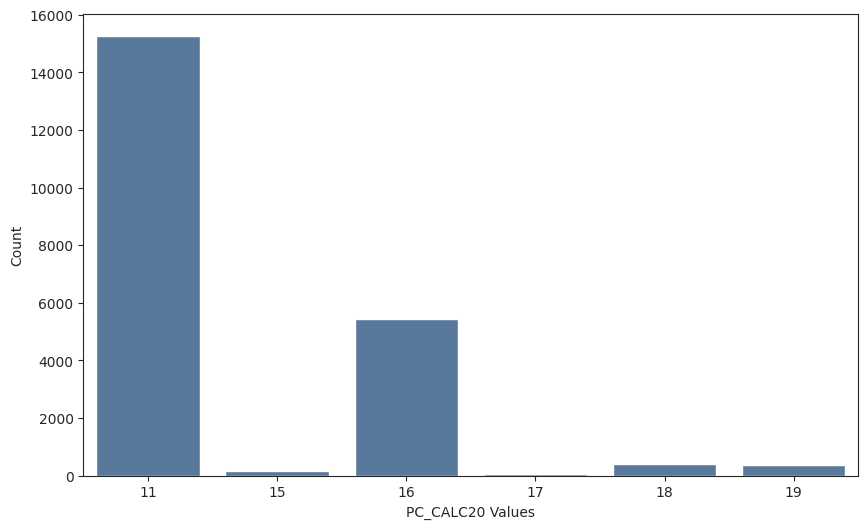

In [ ]:
# prompt: distribution of PC_CALC20

# Assuming 'PC_CALC20' is the column you want to analyze
plt.figure(figsize=(10, 6))
fig = sns.countplot(x='PC_CALC20', data=data)
# plt.title('Distribution of PC_CALC20')
plt.xlabel('PC_CALC20 Values')
plt.ylabel('Count')
plt.show()


In [ ]:
#specify data type
continuous = [
    'AVRG', 'MON', 'PSWEATERS', 'PKNIT_TOPS', 'PKNIT_DRES', 'PBLOUSES',
    'PJACKETS', 'PCAR_PNTS', 'PCAS_PNTS', 'PSHIRTS', 'PDRESSES', 'PSUITS',
    'POUTERWEAR', 'PJEWELRY', 'PFASHION', 'PLEGWEAR', 'PCOLLSPND',
    'AMSPEND', 'PSSPEND', 'CCSPEND', 'AXSPEND', 'TMONSPEND', 'OMONSPEND',
    'SMONSPEND', 'PREVPD', 'GMP', 'FREDAYS', 'MARKDOWN',
    'HI', 'LTFREDAY', 'PERCRET','DAYS','STYLES','FRE','RESPONSERATE',
]

discrete = [
    'PROMOS','CLASSES','COUPONS',
    'STORES','MAILED','RESPONDED','CLUSTYPE','PC_CALC20'
]

categorical =[]

binary = ['VALPHON','WEB','CC_CARD']
response = ['RESP']

# 3. Train test split

In [ ]:
# count each class of RESP

class_counts = data['RESP'].value_counts()
print(class_counts)


0    18129
1     3611
Name: RESP, dtype: int64


In [ ]:
from sklearn.model_selection import train_test_split

index_train, index_valid = train_test_split(np.array(data.index), stratify=data[response], #use stratify so train test split  balance btw 2 groups
                                            train_size=0.7, random_state= 42)


# Creating the training and validation DataFrames
train = data.loc[index_train].copy()  # Train set
valid = data.loc[index_valid].copy()   # Validation set




In [ ]:
#check whether split are balance
print(data['RESP'].mean(), train['RESP'].mean())

0.16609935602575898 0.16612998619964514


# 4. EDA

### 4.1 descriptive statistics


In [ ]:
pd.set_option('display.max_columns', None)
data.describe(include='number').round(2)

,ZIP_CODE,FRE,MON,CC_CARD,AVRG,PC_CALC20,PSWEATERS,PKNIT_TOPS,PKNIT_DRES,PBLOUSES,PJACKETS,PCAR_PNTS,PCAS_PNTS,PSHIRTS,PDRESSES,PSUITS,POUTERWEAR,PJEWELRY,PFASHION,PLEGWEAR,PCOLLSPND,AMSPEND,PSSPEND,CCSPEND,AXSPEND,TMONSPEND,OMONSPEND,SMONSPEND,PREVPD,GMP,PROMOS,DAYS,FREDAYS,MARKDOWN,CLASSES,COUPONS,STYLES,STORES,WEB,MAILED,RESPONDED,RESPONSERATE,HI,LTFREDAY,CLUSTYPE,PERCRET,RESP
count,21740.00,21740.00,21740.00,21740.00,21740.00,21740.00,21740.00,21740.00,21740.00,21740.00,21740.00,21740.00,21740.00,21740.00,21740.00,21740.00,21740.00,21740.00,21740.00,21740.00,21740.00,21740.00,21740.00,21740.00,21740.00,21740.00,21740.00,21740.00,21740.00,21740.00,21740.00,21740.00,21740.00,21740.00,21740.00,21740.00,21740.00,21740.00,21740.00,21740.00,21740.00,21740.00,21740.00,21740.00,21740.00,21740.00,21740.00
mean,48935.22,5.06,472.89,0.38,113.89,12.57,0.21,0.03,0.04,0.09,0.14,0.09,0.07,0.07,0.07,0.03,0.02,0.01,0.03,0.01,0.07,14.22,147.82,286.85,24.26,90.01,31.99,222.47,41.67,0.52,11.58,437.63,170.85,0.19,7.15,0.75,17.21,2.34,0.04,4.67,1.19,17.28,37.89,80.24,15.11,0.13,0.17
std,24086.45,6.42,640.05,0.49,87.25,2.46,0.23,0.07,0.11,0.14,0.18,0.14,0.13,0.12,0.16,0.13,0.10,0.04,0.08,0.05,0.17,149.86,395.14,441.46,113.86,184.62,97.16,362.77,108.11,0.14,7.14,192.90,146.17,0.13,5.35,1.67,24.62,1.60,0.20,3.55,1.83,24.54,28.15,78.73,12.21,0.56,0.37
min,0.00,1.00,0.99,0.00,0.49,11.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.01,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,1.00,0.00,1.00,0.00,1.00,1.00,0.00,0.00,0.00,0.00,0.05,0.09,0.00,0.00,0.00
25%,30339.00,1.00,135.60,0.00,60.99,11.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,78.00,0.00,0.00,0.00,0.00,0.00,0.46,5.00,287.00,67.00,0.09,3.00,0.00,5.00,1.00,0.00,1.00,0.00,0.00,18.41,24.96,5.00,0.00,0.00
50%,48335.00,3.00,263.49,0.00,92.07,11.00,0.16,0.00,0.00,0.05,0.04,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,147.60,0.00,0.00,0.00,108.00,0.00,0.55,12.00,447.00,124.00,0.18,6.00,0.00,9.00,2.00,0.00,4.00,0.00,0.00,29.52,52.00,11.00,0.00,0.00
75%,66707.00,6.00,569.00,1.00,139.50,16.00,0.31,0.03,0.03,0.14,0.23,0.13,0.09,0.10,0.06,0.00,0.00,0.00,0.03,0.00,0.03,0.00,127.94,321.94,0.00,109.99,0.00,287.57,0.00,0.62,17.00,630.00,230.00,0.28,10.00,1.00,20.00,3.00,0.00,8.00,2.00,30.00,50.00,107.00,22.00,0.09,0.00
max,99687.00,115.00,22511.49,1.00,1919.88,19.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,10642.72,11476.80,22511.49,4099.92,5562.46,2189.00,13224.07,2259.50,0.99,38.00,713.00,713.00,0.95,37.00,32.00,743.00,19.00,1.00,11.00,11.00,100.00,200.00,364.00,50.00,40.92,1.00


### 4.2 Inconsistency in data

as PERCRET which is percentage are recorded in different formats ( decimals and integers)
For example, we found 0.03 and 40.92
so we need to impute the data to standardize it, which will be done in feature engineering

In [ ]:

 data[data['PERCRET'] > 1]

,ZIP_CODE,FRE,MON,CC_CARD,AVRG,PC_CALC20,PSWEATERS,PKNIT_TOPS,PKNIT_DRES,PBLOUSES,PJACKETS,PCAR_PNTS,PCAS_PNTS,PSHIRTS,PDRESSES,PSUITS,POUTERWEAR,PJEWELRY,PFASHION,PLEGWEAR,PCOLLSPND,AMSPEND,PSSPEND,CCSPEND,AXSPEND,TMONSPEND,OMONSPEND,SMONSPEND,PREVPD,GMP,PROMOS,DAYS,FREDAYS,MARKDOWN,CLASSES,COUPONS,STYLES,STORES,VALPHON,WEB,MAILED,RESPONDED,RESPONSERATE,HI,LTFREDAY,CLUSTYPE,PERCRET,RESP
12,1331,5,106.38,0,21.27,16,0.12,0.000000,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.15,0.020000,0.08,0.00000,0.0,0.0,75.99,30.39,0.0,65.39,0.0,106.38,0.00,0.53,15,369,73.80,0.14,6,0,6,3,N,0,8,2,25.00,5.02,52.71,31,1.48,0
107,1860,5,168.99,0,33.79,11,0.00,0.000000,0.00,0.00,0.00,0.00,0.12,0.00,0.00,0.3,0.00,0.000000,0.00,0.00000,0.0,0.0,0.00,168.99,0.0,0.00,0.0,168.99,0.00,0.60,8,581,116.20,0.00,3,0,3,1,Y,1,0,0,0.00,11.15,29.05,25,1.29,0
128,1832,2,116.00,0,58.00,18,0.00,0.000000,0.00,0.31,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.000000,0.15,0.00000,0.0,78.0,0.00,38.00,0.0,0.00,0.0,0.00,0.00,0.67,7,310,155.00,0.00,3,0,3,2,Y,0,2,0,0.00,12.64,77.50,10,1.10,0
224,2842,3,9.92,1,3.30,11,0.00,0.080000,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.000000,0.00,0.00000,0.0,0.0,0.00,9.92,0.0,0.00,0.0,9.92,0.00,0.53,3,127,42.33,0.36,4,0,6,1,Y,0,0,0,0.00,0.75,42.33,15,10.52,0
275,2893,12,337.83,1,28.15,16,0.07,0.020000,0.09,0.01,0.17,0.05,0.00,0.02,0.00,0.0,0.00,0.006894,0.06,0.00928,0.0,0.0,234.35,103.48,0.0,0.00,0.0,76.84,37.49,0.53,21,614,51.16,0.20,14,3,25,5,Y,0,9,5,55.56,6.14,12.28,15,1.14,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21628,66214,2,13.49,0,6.74,11,0.00,0.000000,0.00,0.26,0.00,0.73,0.00,0.00,0.00,0.0,0.00,0.000000,0.00,0.00000,0.0,0.0,0.00,13.49,0.0,0.00,0.0,0.00,0.00,0.33,5,436,218.00,0.36,3,0,3,2,Y,0,2,0,0.00,112.47,19.81,8,2.52,0
21634,74135,20,477.57,1,23.87,11,0.09,0.003302,0.00,0.09,0.00,0.02,0.02,0.05,0.01,0.0,0.00,0.000000,0.00,0.01000,0.0,0.0,0.00,477.57,0.0,159.14,0.0,159.14,0.00,0.49,17,465,23.25,0.26,17,1,41,5,Y,0,6,1,16.67,2.37,11.07,12,1.98,1
21722,48603,4,104.99,0,26.24,19,0.00,0.000000,0.00,0.00,0.06,0.00,0.23,0.00,0.14,0.0,0.00,0.000000,0.00,0.00000,0.0,0.0,0.00,39.99,65.0,0.00,0.0,0.00,0.00,0.41,6,343,85.75,0.31,6,0,8,2,N,0,0,0,0.00,8.17,68.60,15,1.22,0
21729,58103,6,101.09,1,16.84,11,0.00,0.000000,0.00,0.05,0.40,0.00,0.00,0.00,0.00,0.0,0.00,0.000000,0.00,0.00000,0.4,0.0,0.00,101.09,0.0,11.99,0.0,101.09,0.00,0.68,7,150,25.00,0.07,5,1,5,2,Y,0,1,1,100.00,33.37,25.00,15,1.16,0


In [ ]:
data[data['PERCRET'] < 1]

,ZIP_CODE,FRE,MON,CC_CARD,AVRG,PC_CALC20,PSWEATERS,PKNIT_TOPS,PKNIT_DRES,PBLOUSES,PJACKETS,PCAR_PNTS,PCAS_PNTS,PSHIRTS,PDRESSES,PSUITS,POUTERWEAR,PJEWELRY,PFASHION,PLEGWEAR,PCOLLSPND,AMSPEND,PSSPEND,CCSPEND,AXSPEND,TMONSPEND,OMONSPEND,SMONSPEND,PREVPD,GMP,PROMOS,DAYS,FREDAYS,MARKDOWN,CLASSES,COUPONS,STYLES,STORES,VALPHON,WEB,MAILED,RESPONDED,RESPONSERATE,HI,LTFREDAY,CLUSTYPE,PERCRET,RESP
0,1001,2,368.46,0,184.23,11,0.18,0.00,0.00,0.30,0.00,0.25,0.00,0.19,0.00,0.0,0.0,0.000000,0.02,0.03,0.29,0.0,0.00,368.46,0.00,0.00,0.00,0.00,0.00,0.60,17,666,333.00,0.08,9,1,11,1,N,0,5,0,0.00,31.81,111.00,10,0.00,0
1,1028,4,258.00,1,64.50,11,0.26,0.16,0.00,0.00,0.00,0.18,0.14,0.00,0.18,0.0,0.0,0.000000,0.00,0.02,0.37,0.0,0.00,258.00,0.00,138.00,55.99,258.00,0.00,0.54,14,696,174.00,0.33,6,0,14,1,Y,0,4,2,50.00,32.72,43.50,10,0.03,1
2,1056,2,77.00,0,38.50,11,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.000000,0.00,0.00,0.00,0.0,0.00,77.00,0.00,0.00,0.00,0.00,39.00,0.62,10,343,171.50,0.11,1,0,2,1,N,0,4,0,0.00,100.00,68.60,16,0.00,0
3,1118,8,846.06,1,105.75,11,0.38,0.00,0.05,0.06,0.20,0.17,0.00,0.05,0.00,0.0,0.0,0.005307,0.03,0.01,0.00,0.0,0.00,846.06,0.00,104.94,0.00,373.87,166.25,0.43,24,701,87.62,0.29,15,3,35,1,Y,0,9,6,66.67,23.27,26.96,10,0.00,0
4,1107,1,87.44,0,87.44,11,0.20,0.20,0.00,0.00,0.00,0.00,0.41,0.00,0.00,0.0,0.0,0.170000,0.00,0.00,0.00,0.0,0.00,87.44,0.00,87.44,0.00,87.44,0.00,0.22,0,49,49.00,0.42,4,0,8,1,Y,0,0,0,0.00,28.52,24.50,20,0.00,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21734,63105,1,38.49,0,38.49,11,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.000000,0.00,0.00,0.00,0.0,0.00,38.49,0.00,0.00,0.00,0.00,0.00,0.10,7,257,257.00,0.44,1,0,2,1,N,0,1,0,0.00,100.00,257.00,1,0.00,0
21736,72207,6,280.59,0,46.76,11,0.02,0.00,0.00,0.06,0.22,0.03,0.00,0.10,0.00,0.0,0.0,0.000000,0.13,0.00,0.00,0.0,0.00,213.22,67.37,131.36,0.00,280.59,0.00,0.58,12,203,33.83,0.13,7,0,12,3,N,0,5,2,40.00,8.67,18.45,12,0.69,0
21737,77084,9,1274.96,0,141.66,16,0.29,0.04,0.01,0.14,0.23,0.12,0.00,0.00,0.00,0.0,0.0,0.000000,0.04,0.02,0.11,0.0,785.31,489.65,0.00,356.00,356.00,567.99,0.00,0.61,17,341,37.88,0.14,13,1,46,4,N,0,7,2,28.57,19.71,12.62,15,0.08,1
21738,78640,3,265.94,0,88.64,11,0.18,0.00,0.03,0.11,0.00,0.00,0.09,0.16,0.00,0.0,0.0,0.000000,0.00,0.07,0.16,0.0,13.99,251.95,0.00,0.00,0.00,0.00,0.00,0.56,12,257,85.66,0.12,9,0,15,2,Y,0,7,0,0.00,11.63,32.12,38,0.37,0


Findings:


*   all fraction spent on product category cannot add up to one. So, we assume there are other product category we don't have data
*   all percentage variables have various format

1. GMP --> decimal format 0.xx
2. Markdown --> decimal format 0.xx
3. Percret: We examined the PERCRET values in our dataset, where the format can vary, including values like 0.03, 1.29, and a maximum value of 40.92. It appears that some entries are recorded as percentages (e.g., 10% as 10) while others are recorded as decimals (e.g., 0.1).

  For example, a return rate of 0.03 represents 3%, while 40.92% should be recorded as 0.4092.

  Also, we found that there are more PERCRET values less than 1 than those greater than 1.
  
  To standardize the data and ensure consistency, we decided to divide all values greater than 1 by 100. (Done in 5.1 feature engineering). This adjustment allows us to accurately represent the return rates as decimals and improve the overall quality of our data.

### 4.3 Correlations between continuous and response variable
(code from tutorial 3)


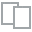
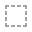
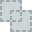
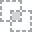
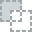
...
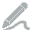
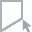
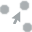
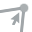
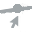

In [ ]:
from dataprep.eda import plot_correlation
plot_correlation(data[continuous + response], 'RESP')

# correlationpic = plot_correlation(data[continuous + response], 'RESP')

# correlationpic.save('correlationpic.png')



### 4.4 Correlations (filtered only high ones)
(chatgpt created code)

In [ ]:
# The output is correlation pairs either >0.7 or <-0.7

# Set the threshold for high positive or negative correlation
threshold = 0.7

# Calculate the correlation matrix
correlation_matrix = data.corr(numeric_only=True)

# Select the upper triangle of the correlation matrix to avoid duplicate pairs
upper_triangle = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape), k=1).astype(bool))

# Find all pairs with correlation greater than 0.7 or less than -0.7
high_corr_pairs = upper_triangle.stack().loc[lambda x: (x > threshold) | (x < -threshold)]

# Print the pairs of variables with high positive or negative correlation
high_corr_pairs

FRE        MON             0.721471
           CLASSES         0.775304
           STYLES          0.847534
           RESPONDED       0.758890
MON        CCSPEND         0.724070
           TMONSPEND       0.701226
           SMONSPEND       0.884879
           CLASSES         0.758178
           COUPONS         0.730927
           STYLES          0.917014
TMONSPEND  OMONSPEND       0.732065
           SMONSPEND       0.811246
SMONSPEND  STYLES          0.813971
GMP        MARKDOWN       -0.751307
PROMOS     MAILED          0.895559
CLASSES    STYLES          0.814071
           RESPONDED       0.742990
COUPONS    STYLES          0.734659
STYLES     RESPONDED       0.709013
RESPONDED  RESPONSERATE    0.824546
dtype: float64

We shall note that these pairs should not be in same model otherwise may create multicollinearity problem

### 4.5 Plots
(code from tutorial 3 and 4)

4.5.1 Distribution and statistics of continuous variables


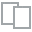
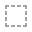
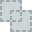
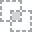
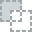
...
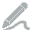
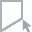
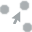
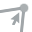
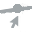

In [ ]:
from dataprep.eda import plot

plot(data[continuous])

In [ ]:
data

,ZIP_CODE,FRE,MON,CC_CARD,AVRG,PC_CALC20,PSWEATERS,PKNIT_TOPS,PKNIT_DRES,PBLOUSES,PJACKETS,PCAR_PNTS,PCAS_PNTS,PSHIRTS,PDRESSES,PSUITS,POUTERWEAR,PJEWELRY,PFASHION,PLEGWEAR,PCOLLSPND,AMSPEND,PSSPEND,CCSPEND,AXSPEND,TMONSPEND,OMONSPEND,SMONSPEND,PREVPD,GMP,PROMOS,DAYS,FREDAYS,MARKDOWN,CLASSES,COUPONS,STYLES,STORES,VALPHON,WEB,MAILED,RESPONDED,RESPONSERATE,HI,LTFREDAY,CLUSTYPE,PERCRET,RESP
0,1001,2,368.46,0,184.23,11,0.18,0.00,0.00,0.30,0.00,0.25,0.00,0.19,0.00,0.0,0.0,0.000000,0.02,0.03,0.29,0.0,0.00,368.46,0.00,0.00,0.00,0.00,0.00,0.60,17,666,333.00,0.08,9,1,11,1,N,0,5,0,0.00,31.81,111.00,10,0.00,0
1,1028,4,258.00,1,64.50,11,0.26,0.16,0.00,0.00,0.00,0.18,0.14,0.00,0.18,0.0,0.0,0.000000,0.00,0.02,0.37,0.0,0.00,258.00,0.00,138.00,55.99,258.00,0.00,0.54,14,696,174.00,0.33,6,0,14,1,Y,0,4,2,50.00,32.72,43.50,10,0.03,1
2,1056,2,77.00,0,38.50,11,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.000000,0.00,0.00,0.00,0.0,0.00,77.00,0.00,0.00,0.00,0.00,39.00,0.62,10,343,171.50,0.11,1,0,2,1,N,0,4,0,0.00,100.00,68.60,16,0.00,0
3,1118,8,846.06,1,105.75,11,0.38,0.00,0.05,0.06,0.20,0.17,0.00,0.05,0.00,0.0,0.0,0.005307,0.03,0.01,0.00,0.0,0.00,846.06,0.00,104.94,0.00,373.87,166.25,0.43,24,701,87.62,0.29,15,3,35,1,Y,0,9,6,66.67,23.27,26.96,10,0.00,0
4,1107,1,87.44,0,87.44,11,0.20,0.20,0.00,0.00,0.00,0.00,0.41,0.00,0.00,0.0,0.0,0.170000,0.00,0.00,0.00,0.0,0.00,87.44,0.00,87.44,0.00,87.44,0.00,0.22,0,49,49.00,0.42,4,0,8,1,Y,0,0,0,0.00,28.52,24.50,20,0.00,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21735,63105,2,39.00,0,19.50,11,0.00,0.00,0.39,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.000000,0.00,0.00,0.00,0.0,0.00,39.00,0.00,0.00,0.00,0.00,39.00,0.67,7,323,161.50,0.00,2,0,3,2,Y,0,1,0,0.00,15.83,107.66,1,1.51,0
21736,72207,6,280.59,0,46.76,11,0.02,0.00,0.00,0.06,0.22,0.03,0.00,0.10,0.00,0.0,0.0,0.000000,0.13,0.00,0.00,0.0,0.00,213.22,67.37,131.36,0.00,280.59,0.00,0.58,12,203,33.83,0.13,7,0,12,3,N,0,5,2,40.00,8.67,18.45,12,0.69,0
21737,77084,9,1274.96,0,141.66,16,0.29,0.04,0.01,0.14,0.23,0.12,0.00,0.00,0.00,0.0,0.0,0.000000,0.04,0.02,0.11,0.0,785.31,489.65,0.00,356.00,356.00,567.99,0.00,0.61,17,341,37.88,0.14,13,1,46,4,N,0,7,2,28.57,19.71,12.62,15,0.08,1
21738,78640,3,265.94,0,88.64,11,0.18,0.00,0.03,0.11,0.00,0.00,0.09,0.16,0.00,0.0,0.0,0.000000,0.00,0.07,0.16,0.0,13.99,251.95,0.00,0.00,0.00,0.00,0.00,0.56,12,257,85.66,0.12,9,0,15,2,Y,0,7,0,0.00,11.63,32.12,38,0.37,0


**Findings**
1. Almost every feature (except GMP) skewed to the right
Therefore, a transformation is needed.
We will choose Yeo-Johnson as the data contains zeros.
2. It seems like PSWEATERS has outliers so we specifically visualize it as below.


In [ ]:
# prompt: count unique value for every column in data

for column in data.columns:
  print(f"Unique values in column '{column}': {data[column].nunique()}")

Unique values in column 'ZIP_CODE': 7419
Unique values in column 'FRE': 76
Unique values in column 'MON': 14093
Unique values in column 'CC_CARD': 2
Unique values in column 'AVRG': 11078
Unique values in column 'PC_CALC20': 6
Unique values in column 'PSWEATERS': 135
Unique values in column 'PKNIT_TOPS': 515
Unique values in column 'PKNIT_DRES': 317
Unique values in column 'PBLOUSES': 161
Unique values in column 'PJACKETS': 121
Unique values in column 'PCAR_PNTS': 136
Unique values in column 'PCAS_PNTS': 203
Unique values in column 'PSHIRTS': 149
Unique values in column 'PDRESSES': 161
Unique values in column 'PSUITS': 113
Unique values in column 'POUTERWEAR': 133
Unique values in column 'PJEWELRY': 910
Unique values in column 'PFASHION': 478
Unique values in column 'PLEGWEAR': 1023
Unique values in column 'PCOLLSPND': 139
Unique values in column 'AMSPEND': 769
Unique values in column 'PSSPEND': 6303
Unique values in column 'CCSPEND': 11358
Unique values in column 'AXSPEND': 1969
Unique

4.5.1.1 Outliers analysis


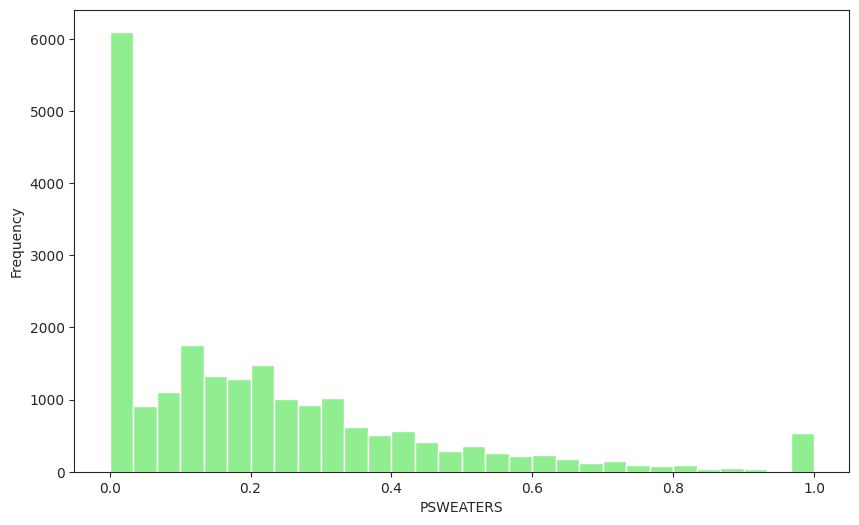

In [ ]:

plt.figure(figsize=(10, 6))
plt.hist(data['PSWEATERS'], bins=30, color='lightgreen')
# plt.title('Distribution of PSWEATERS')
plt.xlabel('PSWEATERS')
plt.ylabel('Frequency')
# plt.title('Histogram of PSWEATERS')
plt.show()


Findings:
After further analysis, we view that it is totally fine and make sense for this variable to have 1.0 as it is a fraction spent on product category. Some customers might spend a lot on this category,
Also, from seeing other variables which are product category, they all have maximum value = 1, indicating that some customers just dedicate their entire spending to a single category

We decide to investigate further on fraction spent on each product category of each customer.

**Investigate fraction spent on product category**


In [ ]:
# prompt: Sum of product category fraction in each row. Are all add up to either less than 1 or equal to 1. List out details where more than 1

product_categories = [
    'PSWEATERS', 'PKNIT_TOPS', 'PKNIT_DRES', 'PBLOUSES',
    'PJACKETS', 'PCAR_PNTS', 'PCAS_PNTS', 'PSHIRTS', 'PDRESSES', 'PSUITS',
    'POUTERWEAR', 'PJEWELRY', 'PFASHION', 'PLEGWEAR', 'PCOLLSPND',
]

rows_with_sum_greater_than_1 = []
for index, row in data.iterrows():
  sum_of_categories = row[product_categories].sum()
  if sum_of_categories > 1:
    rows_with_sum_greater_than_1.append(index)

print("Rows where the sum of product category fractions is greater than 1:")
print(data.loc[rows_with_sum_greater_than_1, product_categories])


Rows where the sum of product category fractions is greater than 1:
       PSWEATERS  PKNIT_TOPS  PKNIT_DRES  PBLOUSES  PJACKETS  PCAR_PNTS  \
0           0.18        0.00         0.0      0.30      0.00       0.25   
1           0.26        0.16         0.0      0.00      0.00       0.18   
8           0.24        0.00         0.0      0.00      0.31       0.18   
23          0.00        0.00         0.0      0.06      0.60       0.10   
32          0.00        0.12         0.0      0.00      0.12       0.48   
...          ...         ...         ...       ...       ...        ...   
21720       0.37        0.04         0.0      0.04      0.22       0.00   
21723       0.00        0.00         0.0      0.05      0.58       0.35   
21726       0.35        0.00         0.0      0.11      0.20       0.00   
21727       0.00        0.00         0.0      0.02      0.22       0.00   
21733       0.17        0.00         0.0      0.00      0.23       0.14   

       PCAS_PNTS  PSHIRTS  PDRE

In [ ]:
# prompt: Regarding fraction spent on product category, when one category is 1 is other category all 0? list out all detail where one product category column has a value of 1 and the rest are NOT 0:

product_categories = [
    'PSWEATERS', 'PKNIT_TOPS', 'PKNIT_DRES', 'PBLOUSES',
    'PJACKETS', 'PCAR_PNTS', 'PCAS_PNTS', 'PSHIRTS', 'PDRESSES', 'PSUITS',
    'POUTERWEAR', 'PJEWELRY', 'PFASHION', 'PLEGWEAR', 'PCOLLSPND',
]

rows_with_one_category_1 = []
for index, row in data.iterrows():
  count_1 = 0
  count_not_0 = 0
  for category in product_categories:
    if row[category] == 1:
      count_1 += 1
    elif row[category] != 0:
      count_not_0 += 1

  if count_1 == 1 and count_not_0 > 0:
    rows_with_one_category_1.append(index)

print("Rows with one product category column equal to 1 and others not equal to 0:")
print(data.loc[rows_with_one_category_1, product_categories])


Rows with one product category column equal to 1 and others not equal to 0:
       PSWEATERS  PKNIT_TOPS  PKNIT_DRES  PBLOUSES  PJACKETS  PCAR_PNTS  \
534          0.0         0.0         0.0       0.0      0.55       0.00   
536          0.0         0.0         0.0       0.0      0.62       0.37   
585          0.0         0.0         0.0       0.0      0.62       0.37   
683          0.0         0.0         0.0       0.0      0.00       0.00   
978          0.0         0.0         0.0       0.0      0.00       1.00   
...          ...         ...         ...       ...       ...        ...   
21243        0.0         0.0         0.0       0.0      0.00       1.00   
21467        0.0         0.0         0.0       0.0      0.66       0.00   
21480        0.0         0.0         0.0       0.0      0.45       0.54   
21577        0.0         0.0         0.0       0.0      0.00       0.00   
21619        0.0         0.0         0.0       0.0      0.58       0.00   

       PCAS_PNTS  PSHIR

Assumptions:

1.  We assume the difference between 1 and the sum of fractions represents spending on unobserved product categories. For example, if the sum is 0.6, assume 0.4 was spent on other unobserved categories.
2. For the row sum of product category > 1, we assume it's error. However, we will try to focus on individual category behavior and its relationship with RESP






Compare mean of each variable where RESP = 0 vs RESP = 1

In [ ]:
# prompt: Get me insights of RESP = 1. I want to know what probably make RESP =1. And also compare with where RESP =0. Also get me percentage of difference.

# Separate data into two groups based on RESP
resp_1 = data[data['RESP'] == 1]
resp_0 = data[data['RESP'] == 0]


resp_1 = resp_1.drop(['ZIP_CODE','RESP'], axis=1)

resp_0 = resp_0.drop(['ZIP_CODE','RESP'], axis=1)


# Calculate the mean of each feature for both groups
resp_1_mean = resp_1.mean()
resp_0_mean = resp_0.mean()

# Calculate the percentage difference
percentage_difference = ((resp_1_mean - resp_0_mean) / resp_0_mean) * 100

# Display insights
print("Insights for RESP = 1 compared to RESP = 0:")
print(pd.concat([resp_1_mean, resp_0_mean, percentage_difference], axis=1, keys=['RESP = 1 Mean', 'RESP = 0 Mean', 'Percentage Difference']))


Insights for RESP = 1 compared to RESP = 0:
              RESP = 1 Mean  RESP = 0 Mean  Percentage Difference
FRE               10.927721       3.896299             180.464142
MON              935.815159     380.680772             145.826747
CC_CARD            0.646635       0.331403              95.120689
AVRG             100.699499     116.516259             -13.574724
PC_CALC20         13.087510      12.469083               4.959689
PSWEATERS          0.198114       0.216763              -8.603299
PKNIT_TOPS         0.027503       0.027096               1.502749
PKNIT_DRES         0.040515       0.041450              -2.255478
PBLOUSES           0.087941       0.094586              -7.024818
PJACKETS           0.128132       0.137058              -6.512377
PCAR_PNTS          0.078163       0.087565             -10.737522
PCAS_PNTS          0.065708       0.069998              -6.128594
PSHIRTS            0.063968       0.066747              -4.163361
PDRESSES           0.060132     


Findings:



(GEMINI help rewriting to make it grammatically better)


1.   Customers who responded to the campaign (RESP =
1) exhibit significantly higher average values for frequency of purchases (FRE), average monthly spending (MON), and spending across various product categories (e.g., AMSPEND, PSSPEND, CCSPEND). This suggests that customers who are more engaged with the company and have a higher spending history are more likely to respond positively to marketing campaigns.
2.   There's a noticeable difference in the average number of product classes purchased (CLASSES) between the two groups. Customers who responded to the campaign tend to purchase a wider variety of product classes compared to those who didn't respond. This indicates that customers with diverse purchasing patterns are more likely to be receptive to the campaign.






This is for Latex usage later

In [ ]:
# prompt: get number like table above but for only FRE, MON, all spending categories, and PCLASS. Get table be able to copy to Latex

# Specify the columns of interest
columns_of_interest = ['FRE', 'MON', 'AMSPEND', 'PSSPEND', 'CCSPEND', 'AXSPEND', 'TMONSPEND', 'OMONSPEND', 'SMONSPEND', 'CLASSES']

# Separate data into two groups based on RESP
resp_1 = data[data['RESP'] == 1]
resp_0 = data[data['RESP'] == 0]

# Calculate the mean of each feature for both groups
resp_1_mean = resp_1[columns_of_interest].mean()
resp_0_mean = resp_0[columns_of_interest].mean()

# Calculate the percentage difference
percentage_difference = ((resp_1_mean - resp_0_mean) / resp_0_mean) * 100

# Display insights in a table format suitable for copying to LaTeX
insights_table = pd.concat([resp_1_mean, resp_0_mean, percentage_difference], axis=1, keys=['RESP = 1 Mean', 'RESP = 0 Mean', 'Percentage Difference'])
print(insights_table.to_latex(float_format="%.3f"))


\begin{tabular}{lrrr}
\toprule
{} &  RESP = 1 Mean &  RESP = 0 Mean &  Percentage Difference \\
\midrule
FRE       &         10.928 &          3.896 &                180.464 \\
MON       &        935.815 &        380.681 &                145.827 \\
AMSPEND   &         31.758 &         10.724 &                196.140 \\
PSSPEND   &        330.328 &        111.470 &                196.338 \\
CCSPEND   &        519.537 &        240.505 &                116.020 \\
AXSPEND   &         54.512 &         18.231 &                199.009 \\
TMONSPEND &        200.744 &         67.951 &                195.424 \\
OMONSPEND &         76.484 &         23.128 &                230.697 \\
SMONSPEND &        474.571 &        172.258 &                175.501 \\
CLASSES   &         11.611 &          6.257 &                 85.583 \\
\bottomrule
\end{tabular}



<ipython-input-72-29b81f799b16>:19: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  print(insights_table.to_latex(float_format="%.3f"))


4.5.2 Distribution between discrete & binary variables with response variable

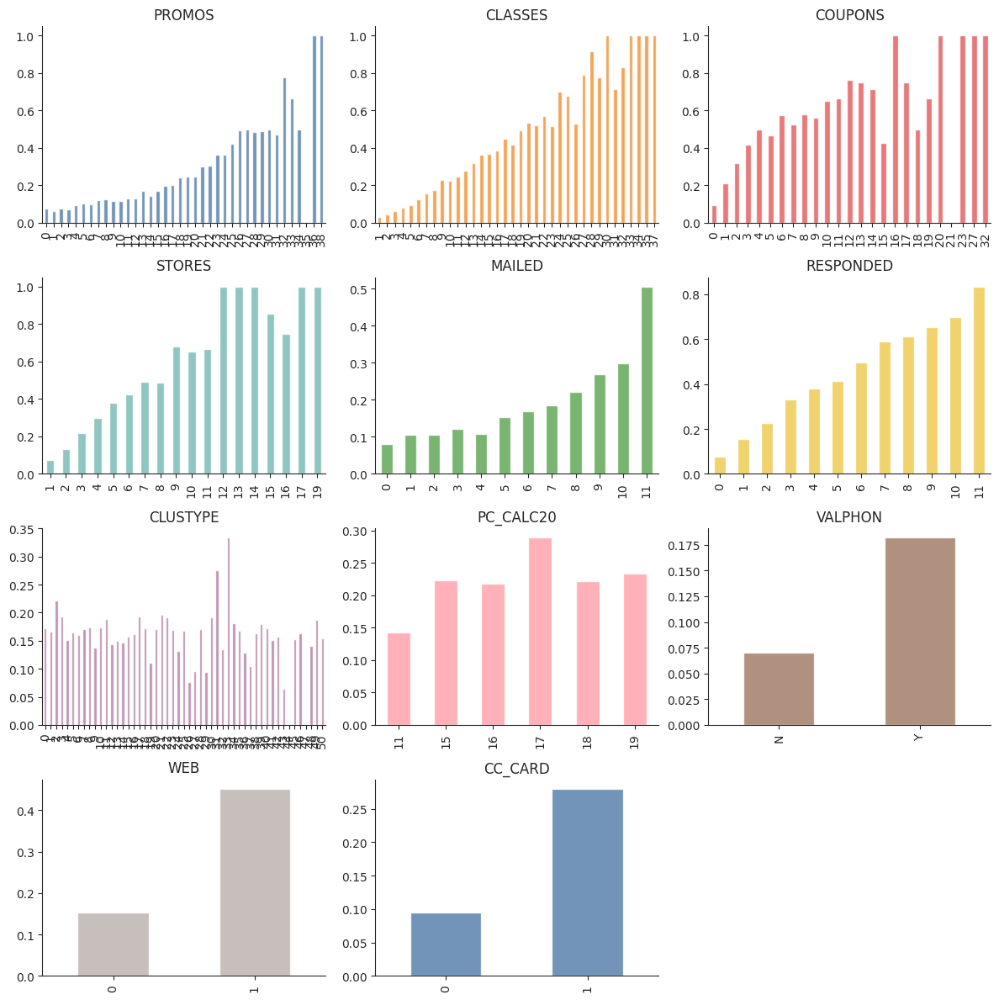

In [ ]:
from tutorial4 import crosstabplots

crosstabplots(data[discrete + binary], data['RESP'])
plt.show()


Findings
1. Whether customers respond to the campaign seems to vary across different factors.

2. Customers who received high number of marketing promotions on file (PROMOS) , have high numbers of responses to the campaign in the past (RESPONDED), received high number of promotion mailed in the past
year (MAILED) are more likely to respond to the campaign.

4.5.3 Check association of continuous variable with response variable

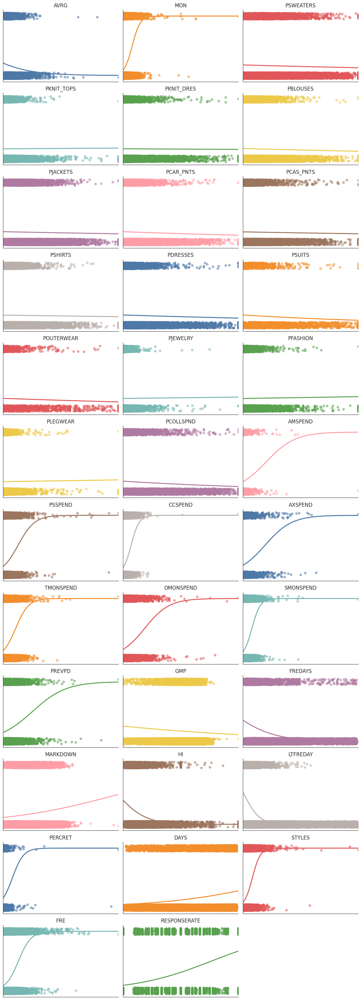

In [ ]:
from tutorial4 import regplots

fig, ax = regplots(data[continuous], data['RESP'])
plt.show()


**Insights**

1.   MON, AMSPEND, PSSPEND, CCSPEND, AXSPEND, TMONSPEND, OMONSPEND, SMONSPEND, PREVPD, MARKDOWN, RESPONSERATE, PERCRET seems to have positive association with response
2.  AVRG, FREDAYS, HI, LTFREDAY seems to have negative association with response



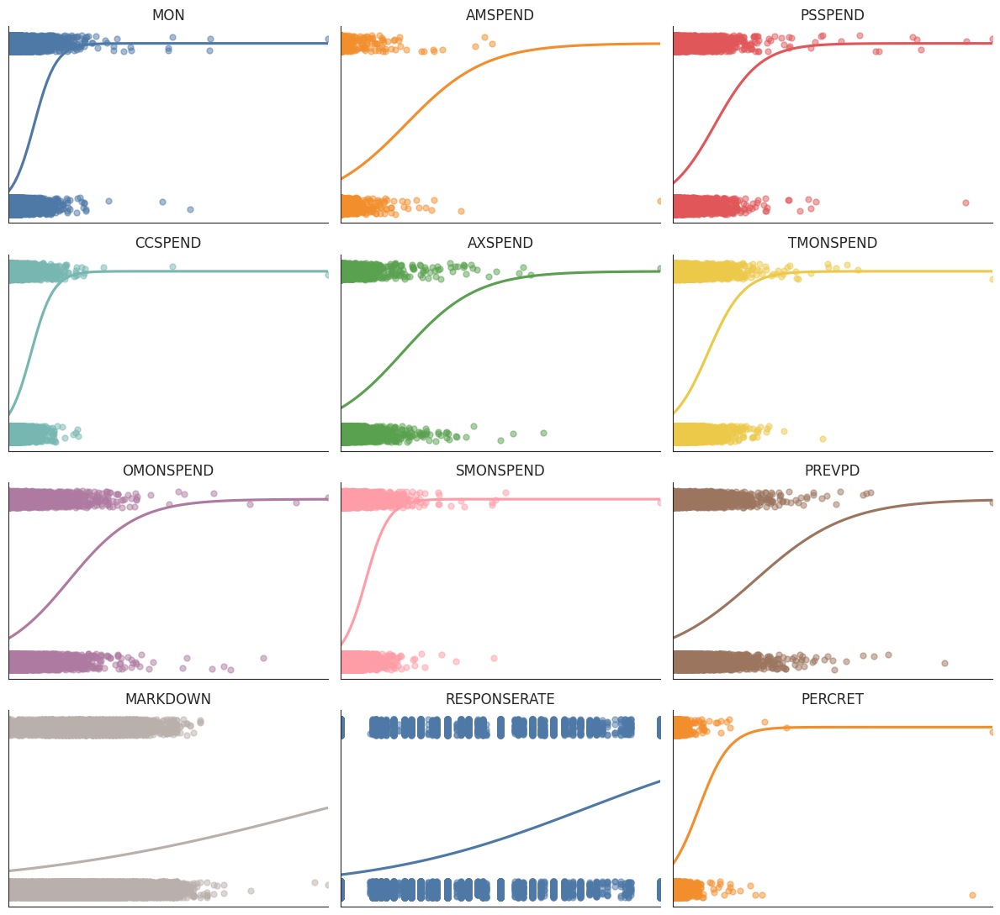

In [ ]:
# prompt: MON, AMSPEND, PSSPEND, CCSPEND, AXSPEND, TMONSPEND, OMONSPEND, SMONSPEND, PREVPD, MARKDOWN, RESPONSERATE, PERCRET seems to have positive association with response ---> regplot

# Specify the columns of interest for the regplots
columns_of_interest = ['MON', 'AMSPEND', 'PSSPEND', 'CCSPEND', 'AXSPEND', 'TMONSPEND', 'OMONSPEND', 'SMONSPEND', 'PREVPD', 'MARKDOWN', 'RESPONSERATE', 'PERCRET']

# Create regplots for the specified columns
fig, ax = regplots(data[columns_of_interest], data['RESP'])
plt.show()

### 4.6 Strength of association between predictors and response
(code from tutorial 4)

In [ ]:
from sklearn.feature_selection import mutual_info_classif
from sklearn.preprocessing import OrdinalEncoder

mi = mutual_info_classif(data[continuous], data['RESP'], random_state=1)
results1 = pd.DataFrame(mi, index=continuous, columns=['MI'])

In [ ]:
features = OrdinalEncoder().fit_transform(data[discrete + binary])

mi = mutual_info_classif(features, data['RESP'], n_neighbors=5,
                         random_state=1, discrete_features=True)

results2 = pd.DataFrame(mi, index=discrete+ binary, columns=['MI'])

In [ ]:
results = pd.concat([results1, results2], axis=0).sort_values(by='MI', ascending=False).round(4)
results.round(4)

,MI
LTFREDAY,0.1044
FRE,0.0822
STYLES,0.0726
FREDAYS,0.0653
CLASSES,0.0637
MON,0.0556
RESPONSERATE,0.0543
RESPONDED,0.0537
SMONSPEND,0.0522
COUPONS,0.0459


In [ ]:
# prompt: get top 10 MI values as Latex table

# Assuming 'results' DataFrame is already created as shown in your code.

top_10_mi = results.sort_values(by='MI', ascending=False).head(10)

print(top_10_mi.to_latex(float_format="%.4f"))

\begin{tabular}{lr}
\toprule
{} &     MI \\
\midrule
LTFREDAY     & 0.1044 \\
FRE          & 0.0822 \\
STYLES       & 0.0726 \\
FREDAYS      & 0.0653 \\
CLASSES      & 0.0637 \\
MON          & 0.0556 \\
RESPONSERATE & 0.0543 \\
RESPONDED    & 0.0537 \\
SMONSPEND    & 0.0522 \\
COUPONS      & 0.0459 \\
\bottomrule
\end{tabular}



<ipython-input-79-0a0e57ce0838>:7: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  print(top_10_mi.to_latex(float_format="%.4f"))


Findings

MI value indicate strength of association between each predictor and RESP
FREDAYS, LTFREDAY, FRE are having top 3 highest MI. Therefore these 3 are interesting to use as predictors of the model.


# 5. Feature engineering

### 5.1 Impute data
- Dummy encoding (VALPHON)
Note: we label as data_v first, but when finished encoding, we merge it back to data

- Percret formatting

In [ ]:
# Dummy encoding for VALPHON
data_v= pd.get_dummies(data, columns=['VALPHON'],drop_first=True).astype(int)

In [ ]:
data_v

,ZIP_CODE,FRE,MON,CC_CARD,AVRG,PC_CALC20,PSWEATERS,PKNIT_TOPS,PKNIT_DRES,PBLOUSES,PJACKETS,PCAR_PNTS,PCAS_PNTS,PSHIRTS,PDRESSES,PSUITS,POUTERWEAR,PJEWELRY,PFASHION,PLEGWEAR,PCOLLSPND,AMSPEND,PSSPEND,CCSPEND,AXSPEND,TMONSPEND,OMONSPEND,SMONSPEND,PREVPD,GMP,PROMOS,DAYS,FREDAYS,MARKDOWN,CLASSES,COUPONS,STYLES,STORES,WEB,MAILED,RESPONDED,RESPONSERATE,HI,LTFREDAY,CLUSTYPE,PERCRET,RESP,VALPHON_Y
0,1001,2,368,0,184,11,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,368,0,0,0,0,0,0,17,666,333,0,9,1,11,1,0,5,0,0,31,111,10,0,0,0
1,1028,4,258,1,64,11,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,258,0,138,55,258,0,0,14,696,174,0,6,0,14,1,0,4,2,50,32,43,10,0,1,1
2,1056,2,77,0,38,11,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,77,0,0,0,0,39,0,10,343,171,0,1,0,2,1,0,4,0,0,100,68,16,0,0,0
3,1118,8,846,1,105,11,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,846,0,104,0,373,166,0,24,701,87,0,15,3,35,1,0,9,6,66,23,26,10,0,0,1
4,1107,1,87,0,87,11,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,87,0,87,0,87,0,0,0,49,49,0,4,0,8,1,0,0,0,0,28,24,20,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21735,63105,2,39,0,19,11,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,39,0,0,0,0,39,0,7,323,161,0,2,0,3,2,0,1,0,0,15,107,1,1,0,1
21736,72207,6,280,0,46,11,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,213,67,131,0,280,0,0,12,203,33,0,7,0,12,3,0,5,2,40,8,18,12,0,0,0
21737,77084,9,1274,0,141,16,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,785,489,0,356,356,567,0,0,17,341,37,0,13,1,46,4,0,7,2,28,19,12,15,0,1,0
21738,78640,3,265,0,88,11,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,13,251,0,0,0,0,0,0,12,257,85,0,9,0,15,2,0,7,0,0,11,32,38,0,0,1


In [ ]:
data

,ZIP_CODE,FRE,MON,CC_CARD,AVRG,PC_CALC20,PSWEATERS,PKNIT_TOPS,PKNIT_DRES,PBLOUSES,PJACKETS,PCAR_PNTS,PCAS_PNTS,PSHIRTS,PDRESSES,PSUITS,POUTERWEAR,PJEWELRY,PFASHION,PLEGWEAR,PCOLLSPND,AMSPEND,PSSPEND,CCSPEND,AXSPEND,TMONSPEND,OMONSPEND,SMONSPEND,PREVPD,GMP,PROMOS,DAYS,FREDAYS,MARKDOWN,CLASSES,COUPONS,STYLES,STORES,VALPHON,WEB,MAILED,RESPONDED,RESPONSERATE,HI,LTFREDAY,CLUSTYPE,PERCRET,RESP
0,1001,2,368.46,0,184.23,11,0.18,0.00,0.00,0.30,0.00,0.25,0.00,0.19,0.00,0.0,0.0,0.000000,0.02,0.03,0.29,0.0,0.00,368.46,0.00,0.00,0.00,0.00,0.00,0.60,17,666,333.00,0.08,9,1,11,1,N,0,5,0,0.00,31.81,111.00,10,0.00,0
1,1028,4,258.00,1,64.50,11,0.26,0.16,0.00,0.00,0.00,0.18,0.14,0.00,0.18,0.0,0.0,0.000000,0.00,0.02,0.37,0.0,0.00,258.00,0.00,138.00,55.99,258.00,0.00,0.54,14,696,174.00,0.33,6,0,14,1,Y,0,4,2,50.00,32.72,43.50,10,0.03,1
2,1056,2,77.00,0,38.50,11,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.000000,0.00,0.00,0.00,0.0,0.00,77.00,0.00,0.00,0.00,0.00,39.00,0.62,10,343,171.50,0.11,1,0,2,1,N,0,4,0,0.00,100.00,68.60,16,0.00,0
3,1118,8,846.06,1,105.75,11,0.38,0.00,0.05,0.06,0.20,0.17,0.00,0.05,0.00,0.0,0.0,0.005307,0.03,0.01,0.00,0.0,0.00,846.06,0.00,104.94,0.00,373.87,166.25,0.43,24,701,87.62,0.29,15,3,35,1,Y,0,9,6,66.67,23.27,26.96,10,0.00,0
4,1107,1,87.44,0,87.44,11,0.20,0.20,0.00,0.00,0.00,0.00,0.41,0.00,0.00,0.0,0.0,0.170000,0.00,0.00,0.00,0.0,0.00,87.44,0.00,87.44,0.00,87.44,0.00,0.22,0,49,49.00,0.42,4,0,8,1,Y,0,0,0,0.00,28.52,24.50,20,0.00,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21735,63105,2,39.00,0,19.50,11,0.00,0.00,0.39,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.000000,0.00,0.00,0.00,0.0,0.00,39.00,0.00,0.00,0.00,0.00,39.00,0.67,7,323,161.50,0.00,2,0,3,2,Y,0,1,0,0.00,15.83,107.66,1,1.51,0
21736,72207,6,280.59,0,46.76,11,0.02,0.00,0.00,0.06,0.22,0.03,0.00,0.10,0.00,0.0,0.0,0.000000,0.13,0.00,0.00,0.0,0.00,213.22,67.37,131.36,0.00,280.59,0.00,0.58,12,203,33.83,0.13,7,0,12,3,N,0,5,2,40.00,8.67,18.45,12,0.69,0
21737,77084,9,1274.96,0,141.66,16,0.29,0.04,0.01,0.14,0.23,0.12,0.00,0.00,0.00,0.0,0.0,0.000000,0.04,0.02,0.11,0.0,785.31,489.65,0.00,356.00,356.00,567.99,0.00,0.61,17,341,37.88,0.14,13,1,46,4,N,0,7,2,28.57,19.71,12.62,15,0.08,1
21738,78640,3,265.94,0,88.64,11,0.18,0.00,0.03,0.11,0.00,0.00,0.09,0.16,0.00,0.0,0.0,0.000000,0.00,0.07,0.16,0.0,13.99,251.95,0.00,0.00,0.00,0.00,0.00,0.56,12,257,85.66,0.12,9,0,15,2,Y,0,7,0,0.00,11.63,32.12,38,0.37,0


In [ ]:
data['VALPHON'] = data_v['VALPHON_Y']

In [ ]:
#check if it's correctly merged
data

,ZIP_CODE,FRE,MON,CC_CARD,AVRG,PC_CALC20,PSWEATERS,PKNIT_TOPS,PKNIT_DRES,PBLOUSES,PJACKETS,PCAR_PNTS,PCAS_PNTS,PSHIRTS,PDRESSES,PSUITS,POUTERWEAR,PJEWELRY,PFASHION,PLEGWEAR,PCOLLSPND,AMSPEND,PSSPEND,CCSPEND,AXSPEND,TMONSPEND,OMONSPEND,SMONSPEND,PREVPD,GMP,PROMOS,DAYS,FREDAYS,MARKDOWN,CLASSES,COUPONS,STYLES,STORES,VALPHON,WEB,MAILED,RESPONDED,RESPONSERATE,HI,LTFREDAY,CLUSTYPE,PERCRET,RESP
0,1001,2,368.46,0,184.23,11,0.18,0.00,0.00,0.30,0.00,0.25,0.00,0.19,0.00,0.0,0.0,0.000000,0.02,0.03,0.29,0.0,0.00,368.46,0.00,0.00,0.00,0.00,0.00,0.60,17,666,333.00,0.08,9,1,11,1,0,0,5,0,0.00,31.81,111.00,10,0.00,0
1,1028,4,258.00,1,64.50,11,0.26,0.16,0.00,0.00,0.00,0.18,0.14,0.00,0.18,0.0,0.0,0.000000,0.00,0.02,0.37,0.0,0.00,258.00,0.00,138.00,55.99,258.00,0.00,0.54,14,696,174.00,0.33,6,0,14,1,1,0,4,2,50.00,32.72,43.50,10,0.03,1
2,1056,2,77.00,0,38.50,11,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.000000,0.00,0.00,0.00,0.0,0.00,77.00,0.00,0.00,0.00,0.00,39.00,0.62,10,343,171.50,0.11,1,0,2,1,0,0,4,0,0.00,100.00,68.60,16,0.00,0
3,1118,8,846.06,1,105.75,11,0.38,0.00,0.05,0.06,0.20,0.17,0.00,0.05,0.00,0.0,0.0,0.005307,0.03,0.01,0.00,0.0,0.00,846.06,0.00,104.94,0.00,373.87,166.25,0.43,24,701,87.62,0.29,15,3,35,1,1,0,9,6,66.67,23.27,26.96,10,0.00,0
4,1107,1,87.44,0,87.44,11,0.20,0.20,0.00,0.00,0.00,0.00,0.41,0.00,0.00,0.0,0.0,0.170000,0.00,0.00,0.00,0.0,0.00,87.44,0.00,87.44,0.00,87.44,0.00,0.22,0,49,49.00,0.42,4,0,8,1,1,0,0,0,0.00,28.52,24.50,20,0.00,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21735,63105,2,39.00,0,19.50,11,0.00,0.00,0.39,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.000000,0.00,0.00,0.00,0.0,0.00,39.00,0.00,0.00,0.00,0.00,39.00,0.67,7,323,161.50,0.00,2,0,3,2,1,0,1,0,0.00,15.83,107.66,1,1.51,0
21736,72207,6,280.59,0,46.76,11,0.02,0.00,0.00,0.06,0.22,0.03,0.00,0.10,0.00,0.0,0.0,0.000000,0.13,0.00,0.00,0.0,0.00,213.22,67.37,131.36,0.00,280.59,0.00,0.58,12,203,33.83,0.13,7,0,12,3,0,0,5,2,40.00,8.67,18.45,12,0.69,0
21737,77084,9,1274.96,0,141.66,16,0.29,0.04,0.01,0.14,0.23,0.12,0.00,0.00,0.00,0.0,0.0,0.000000,0.04,0.02,0.11,0.0,785.31,489.65,0.00,356.00,356.00,567.99,0.00,0.61,17,341,37.88,0.14,13,1,46,4,0,0,7,2,28.57,19.71,12.62,15,0.08,1
21738,78640,3,265.94,0,88.64,11,0.18,0.00,0.03,0.11,0.00,0.00,0.09,0.16,0.00,0.0,0.0,0.000000,0.00,0.07,0.16,0.0,13.99,251.95,0.00,0.00,0.00,0.00,0.00,0.56,12,257,85.66,0.12,9,0,15,2,1,0,7,0,0.00,11.63,32.12,38,0.37,0


In [ ]:
#impute percret as mentioned in EDA that it has  inconsitent format
data.loc[data['PERCRET'] > 1, 'PERCRET'] = data.loc[data['PERCRET'] > 1, 'PERCRET'] / 100


### 5.2 Dummy, Yeo-Johnson transformation (as lots of variables are skewed to the right)

In [ ]:
data

,ZIP_CODE,FRE,MON,CC_CARD,AVRG,PC_CALC20,PSWEATERS,PKNIT_TOPS,PKNIT_DRES,PBLOUSES,PJACKETS,PCAR_PNTS,PCAS_PNTS,PSHIRTS,PDRESSES,PSUITS,POUTERWEAR,PJEWELRY,PFASHION,PLEGWEAR,PCOLLSPND,AMSPEND,PSSPEND,CCSPEND,AXSPEND,TMONSPEND,OMONSPEND,SMONSPEND,PREVPD,GMP,PROMOS,DAYS,FREDAYS,MARKDOWN,CLASSES,COUPONS,STYLES,STORES,VALPHON,WEB,MAILED,RESPONDED,RESPONSERATE,HI,LTFREDAY,CLUSTYPE,PERCRET,RESP
0,1001,2,368.46,0,184.23,11,0.18,0.00,0.00,0.30,0.00,0.25,0.00,0.19,0.00,0.0,0.0,0.000000,0.02,0.03,0.29,0.0,0.00,368.46,0.00,0.00,0.00,0.00,0.00,0.60,17,666,333.00,0.08,9,1,11,1,0,0,5,0,0.00,31.81,111.00,10,0.0000,0
1,1028,4,258.00,1,64.50,11,0.26,0.16,0.00,0.00,0.00,0.18,0.14,0.00,0.18,0.0,0.0,0.000000,0.00,0.02,0.37,0.0,0.00,258.00,0.00,138.00,55.99,258.00,0.00,0.54,14,696,174.00,0.33,6,0,14,1,1,0,4,2,50.00,32.72,43.50,10,0.0300,1
2,1056,2,77.00,0,38.50,11,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.000000,0.00,0.00,0.00,0.0,0.00,77.00,0.00,0.00,0.00,0.00,39.00,0.62,10,343,171.50,0.11,1,0,2,1,0,0,4,0,0.00,100.00,68.60,16,0.0000,0
3,1118,8,846.06,1,105.75,11,0.38,0.00,0.05,0.06,0.20,0.17,0.00,0.05,0.00,0.0,0.0,0.005307,0.03,0.01,0.00,0.0,0.00,846.06,0.00,104.94,0.00,373.87,166.25,0.43,24,701,87.62,0.29,15,3,35,1,1,0,9,6,66.67,23.27,26.96,10,0.0000,0
4,1107,1,87.44,0,87.44,11,0.20,0.20,0.00,0.00,0.00,0.00,0.41,0.00,0.00,0.0,0.0,0.170000,0.00,0.00,0.00,0.0,0.00,87.44,0.00,87.44,0.00,87.44,0.00,0.22,0,49,49.00,0.42,4,0,8,1,1,0,0,0,0.00,28.52,24.50,20,0.0000,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21735,63105,2,39.00,0,19.50,11,0.00,0.00,0.39,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.000000,0.00,0.00,0.00,0.0,0.00,39.00,0.00,0.00,0.00,0.00,39.00,0.67,7,323,161.50,0.00,2,0,3,2,1,0,1,0,0.00,15.83,107.66,1,0.0151,0
21736,72207,6,280.59,0,46.76,11,0.02,0.00,0.00,0.06,0.22,0.03,0.00,0.10,0.00,0.0,0.0,0.000000,0.13,0.00,0.00,0.0,0.00,213.22,67.37,131.36,0.00,280.59,0.00,0.58,12,203,33.83,0.13,7,0,12,3,0,0,5,2,40.00,8.67,18.45,12,0.6900,0
21737,77084,9,1274.96,0,141.66,16,0.29,0.04,0.01,0.14,0.23,0.12,0.00,0.00,0.00,0.0,0.0,0.000000,0.04,0.02,0.11,0.0,785.31,489.65,0.00,356.00,356.00,567.99,0.00,0.61,17,341,37.88,0.14,13,1,46,4,0,0,7,2,28.57,19.71,12.62,15,0.0800,1
21738,78640,3,265.94,0,88.64,11,0.18,0.00,0.03,0.11,0.00,0.00,0.09,0.16,0.00,0.0,0.0,0.000000,0.00,0.07,0.16,0.0,13.99,251.95,0.00,0.00,0.00,0.00,0.00,0.56,12,257,85.66,0.12,9,0,15,2,1,0,7,0,0.00,11.63,32.12,38,0.3700,0


In [ ]:
data

,ZIP_CODE,FRE,MON,CC_CARD,AVRG,PC_CALC20,PSWEATERS,PKNIT_TOPS,PKNIT_DRES,PBLOUSES,PJACKETS,PCAR_PNTS,PCAS_PNTS,PSHIRTS,PDRESSES,PSUITS,POUTERWEAR,PJEWELRY,PFASHION,PLEGWEAR,PCOLLSPND,AMSPEND,PSSPEND,CCSPEND,AXSPEND,TMONSPEND,OMONSPEND,SMONSPEND,PREVPD,GMP,PROMOS,DAYS,FREDAYS,MARKDOWN,CLASSES,COUPONS,STYLES,STORES,VALPHON,WEB,MAILED,RESPONDED,RESPONSERATE,HI,LTFREDAY,CLUSTYPE,PERCRET,RESP
0,1001,2,368.46,0,184.23,11,0.18,0.00,0.00,0.30,0.00,0.25,0.00,0.19,0.00,0.0,0.0,0.000000,0.02,0.03,0.29,0.0,0.00,368.46,0.00,0.00,0.00,0.00,0.00,0.60,17,666,333.00,0.08,9,1,11,1,0,0,5,0,0.00,31.81,111.00,10,0.0000,0
1,1028,4,258.00,1,64.50,11,0.26,0.16,0.00,0.00,0.00,0.18,0.14,0.00,0.18,0.0,0.0,0.000000,0.00,0.02,0.37,0.0,0.00,258.00,0.00,138.00,55.99,258.00,0.00,0.54,14,696,174.00,0.33,6,0,14,1,1,0,4,2,50.00,32.72,43.50,10,0.0300,1
2,1056,2,77.00,0,38.50,11,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.000000,0.00,0.00,0.00,0.0,0.00,77.00,0.00,0.00,0.00,0.00,39.00,0.62,10,343,171.50,0.11,1,0,2,1,0,0,4,0,0.00,100.00,68.60,16,0.0000,0
3,1118,8,846.06,1,105.75,11,0.38,0.00,0.05,0.06,0.20,0.17,0.00,0.05,0.00,0.0,0.0,0.005307,0.03,0.01,0.00,0.0,0.00,846.06,0.00,104.94,0.00,373.87,166.25,0.43,24,701,87.62,0.29,15,3,35,1,1,0,9,6,66.67,23.27,26.96,10,0.0000,0
4,1107,1,87.44,0,87.44,11,0.20,0.20,0.00,0.00,0.00,0.00,0.41,0.00,0.00,0.0,0.0,0.170000,0.00,0.00,0.00,0.0,0.00,87.44,0.00,87.44,0.00,87.44,0.00,0.22,0,49,49.00,0.42,4,0,8,1,1,0,0,0,0.00,28.52,24.50,20,0.0000,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21735,63105,2,39.00,0,19.50,11,0.00,0.00,0.39,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.000000,0.00,0.00,0.00,0.0,0.00,39.00,0.00,0.00,0.00,0.00,39.00,0.67,7,323,161.50,0.00,2,0,3,2,1,0,1,0,0.00,15.83,107.66,1,0.0151,0
21736,72207,6,280.59,0,46.76,11,0.02,0.00,0.00,0.06,0.22,0.03,0.00,0.10,0.00,0.0,0.0,0.000000,0.13,0.00,0.00,0.0,0.00,213.22,67.37,131.36,0.00,280.59,0.00,0.58,12,203,33.83,0.13,7,0,12,3,0,0,5,2,40.00,8.67,18.45,12,0.6900,0
21737,77084,9,1274.96,0,141.66,16,0.29,0.04,0.01,0.14,0.23,0.12,0.00,0.00,0.00,0.0,0.0,0.000000,0.04,0.02,0.11,0.0,785.31,489.65,0.00,356.00,356.00,567.99,0.00,0.61,17,341,37.88,0.14,13,1,46,4,0,0,7,2,28.57,19.71,12.62,15,0.0800,1
21738,78640,3,265.94,0,88.64,11,0.18,0.00,0.03,0.11,0.00,0.00,0.09,0.16,0.00,0.0,0.0,0.000000,0.00,0.07,0.16,0.0,13.99,251.95,0.00,0.00,0.00,0.00,0.00,0.56,12,257,85.66,0.12,9,0,15,2,1,0,7,0,0.00,11.63,32.12,38,0.3700,0


5.2.1 dummy, transformation, standardization


code from tutorial4, adapted by helps from gemini

In [ ]:
# prompt: rewrite the feature engineering code (do not specify predictors yet.)  just dummy, yeo johnson, standardise
from sklearn.preprocessing import PowerTransformer, StandardScaler

def feat_engineering(data, transformation=True):
    data = data.copy()

    # Dummy encoding for discrete and categorical variables
    dummies = binary[:]  # Copies list of binary predictors
    labels = discrete + categorical
    for label in labels:
        features = pd.get_dummies(data[label], prefix=label, drop_first=True)
        data = data.join(features)
        dummies += list(features.columns)

    # Yeo-Johnson transformation
    transf = ['AVRG', 'MON', 'PSWEATERS', 'PKNIT_TOPS', 'PKNIT_DRES', 'PBLOUSES',
              'PJACKETS', 'PCAR_PNTS', 'PCAS_PNTS', 'PSHIRTS', 'PDRESSES', 'PSUITS',
              'POUTERWEAR', 'PJEWELRY', 'PFASHION', 'PLEGWEAR', 'PCOLLSPND',
              'AMSPEND', 'PSSPEND', 'CCSPEND', 'TMONSPEND', 'OMONSPEND',
              'SMONSPEND', 'PREVPD', 'FREDAYS',
              'LTFREDAY', 'PERCRET','STYLES','FRE', 'HI','AXSPEND']


    if transformation:
        yj_transf = PowerTransformer(method='yeo-johnson').fit(data.loc[index_train, transf])
        data[transf] = yj_transf.transform(data[transf])

    # Standardisation
    labels = continuous
    scaler = StandardScaler().fit(data.loc[index_train, labels])
    data.loc[:, labels] = scaler.transform(data.loc[:, labels])

    return data

data_engineered = feat_engineering(data)


5.2.2 Check Results of distribution after Yeo-Johnson transformation


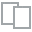
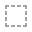
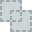
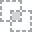
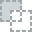
...
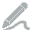
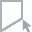
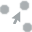
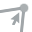
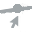

In [ ]:
plot(data_engineered[continuous])

## Creating bins for:
- MARKDOWN
- RESPONSERATE

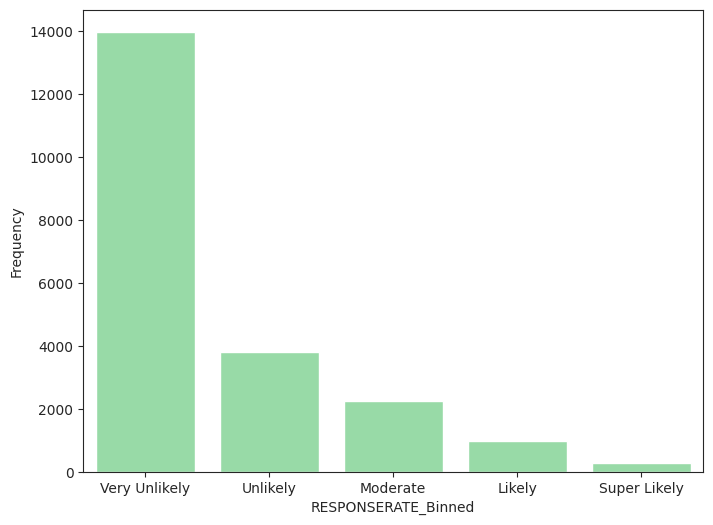

,RESPONSERATE_Binned
0,Very Unlikely
1,Moderate
2,Very Unlikely
3,Likely
4,Very Unlikely
...,...
21735,Very Unlikely
21736,Moderate
21737,Unlikely
21738,Very Unlikely


In [ ]:
# Define bins
bins = [0, 20, 40, 60, 80, 100]  # Adjust the bin edges as needed
labels = ['Very Unlikely', 'Unlikely','Moderate', 'Likely', 'Super Likely']  # Labels for the bins

# Create a new binned column
data_engineered['RESPONSERATE_Binned'] = pd.cut(data['RESPONSERATE'], bins=bins, labels=labels, right=False)

# Visualize the distribution of MARKDOWN_Binned
plt.figure(figsize=(8, 6))
sns.countplot(x='RESPONSERATE_Binned', data=data_engineered, color='#8de5a1')
# plt.title('Distribution of RESPONSERATE_Binned')
plt.xlabel('RESPONSERATE_Binned')
plt.ylabel('Frequency')
plt.show()
data_engineered['RESPONSERATE_Binned']

In [ ]:
data['MARKDOWN'].describe()

,MARKDOWN
count,21740.000000
mean,0.187325
std,0.129171
min,0.000000
25%,0.090000
50%,0.180000
75%,0.280000
max,0.950000


In [ ]:
print(data['MARKDOWN'].isnull().sum())  # Count NaN values
print(data['MARKDOWN'].eq('').sum())     # Count empty strings

0
0


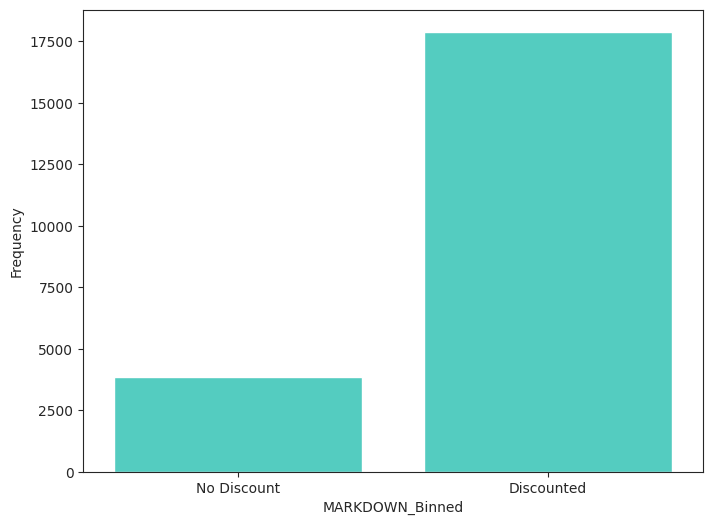

,MARKDOWN_Binned
0,Discounted
1,Discounted
2,Discounted
3,Discounted
4,Discounted
...,...
21735,No Discount
21736,Discounted
21737,Discounted
21738,Discounted


In [ ]:
# Define bins
bins = [0, 0.05, 1]  # Adjust the bin edges as needed
labels = ['No Discount', 'Discounted']  # Labels for the bins



# Create a new binned column
data_engineered['MARKDOWN_Binned'] = pd.cut(data['MARKDOWN'], bins=bins, labels=labels, right=False)

# Visualize the distribution of MARKDOWN_Binned
plt.figure(figsize=(8, 6))
sns.countplot(x='MARKDOWN_Binned', data=data_engineered, color='turquoise')
# plt.title('Distribution of MARKDOWN_Binned')
plt.xlabel('MARKDOWN_Binned')
plt.ylabel('Frequency')
plt.show()

data_engineered['MARKDOWN_Binned']


In [ ]:
data_engineered

,ZIP_CODE,FRE,MON,CC_CARD,AVRG,PC_CALC20,PSWEATERS,PKNIT_TOPS,PKNIT_DRES,PBLOUSES,PJACKETS,PCAR_PNTS,PCAS_PNTS,PSHIRTS,PDRESSES,PSUITS,POUTERWEAR,PJEWELRY,PFASHION,PLEGWEAR,PCOLLSPND,AMSPEND,PSSPEND,CCSPEND,AXSPEND,TMONSPEND,OMONSPEND,SMONSPEND,PREVPD,GMP,PROMOS,DAYS,FREDAYS,MARKDOWN,CLASSES,COUPONS,STYLES,STORES,VALPHON,WEB,MAILED,RESPONDED,RESPONSERATE,HI,LTFREDAY,CLUSTYPE,PERCRET,RESP,PROMOS_1,PROMOS_2,PROMOS_3,PROMOS_4,PROMOS_5,PROMOS_6,PROMOS_7,PROMOS_8,PROMOS_9,PROMOS_10,PROMOS_11,PROMOS_12,PROMOS_13,PROMOS_14,PROMOS_15,PROMOS_16,PROMOS_17,PROMOS_18,PROMOS_19,PROMOS_20,PROMOS_21,PROMOS_22,PROMOS_23,PROMOS_24,PROMOS_25,PROMOS_26,PROMOS_27,PROMOS_28,PROMOS_29,PROMOS_30,PROMOS_31,PROMOS_32,PROMOS_33,PROMOS_34,PROMOS_35,PROMOS_36,PROMOS_38,CLASSES_2,CLASSES_3,CLASSES_4,CLASSES_5,CLASSES_6,CLASSES_7,CLASSES_8,CLASSES_9,CLASSES_10,CLASSES_11,CLASSES_12,CLASSES_13,CLASSES_14,CLASSES_15,CLASSES_16,CLASSES_17,CLASSES_18,CLASSES_19,CLASSES_20,CLASSES_21,CLASSES_22,CLASSES_23,CLASSES_24,CLASSES_25,CLASSES_26,CLASSES_27,CLASSES_28,CLASSES_29,CLASSES_30,CLASSES_31,CLASSES_32,CLASSES_33,CLASSES_34,CLASSES_35,CLASSES_37,COUPONS_1,COUPONS_2,COUPONS_3,COUPONS_4,COUPONS_5,COUPONS_6,COUPONS_7,COUPONS_8,COUPONS_9,COUPONS_10,COUPONS_11,COUPONS_12,COUPONS_13,COUPONS_14,COUPONS_15,COUPONS_16,COUPONS_17,COUPONS_18,COUPONS_19,COUPONS_20,COUPONS_21,COUPONS_23,COUPONS_27,COUPONS_32,STORES_2,STORES_3,STORES_4,STORES_5,STORES_6,STORES_7,STORES_8,STORES_9,STORES_10,STORES_11,STORES_12,STORES_13,STORES_14,STORES_15,STORES_16,STORES_17,STORES_19,MAILED_1,MAILED_2,MAILED_3,MAILED_4,MAILED_5,MAILED_6,MAILED_7,MAILED_8,MAILED_9,MAILED_10,MAILED_11,RESPONDED_1,RESPONDED_2,RESPONDED_3,RESPONDED_4,RESPONDED_5,RESPONDED_6,RESPONDED_7,RESPONDED_8,RESPONDED_9,RESPONDED_10,RESPONDED_11,CLUSTYPE_1,CLUSTYPE_2,CLUSTYPE_3,CLUSTYPE_4,CLUSTYPE_5,CLUSTYPE_6,CLUSTYPE_7,CLUSTYPE_8,CLUSTYPE_9,CLUSTYPE_10,CLUSTYPE_11,CLUSTYPE_12,CLUSTYPE_13,CLUSTYPE_14,CLUSTYPE_15,CLUSTYPE_16,CLUSTYPE_17,CLUSTYPE_18,CLUSTYPE_19,CLUSTYPE_20,CLUSTYPE_21,CLUSTYPE_22,CLUSTYPE_23,CLUSTYPE_24,CLUSTYPE_25,CLUSTYPE_26,CLUSTYPE_27,CLUSTYPE_28,CLUSTYPE_29,CLUSTYPE_30,CLUSTYPE_31,CLUSTYPE_32,CLUSTYPE_33,CLUSTYPE_34,CLUSTYPE_35,CLUSTYPE_36,CLUSTYPE_37,CLUSTYPE_38,CLUSTYPE_39,CLUSTYPE_40,CLUSTYPE_41,CLUSTYPE_42,CLUSTYPE_43,CLUSTYPE_44,CLUSTYPE_45,CLUSTYPE_46,CLUSTYPE_47,CLUSTYPE_48,CLUSTYPE_49,CLUSTYPE_50,PC_CALC20_15,PC_CALC20_16,PC_CALC20_17,PC_CALC20_18,PC_CALC20_19,RESPONSERATE_Binned,MARKDOWN_Binned
0,1001,-0.465227,0.295994,0,1.057269,11,0.160985,-0.687295,-0.607256,1.622946,-0.927346,1.523500,-0.768630,1.558583,-0.652232,-0.359674,-0.280438,-0.496954,0.509927,1.994760,2.004622,-0.229122,-0.873292,0.752060,-0.389440,-0.902903,-0.520193,-1.362170,-0.565373,0.546710,17,1.183990,1.197605,-0.828612,9,1,0.160859,1,0,0,5,0,-0.705432,0.070255,0.765319,10,-0.645606,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Very Unlikely,Discounted
1,1028,0.358293,-0.070695,1,-0.543337,11,0.563356,2.041844,-0.607256,-0.990103,-0.927346,1.268495,1.360590,-0.796658,1.737329,-0.359674,-0.280438,-0.496954,-0.656142,1.622956,2.049242,-0.229122,-0.873292,0.434640,-0.389440,1.126482,1.921772,0.684971,-0.565373,0.125837,14,1.339399,0.393150,1.108775,6,0,0.396629,1,1,0,4,2,1.329214,0.110110,-0.194651,10,0.138562,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Moderate,D

In [ ]:

data_engineered = pd.get_dummies(data_engineered, columns=['MARKDOWN_Binned','RESPONSERATE_Binned'],drop_first=True).astype(int)

In [ ]:

data_engineered

,ZIP_CODE,FRE,MON,CC_CARD,AVRG,PC_CALC20,PSWEATERS,PKNIT_TOPS,PKNIT_DRES,PBLOUSES,PJACKETS,PCAR_PNTS,PCAS_PNTS,PSHIRTS,PDRESSES,PSUITS,POUTERWEAR,PJEWELRY,PFASHION,PLEGWEAR,PCOLLSPND,AMSPEND,PSSPEND,CCSPEND,AXSPEND,TMONSPEND,OMONSPEND,SMONSPEND,PREVPD,GMP,PROMOS,DAYS,FREDAYS,MARKDOWN,CLASSES,COUPONS,STYLES,STORES,VALPHON,WEB,MAILED,RESPONDED,RESPONSERATE,HI,LTFREDAY,CLUSTYPE,PERCRET,RESP,PROMOS_1,PROMOS_2,PROMOS_3,PROMOS_4,PROMOS_5,PROMOS_6,PROMOS_7,PROMOS_8,PROMOS_9,PROMOS_10,PROMOS_11,PROMOS_12,PROMOS_13,PROMOS_14,PROMOS_15,PROMOS_16,PROMOS_17,PROMOS_18,PROMOS_19,PROMOS_20,PROMOS_21,PROMOS_22,PROMOS_23,PROMOS_24,PROMOS_25,PROMOS_26,PROMOS_27,PROMOS_28,PROMOS_29,PROMOS_30,PROMOS_31,PROMOS_32,PROMOS_33,PROMOS_34,PROMOS_35,PROMOS_36,PROMOS_38,CLASSES_2,CLASSES_3,CLASSES_4,CLASSES_5,CLASSES_6,CLASSES_7,CLASSES_8,CLASSES_9,CLASSES_10,CLASSES_11,CLASSES_12,CLASSES_13,CLASSES_14,CLASSES_15,CLASSES_16,CLASSES_17,CLASSES_18,CLASSES_19,CLASSES_20,CLASSES_21,CLASSES_22,CLASSES_23,CLASSES_24,CLASSES_25,CLASSES_26,CLASSES_27,CLASSES_28,CLASSES_29,CLASSES_30,CLASSES_31,CLASSES_32,CLASSES_33,CLASSES_34,CLASSES_35,CLASSES_37,COUPONS_1,COUPONS_2,COUPONS_3,COUPONS_4,COUPONS_5,COUPONS_6,COUPONS_7,COUPONS_8,COUPONS_9,COUPONS_10,COUPONS_11,COUPONS_12,COUPONS_13,COUPONS_14,COUPONS_15,COUPONS_16,COUPONS_17,COUPONS_18,COUPONS_19,COUPONS_20,COUPONS_21,COUPONS_23,COUPONS_27,COUPONS_32,STORES_2,STORES_3,STORES_4,STORES_5,STORES_6,STORES_7,STORES_8,STORES_9,STORES_10,STORES_11,STORES_12,STORES_13,STORES_14,STORES_15,STORES_16,STORES_17,STORES_19,MAILED_1,MAILED_2,MAILED_3,MAILED_4,MAILED_5,MAILED_6,MAILED_7,MAILED_8,MAILED_9,MAILED_10,MAILED_11,RESPONDED_1,RESPONDED_2,RESPONDED_3,RESPONDED_4,RESPONDED_5,RESPONDED_6,RESPONDED_7,RESPONDED_8,RESPONDED_9,RESPONDED_10,RESPONDED_11,CLUSTYPE_1,CLUSTYPE_2,CLUSTYPE_3,CLUSTYPE_4,CLUSTYPE_5,CLUSTYPE_6,CLUSTYPE_7,CLUSTYPE_8,CLUSTYPE_9,CLUSTYPE_10,CLUSTYPE_11,CLUSTYPE_12,CLUSTYPE_13,CLUSTYPE_14,CLUSTYPE_15,CLUSTYPE_16,CLUSTYPE_17,CLUSTYPE_18,CLUSTYPE_19,CLUSTYPE_20,CLUSTYPE_21,CLUSTYPE_22,CLUSTYPE_23,CLUSTYPE_24,CLUSTYPE_25,CLUSTYPE_26,CLUSTYPE_27,CLUSTYPE_28,CLUSTYPE_29,CLUSTYPE_30,CLUSTYPE_31,CLUSTYPE_32,CLUSTYPE_33,CLUSTYPE_34,CLUSTYPE_35,CLUSTYPE_36,CLUSTYPE_37,CLUSTYPE_38,CLUSTYPE_39,CLUSTYPE_40,CLUSTYPE_41,CLUSTYPE_42,CLUSTYPE_43,CLUSTYPE_44,CLUSTYPE_45,CLUSTYPE_46,CLUSTYPE_47,CLUSTYPE_48,CLUSTYPE_49,CLUSTYPE_50,PC_CALC20_15,PC_CALC20_16,PC_CALC20_17,PC_CALC20_18,PC_CALC20_19,MARKDOWN_Binned_Discounted,RESPONSERATE_Binned_Unlikely,RESPONSERATE_Binned_Moderate,RESPONSERATE_Binned_Likely,RESPONSERATE_Binned_Super Likely
0,1001,0,0,0,1,11,0,0,0,1,0,1,0,1,0,0,0,0,0,1,2,0,0,0,0,0,0,-1,0,0,17,1,1,0,9,1,0,1,0,0,5,0,0,0,0,10,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
1,1028,0,0,1,0,11,0,2,0,0,0,1,1,0,1,0,0,0,0,1,2,0,0,0,0,1,1,0,0,0,14,1,0,1,6,0,0,1,1,0,4,2,1,0,0,10,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0
2,1056,0,-1,0,-1,11,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,-1,1,0,10,0,0,0,1,0,-1,1,0,0,4,0,0,1,0,16,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0

In [ ]:

# Merge response_rate_binned and markdown_binned with data
data = pd.merge(data, data_engineered[['MARKDOWN_Binned_Discounted','RESPONSERATE_Binned_Unlikely','RESPONSERATE_Binned_Moderate','RESPONSERATE_Binned_Likely','RESPONSERATE_Binned_Super Likely']], left_index=True, right_index=True, how='left')
data

,ZIP_CODE,FRE,MON,CC_CARD,AVRG,PC_CALC20,PSWEATERS,PKNIT_TOPS,PKNIT_DRES,PBLOUSES,PJACKETS,PCAR_PNTS,PCAS_PNTS,PSHIRTS,PDRESSES,PSUITS,POUTERWEAR,PJEWELRY,PFASHION,PLEGWEAR,PCOLLSPND,AMSPEND,PSSPEND,CCSPEND,AXSPEND,TMONSPEND,OMONSPEND,SMONSPEND,PREVPD,GMP,PROMOS,DAYS,FREDAYS,MARKDOWN,CLASSES,COUPONS,STYLES,STORES,VALPHON,WEB,MAILED,RESPONDED,RESPONSERATE,HI,LTFREDAY,CLUSTYPE,PERCRET,RESP,MARKDOWN_Binned_Discounted,RESPONSERATE_Binned_Unlikely,RESPONSERATE_Binned_Moderate,RESPONSERATE_Binned_Likely,RESPONSERATE_Binned_Super Likely
0,1001,2,368.46,0,184.23,11,0.18,0.00,0.00,0.30,0.00,0.25,0.00,0.19,0.00,0.0,0.0,0.000000,0.02,0.03,0.29,0.0,0.00,368.46,0.00,0.00,0.00,0.00,0.00,0.60,17,666,333.00,0.08,9,1,11,1,0,0,5,0,0.00,31.81,111.00,10,0.0000,0,1,0,0,0,0
1,1028,4,258.00,1,64.50,11,0.26,0.16,0.00,0.00,0.00,0.18,0.14,0.00,0.18,0.0,0.0,0.000000,0.00,0.02,0.37,0.0,0.00,258.00,0.00,138.00,55.99,258.00,0.00,0.54,14,696,174.00,0.33,6,0,14,1,1,0,4,2,50.00,32.72,43.50,10,0.0300,1,1,0,1,0,0
2,1056,2,77.00,0,38.50,11,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.000000,0.00,0.00,0.00,0.0,0.00,77.00,0.00,0.00,0.00,0.00,39.00,0.62,10,343,171.50,0.11,1,0,2,1,0,0,4,0,0.00,100.00,68.60,16,0.0000,0,1,0,0,0,0
3,1118,8,846.06,1,105.75,11,0.38,0.00,0.05,0.06,0.20,0.17,0.00,0.05,0.00,0.0,0.0,0.005307,0.03,0.01,0.00,0.0,0.00,846.06,0.00,104.94,0.00,373.87,166.25,0.43,24,701,87.62,0.29,15,3,35,1,1,0,9,6,66.67,23.27,26.96,10,0.0000,0,1,0,0,1,0
4,1107,1,87.44,0,87.44,11,0.20,0.20,0.00,0.00,0.00,0.00,0.41,0.00,0.00,0.0,0.0,0.170000,0.00,0.00,0.00,0.0,0.00,87.44,0.00,87.44,0.00,87.44,0.00,0.22,0,49,49.00,0.42,4,0,8,1,1,0,0,0,0.00,28.52,24.50,20,0.0000,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21735,63105,2,39.00,0,19.50,11,0.00,0.00,0.39,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.000000,0.00,0.00,0.00,0.0,0.00,39.00,0.00,0.00,0.00,0.00,39.00,0.67,7,323,161.50,0.00,2,0,3,2,1,0,1,0,0.00,15.83,107.66,1,0.0151,0,0,0,0,0,0
21736,72207,6,280.59,0,46.76,11,0.02,0.00,0.00,0.06,0.22,0.03,0.00,0.10,0.00,0.0,0.0,0.000000,0.13,0.00,0.00,0.0,0.00,213.22,67.37,131.36,0.00,280.59,0.00,0.58,12,203,33.83,0.13,7,0,12,3,0,0,5,2,40.00,8.67,18.45,12,0.6900,0,1,0,1,0,0
21737,77084,9,1274.96,0,141.66,16,0.29,0.04,0.01,0.14,0.23,0.12,0.00,0.00,0.00,0.0,0.0,0.000000,0.04,0.02,0.11,0.0,785.31,489.65,0.00,356.00,356.00,567.99,0.00,0.61,17,341,37.88,0.14,13,1,46,4,0,0,7,2,28.57,19.71,12.62,15,0.0800,1,1,1,0,0,0
21738,78640,3,265.94,0,88.64,11,0.18,0.00,0.03,0.11,0.00,0.00,0.09,0.16,0.00,0.0,0.0,0.000000,0.00,0.07,0.16,0.0,13.99,251.95,0.00,0.00,0.00,0.00,0.00,0.56,12,257,85.66,0.12,9,0,15,2,1,0,7,0,0.00,11.63,32.12,38,0.3700,0,1,0,0,0,0


In [ ]:
data

,ZIP_CODE,FRE,MON,CC_CARD,AVRG,PC_CALC20,PSWEATERS,PKNIT_TOPS,PKNIT_DRES,PBLOUSES,PJACKETS,PCAR_PNTS,PCAS_PNTS,PSHIRTS,PDRESSES,PSUITS,POUTERWEAR,PJEWELRY,PFASHION,PLEGWEAR,PCOLLSPND,AMSPEND,PSSPEND,CCSPEND,AXSPEND,TMONSPEND,OMONSPEND,SMONSPEND,PREVPD,GMP,PROMOS,DAYS,FREDAYS,MARKDOWN,CLASSES,COUPONS,STYLES,STORES,VALPHON,WEB,MAILED,RESPONDED,RESPONSERATE,HI,LTFREDAY,CLUSTYPE,PERCRET,RESP,MARKDOWN_Binned_Discounted,RESPONSERATE_Binned_Unlikely,RESPONSERATE_Binned_Moderate,RESPONSERATE_Binned_Likely,RESPONSERATE_Binned_Super Likely
0,1001,2,368.46,0,184.23,11,0.18,0.00,0.00,0.30,0.00,0.25,0.00,0.19,0.00,0.0,0.0,0.000000,0.02,0.03,0.29,0.0,0.00,368.46,0.00,0.00,0.00,0.00,0.00,0.60,17,666,333.00,0.08,9,1,11,1,0,0,5,0,0.00,31.81,111.00,10,0.0000,0,1,0,0,0,0
1,1028,4,258.00,1,64.50,11,0.26,0.16,0.00,0.00,0.00,0.18,0.14,0.00,0.18,0.0,0.0,0.000000,0.00,0.02,0.37,0.0,0.00,258.00,0.00,138.00,55.99,258.00,0.00,0.54,14,696,174.00,0.33,6,0,14,1,1,0,4,2,50.00,32.72,43.50,10,0.0300,1,1,0,1,0,0
2,1056,2,77.00,0,38.50,11,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.000000,0.00,0.00,0.00,0.0,0.00,77.00,0.00,0.00,0.00,0.00,39.00,0.62,10,343,171.50,0.11,1,0,2,1,0,0,4,0,0.00,100.00,68.60,16,0.0000,0,1,0,0,0,0
3,1118,8,846.06,1,105.75,11,0.38,0.00,0.05,0.06,0.20,0.17,0.00,0.05,0.00,0.0,0.0,0.005307,0.03,0.01,0.00,0.0,0.00,846.06,0.00,104.94,0.00,373.87,166.25,0.43,24,701,87.62,0.29,15,3,35,1,1,0,9,6,66.67,23.27,26.96,10,0.0000,0,1,0,0,1,0
4,1107,1,87.44,0,87.44,11,0.20,0.20,0.00,0.00,0.00,0.00,0.41,0.00,0.00,0.0,0.0,0.170000,0.00,0.00,0.00,0.0,0.00,87.44,0.00,87.44,0.00,87.44,0.00,0.22,0,49,49.00,0.42,4,0,8,1,1,0,0,0,0.00,28.52,24.50,20,0.0000,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21735,63105,2,39.00,0,19.50,11,0.00,0.00,0.39,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.000000,0.00,0.00,0.00,0.0,0.00,39.00,0.00,0.00,0.00,0.00,39.00,0.67,7,323,161.50,0.00,2,0,3,2,1,0,1,0,0.00,15.83,107.66,1,0.0151,0,0,0,0,0,0
21736,72207,6,280.59,0,46.76,11,0.02,0.00,0.00,0.06,0.22,0.03,0.00,0.10,0.00,0.0,0.0,0.000000,0.13,0.00,0.00,0.0,0.00,213.22,67.37,131.36,0.00,280.59,0.00,0.58,12,203,33.83,0.13,7,0,12,3,0,0,5,2,40.00,8.67,18.45,12,0.6900,0,1,0,1,0,0
21737,77084,9,1274.96,0,141.66,16,0.29,0.04,0.01,0.14,0.23,0.12,0.00,0.00,0.00,0.0,0.0,0.000000,0.04,0.02,0.11,0.0,785.31,489.65,0.00,356.00,356.00,567.99,0.00,0.61,17,341,37.88,0.14,13,1,46,4,0,0,7,2,28.57,19.71,12.62,15,0.0800,1,1,1,0,0,0
21738,78640,3,265.94,0,88.64,11,0.18,0.00,0.03,0.11,0.00,0.00,0.09,0.16,0.00,0.0,0.0,0.000000,0.00,0.07,0.16,0.0,13.99,251.95,0.00,0.00,0.00,0.00,0.00,0.56,12,257,85.66,0.12,9,0,15,2,1,0,7,0,0.00,11.63,32.12,38,0.3700,0,1,0,0,0,0


### Redefine features

In [ ]:
continuous = [
    'AVRG', 'MON', 'PSWEATERS', 'PKNIT_TOPS', 'PKNIT_DRES', 'PBLOUSES',
    'PJACKETS', 'PCAR_PNTS', 'PCAS_PNTS', 'PSHIRTS', 'PDRESSES', 'PSUITS',
    'POUTERWEAR', 'PJEWELRY', 'PFASHION', 'PLEGWEAR', 'PCOLLSPND',
    'AMSPEND', 'PSSPEND', 'CCSPEND', 'AXSPEND', 'TMONSPEND', 'OMONSPEND',
    'SMONSPEND', 'PREVPD', 'GMP', 'FREDAYS', 'MARKDOWN',
    'HI', 'LTFREDAY', 'PERCRET','DAYS','STYLES','FRE','RESPONSERATE',
]

discrete = [
    'PROMOS','CLASSES','COUPONS',
    'STORES','MAILED','RESPONDED','CLUSTYPE','PC_CALC20'
]

categorical = ['MARKDOWN_Binned_Discounted',	'RESPONSERATE_Binned_Unlikely', 'RESPONSERATE_Binned_Moderate',	'RESPONSERATE_Binned_Likely', 'RESPONSERATE_Binned_Super Likely']



binary = ['VALPHON','WEB','CC_CARD']
response = ['RESP']

In [ ]:
data

,ZIP_CODE,FRE,MON,CC_CARD,AVRG,PC_CALC20,PSWEATERS,PKNIT_TOPS,PKNIT_DRES,PBLOUSES,PJACKETS,PCAR_PNTS,PCAS_PNTS,PSHIRTS,PDRESSES,PSUITS,POUTERWEAR,PJEWELRY,PFASHION,PLEGWEAR,PCOLLSPND,AMSPEND,PSSPEND,CCSPEND,AXSPEND,TMONSPEND,OMONSPEND,SMONSPEND,PREVPD,GMP,PROMOS,DAYS,FREDAYS,MARKDOWN,CLASSES,COUPONS,STYLES,STORES,VALPHON,WEB,MAILED,RESPONDED,RESPONSERATE,HI,LTFREDAY,CLUSTYPE,PERCRET,RESP,MARKDOWN_Binned_Discounted,RESPONSERATE_Binned_Unlikely,RESPONSERATE_Binned_Moderate,RESPONSERATE_Binned_Likely,RESPONSERATE_Binned_Super Likely
0,1001,2,368.46,0,184.23,11,0.18,0.00,0.00,0.30,0.00,0.25,0.00,0.19,0.00,0.0,0.0,0.000000,0.02,0.03,0.29,0.0,0.00,368.46,0.00,0.00,0.00,0.00,0.00,0.60,17,666,333.00,0.08,9,1,11,1,0,0,5,0,0.00,31.81,111.00,10,0.0000,0,1,0,0,0,0
1,1028,4,258.00,1,64.50,11,0.26,0.16,0.00,0.00,0.00,0.18,0.14,0.00,0.18,0.0,0.0,0.000000,0.00,0.02,0.37,0.0,0.00,258.00,0.00,138.00,55.99,258.00,0.00,0.54,14,696,174.00,0.33,6,0,14,1,1,0,4,2,50.00,32.72,43.50,10,0.0300,1,1,0,1,0,0
2,1056,2,77.00,0,38.50,11,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.000000,0.00,0.00,0.00,0.0,0.00,77.00,0.00,0.00,0.00,0.00,39.00,0.62,10,343,171.50,0.11,1,0,2,1,0,0,4,0,0.00,100.00,68.60,16,0.0000,0,1,0,0,0,0
3,1118,8,846.06,1,105.75,11,0.38,0.00,0.05,0.06,0.20,0.17,0.00,0.05,0.00,0.0,0.0,0.005307,0.03,0.01,0.00,0.0,0.00,846.06,0.00,104.94,0.00,373.87,166.25,0.43,24,701,87.62,0.29,15,3,35,1,1,0,9,6,66.67,23.27,26.96,10,0.0000,0,1,0,0,1,0
4,1107,1,87.44,0,87.44,11,0.20,0.20,0.00,0.00,0.00,0.00,0.41,0.00,0.00,0.0,0.0,0.170000,0.00,0.00,0.00,0.0,0.00,87.44,0.00,87.44,0.00,87.44,0.00,0.22,0,49,49.00,0.42,4,0,8,1,1,0,0,0,0.00,28.52,24.50,20,0.0000,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21735,63105,2,39.00,0,19.50,11,0.00,0.00,0.39,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.000000,0.00,0.00,0.00,0.0,0.00,39.00,0.00,0.00,0.00,0.00,39.00,0.67,7,323,161.50,0.00,2,0,3,2,1,0,1,0,0.00,15.83,107.66,1,0.0151,0,0,0,0,0,0
21736,72207,6,280.59,0,46.76,11,0.02,0.00,0.00,0.06,0.22,0.03,0.00,0.10,0.00,0.0,0.0,0.000000,0.13,0.00,0.00,0.0,0.00,213.22,67.37,131.36,0.00,280.59,0.00,0.58,12,203,33.83,0.13,7,0,12,3,0,0,5,2,40.00,8.67,18.45,12,0.6900,0,1,0,1,0,0
21737,77084,9,1274.96,0,141.66,16,0.29,0.04,0.01,0.14,0.23,0.12,0.00,0.00,0.00,0.0,0.0,0.000000,0.04,0.02,0.11,0.0,785.31,489.65,0.00,356.00,356.00,567.99,0.00,0.61,17,341,37.88,0.14,13,1,46,4,0,0,7,2,28.57,19.71,12.62,15,0.0800,1,1,1,0,0,0
21738,78640,3,265.94,0,88.64,11,0.18,0.00,0.03,0.11,0.00,0.00,0.09,0.16,0.00,0.0,0.0,0.000000,0.00,0.07,0.16,0.0,13.99,251.95,0.00,0.00,0.00,0.00,0.00,0.56,12,257,85.66,0.12,9,0,15,2,1,0,7,0,0.00,11.63,32.12,38,0.3700,0,1,0,0,0,0


In [ ]:
data_engineered

,ZIP_CODE,FRE,MON,CC_CARD,AVRG,PC_CALC20,PSWEATERS,PKNIT_TOPS,PKNIT_DRES,PBLOUSES,PJACKETS,PCAR_PNTS,PCAS_PNTS,PSHIRTS,PDRESSES,PSUITS,POUTERWEAR,PJEWELRY,PFASHION,PLEGWEAR,PCOLLSPND,AMSPEND,PSSPEND,CCSPEND,AXSPEND,TMONSPEND,OMONSPEND,SMONSPEND,PREVPD,GMP,PROMOS,DAYS,FREDAYS,MARKDOWN,CLASSES,COUPONS,STYLES,STORES,VALPHON,WEB,MAILED,RESPONDED,RESPONSERATE,HI,LTFREDAY,CLUSTYPE,PERCRET,RESP,PROMOS_1,PROMOS_2,PROMOS_3,PROMOS_4,PROMOS_5,PROMOS_6,PROMOS_7,PROMOS_8,PROMOS_9,PROMOS_10,PROMOS_11,PROMOS_12,PROMOS_13,PROMOS_14,PROMOS_15,PROMOS_16,PROMOS_17,PROMOS_18,PROMOS_19,PROMOS_20,PROMOS_21,PROMOS_22,PROMOS_23,PROMOS_24,PROMOS_25,PROMOS_26,PROMOS_27,PROMOS_28,PROMOS_29,PROMOS_30,PROMOS_31,PROMOS_32,PROMOS_33,PROMOS_34,PROMOS_35,PROMOS_36,PROMOS_38,CLASSES_2,CLASSES_3,CLASSES_4,CLASSES_5,CLASSES_6,CLASSES_7,CLASSES_8,CLASSES_9,CLASSES_10,CLASSES_11,CLASSES_12,CLASSES_13,CLASSES_14,CLASSES_15,CLASSES_16,CLASSES_17,CLASSES_18,CLASSES_19,CLASSES_20,CLASSES_21,CLASSES_22,CLASSES_23,CLASSES_24,CLASSES_25,CLASSES_26,CLASSES_27,CLASSES_28,CLASSES_29,CLASSES_30,CLASSES_31,CLASSES_32,CLASSES_33,CLASSES_34,CLASSES_35,CLASSES_37,COUPONS_1,COUPONS_2,COUPONS_3,COUPONS_4,COUPONS_5,COUPONS_6,COUPONS_7,COUPONS_8,COUPONS_9,COUPONS_10,COUPONS_11,COUPONS_12,COUPONS_13,COUPONS_14,COUPONS_15,COUPONS_16,COUPONS_17,COUPONS_18,COUPONS_19,COUPONS_20,COUPONS_21,COUPONS_23,COUPONS_27,COUPONS_32,STORES_2,STORES_3,STORES_4,STORES_5,STORES_6,STORES_7,STORES_8,STORES_9,STORES_10,STORES_11,STORES_12,STORES_13,STORES_14,STORES_15,STORES_16,STORES_17,STORES_19,MAILED_1,MAILED_2,MAILED_3,MAILED_4,MAILED_5,MAILED_6,MAILED_7,MAILED_8,MAILED_9,MAILED_10,MAILED_11,RESPONDED_1,RESPONDED_2,RESPONDED_3,RESPONDED_4,RESPONDED_5,RESPONDED_6,RESPONDED_7,RESPONDED_8,RESPONDED_9,RESPONDED_10,RESPONDED_11,CLUSTYPE_1,CLUSTYPE_2,CLUSTYPE_3,CLUSTYPE_4,CLUSTYPE_5,CLUSTYPE_6,CLUSTYPE_7,CLUSTYPE_8,CLUSTYPE_9,CLUSTYPE_10,CLUSTYPE_11,CLUSTYPE_12,CLUSTYPE_13,CLUSTYPE_14,CLUSTYPE_15,CLUSTYPE_16,CLUSTYPE_17,CLUSTYPE_18,CLUSTYPE_19,CLUSTYPE_20,CLUSTYPE_21,CLUSTYPE_22,CLUSTYPE_23,CLUSTYPE_24,CLUSTYPE_25,CLUSTYPE_26,CLUSTYPE_27,CLUSTYPE_28,CLUSTYPE_29,CLUSTYPE_30,CLUSTYPE_31,CLUSTYPE_32,CLUSTYPE_33,CLUSTYPE_34,CLUSTYPE_35,CLUSTYPE_36,CLUSTYPE_37,CLUSTYPE_38,CLUSTYPE_39,CLUSTYPE_40,CLUSTYPE_41,CLUSTYPE_42,CLUSTYPE_43,CLUSTYPE_44,CLUSTYPE_45,CLUSTYPE_46,CLUSTYPE_47,CLUSTYPE_48,CLUSTYPE_49,CLUSTYPE_50,PC_CALC20_15,PC_CALC20_16,PC_CALC20_17,PC_CALC20_18,PC_CALC20_19,MARKDOWN_Binned_Discounted,RESPONSERATE_Binned_Unlikely,RESPONSERATE_Binned_Moderate,RESPONSERATE_Binned_Likely,RESPONSERATE_Binned_Super Likely
0,1001,0,0,0,1,11,0,0,0,1,0,1,0,1,0,0,0,0,0,1,2,0,0,0,0,0,0,-1,0,0,17,1,1,0,9,1,0,1,0,0,5,0,0,0,0,10,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
1,1028,0,0,1,0,11,0,2,0,0,0,1,1,0,1,0,0,0,0,1,2,0,0,0,0,1,1,0,0,0,14,1,0,1,6,0,0,1,1,0,4,2,1,0,0,10,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0
2,1056,0,-1,0,-1,11,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,-1,1,0,10,0,0,0,1,0,-1,1,0,0,4,0,0,1,0,16,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0

# Try creating important interaction terms and include in model

In [ ]:
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import ElasticNetCV
import pandas as pd

# Use only the training data for both features and target
Use = data.loc[index_train].drop(columns=['RESP','ZIP_CODE','MARKDOWN_Binned_Discounted',
                                          'RESPONSERATE_Binned_Unlikely',	'RESPONSERATE_Binned_Moderate',
                                          'RESPONSERATE_Binned_Likely', 'RESPONSERATE_Binned_Super Likely'])  # Drop target variable to create interactions
Response = data.loc[index_train, 'RESP']  # Target variable - Use training data here

# Step 1: Generate interaction terms (pairwise interactions)
poly = PolynomialFeatures(degree=2, interaction_only=True, include_bias=False)
X_interactions = poly.fit_transform(Use)

# Step 2: Fit ElasticNet model for feature selection
enet = ElasticNetCV(cv=5)
enet.fit(X_interactions, Response)

# Step 3: Get coefficients and find important interactions (non-zero coefficients)
important_indices = enet.coef_ != 0  # Boolean array of important features

# Step 4: Get the names of the important interaction terms
important_interactions = poly.get_feature_names_out(Use.columns)[important_indices] # Use Use.columns
important_coefficients = enet.coef_[important_indices]  # Get the non-zero coefficients

# Step 5: Create DataFrame for easier understanding
important_interactions_df = pd.DataFrame({
    'Interaction': important_interactions,
    'Coefficient': important_coefficients
})

# Step 6: Sort by absolute value of coefficients and select the top 3 most important interactions
top_3_interactions_df = important_interactions_df.reindex(
    important_interactions_df['Coefficient'].abs().sort_values(ascending=False).index
).head(3)

# Display the top 3 important interactions with their coefficients
print(top_3_interactions_df)


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:683: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2.0554193466648485, tolerance: 0.1675429392918754
  model = cd_fast.enet_coordinate_descent_gram(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:683: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6.572562986480989, tolerance: 0.1675429392918754
  model = cd_fast.enet_coordinate_descent_gram(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:683: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.7501905985538997, tolerance: 0.1675429392918754
  model = cd_fast.enet_coordinate_descent_gram(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:683: Convergen

          Interaction  Coefficient
11       MON LTFREDAY    -0.000003
35  DAYS RESPONSERATE     0.000002
36      DAYS LTFREDAY    -0.000002


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.539e+01, tolerance: 2.108e-01
  model = cd_fast.enet_coordinate_descent(


Interesting
predictors = ['PROMOS','RESPONDED','FREDAYS', 'FRE' , 'LTFREDAY',
              'VALPHON', 'GMP','CC_CARD','PERCRET','PSSPEND','AVRG', 'AMSPEND', 'CCSPEND', 'AXSPEND', 'TMONSPEND', 'PREVPD', 'HI'] >>> for RESPONSERATE and MARKDOWN we will use binning




Feature selection based on association with response variable and multicollinearity avoidance

1. features with positive or negative associations with RESP based on regplots.
2. features with relationships with RESP based on crosstabplots.
3. features with the top 3 highest mutual information (MI) scores, which indicate the high strength of association between the predictor and the response.
4. Remove highly correlated pairs (above or below threshold of 0.7 and -0.7) of features to avoid multicollinearity issues.

  

In [ ]:
predictors_for_analyse_interaction = continuous + discrete + categorical + binary

In [ ]:
predictors_for_analyse_interaction

['AVRG',
 'MON',
 'PSWEATERS',
 'PKNIT_TOPS',
 'PKNIT_DRES',
 'PBLOUSES',
 'PJACKETS',
 'PCAR_PNTS',
 'PCAS_PNTS',
 'PSHIRTS',
 'PDRESSES',
 'PSUITS',
 'POUTERWEAR',
 'PJEWELRY',
 'PFASHION',
 'PLEGWEAR',
 'PCOLLSPND',
 'AMSPEND',
 'PSSPEND',
 'CCSPEND',
 'AXSPEND',
 'TMONSPEND',
 'OMONSPEND',
 'SMONSPEND',
 'PREVPD',
 'GMP',
 'FREDAYS',
 'MARKDOWN',
 'HI',
 'LTFREDAY',
 'PERCRET',
 'DAYS',
 'STYLES',
 'FRE',
 'RESPONSERATE',
 'PROMOS',
 'CLASSES',
 'COUPONS',
 'STORES',
 'MAILED',
 'RESPONDED',
 'CLUSTYPE',
 'PC_CALC20',
 'MARKDOWN_Binned_Discounted',
 'RESPONSERATE_Binned_Unlikely',
 'RESPONSERATE_Binned_Moderate',
 'RESPONSERATE_Binned_Likely',
 'RESPONSERATE_Binned_Super Likely',
 'VALPHON',
 'WEB',
 'CC_CARD']

### Optimized version of code to integrate predictors and top interaction terms

In [ ]:
data[predictors_for_analyse_interaction]

,AVRG,MON,PSWEATERS,PKNIT_TOPS,PKNIT_DRES,PBLOUSES,PJACKETS,PCAR_PNTS,PCAS_PNTS,PSHIRTS,PDRESSES,PSUITS,POUTERWEAR,PJEWELRY,PFASHION,PLEGWEAR,PCOLLSPND,AMSPEND,PSSPEND,CCSPEND,AXSPEND,TMONSPEND,OMONSPEND,SMONSPEND,PREVPD,GMP,FREDAYS,MARKDOWN,HI,LTFREDAY,PERCRET,DAYS,STYLES,FRE,RESPONSERATE,PROMOS,CLASSES,COUPONS,STORES,MAILED,RESPONDED,CLUSTYPE,PC_CALC20,MARKDOWN_Binned_Discounted,RESPONSERATE_Binned_Unlikely,RESPONSERATE_Binned_Moderate,RESPONSERATE_Binned_Likely,RESPONSERATE_Binned_Super Likely,VALPHON,WEB,CC_CARD
0,184.23,368.46,0.18,0.00,0.00,0.30,0.00,0.25,0.00,0.19,0.00,0.0,0.0,0.000000,0.02,0.03,0.29,0.0,0.00,368.46,0.00,0.00,0.00,0.00,0.00,0.60,333.00,0.08,31.81,111.00,0.0000,666,11,2,0.00,17,9,1,1,5,0,10,11,1,0,0,0,0,0,0,0
1,64.50,258.00,0.26,0.16,0.00,0.00,0.00,0.18,0.14,0.00,0.18,0.0,0.0,0.000000,0.00,0.02,0.37,0.0,0.00,258.00,0.00,138.00,55.99,258.00,0.00,0.54,174.00,0.33,32.72,43.50,0.0300,696,14,4,50.00,14,6,0,1,4,2,10,11,1,0,1,0,0,1,0,1
2,38.50,77.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.000000,0.00,0.00,0.00,0.0,0.00,77.00,0.00,0.00,0.00,0.00,39.00,0.62,171.50,0.11,100.00,68.60,0.0000,343,2,2,0.00,10,1,0,1,4,0,16,11,1,0,0,0,0,0,0,0
3,105.75,846.06,0.38,0.00,0.05,0.06,0.20,0.17,0.00,0.05,0.00,0.0,0.0,0.005307,0.03,0.01,0.00,0.0,0.00,846.06,0.00,104.94,0.00,373.87,166.25,0.43,87.62,0.29,23.27,26.96,0.0000,701,35,8,66.67,24,15,3,1,9,6,10,11,1,0,0,1,0,1,0,1
4,87.44,87.44,0.20,0.20,0.00,0.00,0.00,0.00,0.41,0.00,0.00,0.0,0.0,0.170000,0.00,0.00,0.00,0.0,0.00,87.44,0.00,87.44,0.00,87.44,0.00,0.22,49.00,0.42,28.52,24.50,0.0000,49,8,1,0.00,0,4,0,1,0,0,20,11,1,0,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21735,19.50,39.00,0.00,0.00,0.39,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.000000,0.00,0.00,0.00,0.0,0.00,39.00,0.00,0.00,0.00,0.00,39.00,0.67,161.50,0.00,15.83,107.66,0.0151,323,3,2,0.00,7,2,0,2,1,0,1,11,0,0,0,0,0,1,0,0
21736,46.76,280.59,0.02,0.00,0.00,0.06,0.22,0.03,0.00,0.10,0.00,0.0,0.0,0.000000,0.13,0.00,0.00,0.0,0.00,213.22,67.37,131.36,0.00,280.59,0.00,0.58,33.83,0.13,8.67,18.45,0.6900,203,12,6,40.00,12,7,0,3,5,2,12,11,1,0,1,0,0,0,0,0
21737,141.66,1274.96,0.29,0.04,0.01,0.14,0.23,0.12,0.00,0.00,0.00,0.0,0.0,0.000000,0.04,0.02,0.11,0.0,785.31,489.65,0.00,356.00,356.00,567.99,0.00,0.61,37.88,0.14,19.71,12.62,0.0800,341,46,9,28.57,17,13,1,4,7,2,15,16,1,1,0,0,0,0,0,0
21738,88.64,265.94,0.18,0.00,0.03,0.11,0.00,0.00,0.09,0.16,0.00,0.0,0.0,0.000000,0.00,0.07,0.16,0.0,13.99,251.95,0.00,0.00,0.00,0.00,0.00,0.56,85.66,0.12,11.63,32.12,0.3700,257,15,3,0.00,12,9,0,2,7,0,38,11,1,0,0,0,0,1,0,0


In [ ]:
from sklearn.preprocessing import PowerTransformer, StandardScaler, PolynomialFeatures
from sklearn.linear_model import ElasticNetCV
import pandas as pd

def feat_engineering(data, index_train, exclude_columns=['ZIP_CODE'], interaction_degree=2, transformation=True, top_n_interactions=10):
    data = data.copy()

    # Step 1: Automatically select predictors from X_train by excluding certain columns (like ZIP_CODE)
    all_columns = data.columns
    predictors = [col for col in all_columns if col not in exclude_columns and col != 'RESP']  # Exclude columns and target variable

    # Step 2: Dummy encoding for discrete and categorical variables
    dummies = binary[:]  # Copy list of binary predictors
    labels = discrete
    for label in labels:
        features = pd.get_dummies(data[label], prefix=label, drop_first=True)
        data = data.join(features)
        dummies += list(features.columns)

    # Step 3: Generate interaction terms using PolynomialFeatures
    poly = PolynomialFeatures(degree=interaction_degree, interaction_only=True, include_bias=False)
    # Select the data for the predictors from the DataFrame
    predictors_data = data[predictors_for_analyse_interaction]

    # Pass the data (2D array) to fit_transform, not just column names
    X_interactions = poly.fit_transform(predictors_data)



    # Step 4: Fit ElasticNet for feature selection on interaction terms (train set only)
    enet = ElasticNetCV(cv=5)
    enet.fit(X_interactions[index_train], data.loc[index_train, 'RESP'])

    # Step 5: Extract important interaction terms
    important_indices = enet.coef_ != 0
    important_interactions = poly.get_feature_names_out(predictors_for_analyse_interaction)[important_indices]
    important_coefficients = enet.coef_[important_indices]

    # Step 6: Create a DataFrame for the important interactions and coefficients
    important_interactions_df = pd.DataFrame({
        'Interaction': important_interactions,
        'Coefficient': important_coefficients
    })

    # Sort by absolute coefficient and select the top N
    important_interactions_df = important_interactions_df.reindex(
        important_interactions_df['Coefficient'].abs().sort_values(ascending=False).index
    )

    # Function to adjust the number of top interactions dynamically
    def select_top_interactions(top_n):
        top_interactions_df = important_interactions_df.head(top_n)
        top_interactions = top_interactions_df['Interaction'].tolist()

        # Add the selected interaction terms to the original data
        top_indices = important_interactions_df['Interaction'].isin(top_interactions).values
        interactions_df = pd.DataFrame(X_interactions[:, important_indices][:, top_indices], columns=top_interactions)
        engineered_data = pd.concat([data, interactions_df], axis=1)

        # Step 7: Apply Yeo-Johnson transformation (if enabled) and StandardScaler to continuous variables
        continuous_with_interactions = continuous + top_interactions
        if transformation:
            yj_transf = PowerTransformer(method='yeo-johnson').fit(engineered_data.loc[index_train, continuous_with_interactions])
            engineered_data[continuous_with_interactions] = yj_transf.transform(engineered_data[continuous_with_interactions])

        scaler = StandardScaler().fit(engineered_data.loc[index_train, continuous_with_interactions])
        engineered_data.loc[:, continuous_with_interactions] = scaler.transform(engineered_data.loc[:, continuous_with_interactions])

        return engineered_data, top_interactions

    # Allow dynamic adjustment of top interactions
    return select_top_interactions(top_n_interactions)

# Example usage:
# Automatically exclude 'ZIP_CODE' from predictors
data_engineered, top_3_interactions = feat_engineering(data, index_train, exclude_columns=['ZIP_CODE'], top_n_interactions=3)

# Now you have the updated predictors with top 3 interactions, and you can continue with further processing.


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:683: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1.2836152566180772, tolerance: 0.1675429392918754
  model = cd_fast.enet_coordinate_descent_gram(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:683: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4.807115985891869, tolerance: 0.1675429392918754
  model = cd_fast.enet_coordinate_descent_gram(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:683: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 12.045426883762275, tolerance: 0.1675429392918754
  model = cd_fast.enet_coordinate_descent_gram(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:683: Convergen

In [ ]:

# Get data with top n interactions
data_engineered, top_n_interactions = feat_engineering(data, index_train, exclude_columns=['ZIP_CODE'], top_n_interactions=3)


# Set predictors
predictors =  ['PROMOS', 'RESPONDED', 'FREDAYS', 'FRE', 'LTFREDAY', 'VALPHON', 'GMP', 'CC_CARD',
              'PERCRET', 'PSSPEND', 'AVRG', 'AMSPEND', 'CCSPEND',  'MARKDOWN_Binned_Discounted',
'RESPONSERATE_Binned_Unlikely',
 'RESPONSERATE_Binned_Moderate',
 'RESPONSERATE_Binned_Likely',
 'RESPONSERATE_Binned_Super Likely',
              'AXSPEND',  'PREVPD', 'HI', 'STYLES', 'DAYS']

predictors.extend(top_n_interactions)


X_train_df = data_engineered.loc[index_train, predictors]
X_valid_df = data_engineered.loc[index_valid, predictors]
y_train_df = data_engineered.loc[index_train, response]
y_valid_df = data_engineered.loc[index_valid, response]


X_train = X_train_df.to_numpy()
X_valid = X_valid_df.to_numpy()
y_train = y_train_df.to_numpy()
y_valid = y_valid_df.to_numpy()


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:683: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1.2836152566180772, tolerance: 0.1675429392918754
  model = cd_fast.enet_coordinate_descent_gram(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:683: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4.807115985891869, tolerance: 0.1675429392918754
  model = cd_fast.enet_coordinate_descent_gram(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:683: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 12.045426883762275, tolerance: 0.1675429392918754
  model = cd_fast.enet_coordinate_descent_gram(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:683: Convergen

In [ ]:
predictors

['PROMOS',
 'RESPONDED',
 'FREDAYS',
 'FRE',
 'LTFREDAY',
 'VALPHON',
 'GMP',
 'CC_CARD',
 'PERCRET',
 'PSSPEND',
 'AVRG',
 'AMSPEND',
 'CCSPEND',
 'MARKDOWN_Binned_Discounted',
 'RESPONSERATE_Binned_Unlikely',
 'RESPONSERATE_Binned_Moderate',
 'RESPONSERATE_Binned_Likely',
 'RESPONSERATE_Binned_Super Likely',
 'AXSPEND',
 'PREVPD',
 'HI',
 'STYLES',
 'DAYS',
 'MON LTFREDAY',
 'DAYS RESPONSERATE',
 'LTFREDAY DAYS']

# 6. Modelling

### check if all features were included

In [ ]:
X_train_df.head()

,PROMOS,RESPONDED,FREDAYS,FRE,LTFREDAY,VALPHON,GMP,CC_CARD,PERCRET,PSSPEND,AVRG,AMSPEND,CCSPEND,MARKDOWN_Binned_Discounted,RESPONSERATE_Binned_Unlikely,RESPONSERATE_Binned_Moderate,RESPONSERATE_Binned_Likely,RESPONSERATE_Binned_Super Likely,AXSPEND,PREVPD,HI,STYLES,DAYS,MON LTFREDAY,DAYS RESPONSERATE,LTFREDAY DAYS
18338,2,0,-1.431761,0.026245,-1.347295,1,1.716509,0,0.675390,1.164457,1.776464,-0.229122,1.319331,0,0,0,0,0,-0.38944,-0.565373,-0.379246,0.685310,-1.753759,1.671653,-0.124333,-0.229122
16244,4,0,1.766867,-1.301036,0.334662,1,-0.162164,0,-0.645606,0.838725,0.921357,-0.229122,-0.227857,1,0,0,0,0,-0.38944,-0.565373,0.283739,-0.643162,0.403635,0.037950,1.748026,-0.229122
15617,14,1,0.986745,-0.465227,1.022280,0,1.187867,0,-0.645606,-0.873292,0.291609,-0.229122,0.314264,1,0,0,0,0,-0.38944,-0.565373,1.253098,-0.643162,0.656414,-0.049480,0.876033,-0.229122
11482,15,4,-0.771181,1.335564,-0.918338,1,-0.075956,1,-0.645606,1.560427,0.798753,-0.229122,-1.627395,1,0,1,0,0,-0.38944,1.803867,-1.023733,1.591214,1.305276,1.725495,-0.110157,-0.229122
14357,19,2,0.641254,-0.465227,1.032460,1,1.314490,0,-0.645606,-0.873292,0.821171,-0.229122,0.617346,0,1,0,0,0,-0.38944,1.800557,-0.027277,0.066004,-0.051069,0.452672,0.931048,-0.229122


### 6.1 Logistic Regression

6.1.1 Logistic Regression alone

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import cross_val_score
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report


logit = LogisticRegression(penalty=None,max_iter=15000)



# Fit the model on the entire training data
logit.fit(X_train, y_train)



/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1339: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


LogisticRegression(max_iter=15000, penalty=None)

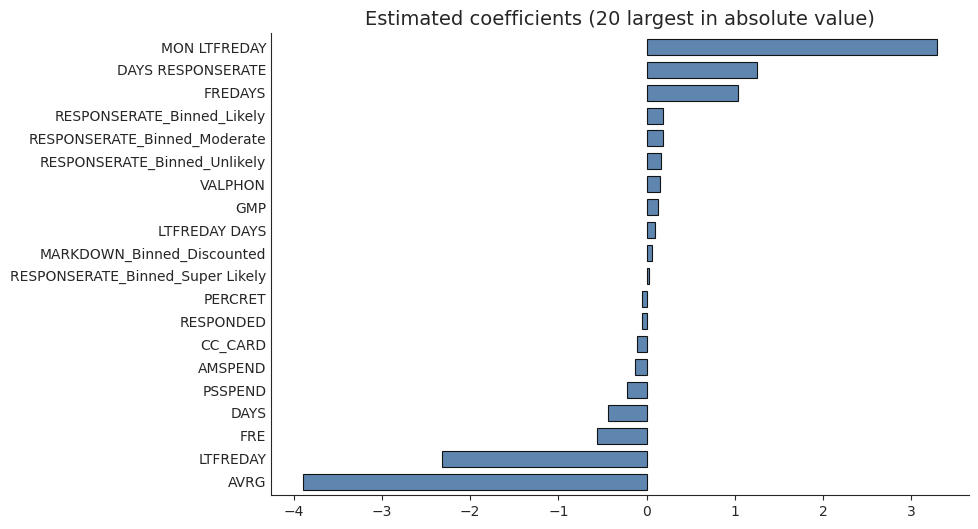

In [ ]:
from tutorial4 import coefplot
coefplot(logit, X_train_df.columns)
plt.show()

6.1.2 Logistic Regression with L1

code from tutorial 7

In [ ]:

from sklearn.linear_model import LogisticRegressionCV

logit_l1= LogisticRegressionCV(penalty='l1', solver='liblinear', scoring='neg_log_loss')



# Fit the model on the entire training data
logit_l1.fit(X_train, y_train)



/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1339: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


LogisticRegressionCV(penalty='l1', scoring='neg_log_loss', solver='liblinear')

6.1.3 Logistic Regression with L2

code from tutorial 7

In [ ]:

from sklearn.linear_model import LogisticRegressionCV

logit_l2= LogisticRegressionCV(Cs = 50, penalty='l2', solver='liblinear', scoring='neg_log_loss')



# Fit the model on the entire training data
logit_l2.fit(X_train, y_train)



/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1339: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


LogisticRegressionCV(Cs=50, scoring='neg_log_loss', solver='liblinear')

### 6.2 KNN

code from tutorial 4

In [ ]:

from sklearn.neighbors import KNeighborsClassifier

knn = KNeighborsClassifier(n_neighbors=30)
knn.fit(X_train, y_train)

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


KNeighborsClassifier(n_neighbors=30)

### 6.3 Decision Tree

code from torial 9




6.3.1 Try from max leaf nodes = 10

In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import export_graphviz
import graphviz

clf = DecisionTreeClassifier(criterion='entropy', max_leaf_nodes=10)
clf.fit(X_train, y_train)



DecisionTreeClassifier(criterion='entropy', max_leaf_nodes=10)

In [ ]:


#  Visualize the decision tree using graphviz
dot_data = export_graphviz(
    clf,
    out_file=None,
    impurity=False,
    feature_names=predictors,  # Features used in training
    class_names=['0', '1'],  # Class names: 0 and 1
    rounded=True,
    filled=True
)

graph = graphviz.Source(dot_data)
graph.render("decision_tree")    #save the tree as a file
graph.view()  # Open the visualization in a viewer

'decision_tree.pdf'

6.3.2 Cost complexity pruning

In [ ]:
model = DecisionTreeClassifier(criterion='entropy', min_samples_leaf=5)
path = model.cost_complexity_pruning_path(X_train, y_train)
alphas = path.ccp_alphas

### This below one will take very long time  (up to 20 minutes) to run

In [ ]:
from sklearn.model_selection import GridSearchCV
model = DecisionTreeClassifier(criterion='entropy', min_samples_leaf=5)

search_space = {
    'ccp_alpha': alphas,
}

tree_search = GridSearchCV(model, search_space, cv = 5 , scoring='neg_log_loss')
tree_search.fit(X_train, y_train)
tree = tree_search.best_estimator_

print('Best parameters found by grid search:', tree_search.best_params_, '\n')

Best parameters found by grid search: {'ccp_alpha': 0.0010591920907277036} 



Try using best parameters found by gridsearch

In [ ]:

clf = DecisionTreeClassifier(criterion='entropy', min_samples_leaf=5,max_leaf_nodes=10, ccp_alpha=tree_search.best_params_['ccp_alpha'])
clf.fit(X_train, y_train)

DecisionTreeClassifier(ccp_alpha=0.0010591920907277036, criterion='entropy',
                       max_leaf_nodes=10, min_samples_leaf=5)

In [ ]:


# Visualize the tree if needed
dot_data = export_graphviz(
    clf,
    out_file=None,
    impurity=False,
    feature_names=predictors,  # Features used in training
    class_names=['0', '1'],  # Class names: 0 and 1
    rounded=True,
    filled=True
)
graph = graphviz.Source(dot_data)
graph.render("decision_tree_final")  # save the tree as a file
graph.view()  # Open the visualization in a viewer

'decision_tree_final.pdf'

### 6.4 Random Forest

code from torial 9




6.4.1 Fit Random forest

In [ ]:
from sklearn.ensemble import RandomForestClassifier

rf =  RandomForestClassifier(n_estimators=100,  criterion='entropy',  max_features = 3, min_samples_leaf= 5)
rf.fit(X_train, y_train)

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


RandomForestClassifier(criterion='entropy', max_features=3, min_samples_leaf=5)

6.4.2 Hyperparameter optimization

In [ ]:
!pip install optuna

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 362.8/362.8 kB 6.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 233.2/233.2 kB 16.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.6/78.6 kB 5.3 MB/s eta 0:00:00


### This below one will take some time to run

In [ ]:
import optuna
from optuna.samplers import TPESampler
from sklearn.model_selection import cross_val_score

def objective(trial):

    criterion = trial.suggest_categorical('criterion', ['entropy', 'gini'])
    min_samples_leaf = trial.suggest_int('min_samples_leaf', 1, 20)
    max_features = trial.suggest_int('max_features', 1, 20)


    rf = RandomForestClassifier(n_estimators = 100,
                                  criterion = criterion,
                                  max_features = max_features,
                                  min_samples_leaf= min_samples_leaf,
                                  random_state = 1)

    scores = cross_val_score(rf, X_train, y_train, cv = 5, scoring = 'accuracy')
    loss = 1 - np.mean(scores)

    return loss

sampler = TPESampler(seed=42)
study = optuna.create_study(direction='minimize', sampler=sampler)
study.optimize(objective, n_trials = 100, timeout = 120)



[I 2024-10-30 01:11:43,442] A new study created in memory with name: no-name-98fd4ff8-38d9-4a6f-8610-1c93d9712c80
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:1473: DataConversionWarning: A colu

In [ ]:
params = study.best_params
params

{'criterion': 'gini', 'min_samples_leaf': 15, 'max_features': 12}

## This one take time to run

In [ ]:
 # **params "unpacks" the dictionary and passes the items as inputs to the random forest class

rf = RandomForestClassifier(n_estimators=1000, **params)
rf.fit(X_train, y_train)

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


RandomForestClassifier(max_features=12, min_samples_leaf=15, n_estimators=1000)

### 6.5 bagging

Code from tutorial 9

## This one take time to run

In [ ]:

from sklearn.ensemble import BaggingClassifier

bag = BaggingClassifier(DecisionTreeClassifier(criterion='entropy'), n_estimators=1000, random_state=42)
bag.fit(X_train, y_train)


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_bagging.py:888: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


BaggingClassifier(estimator=DecisionTreeClassifier(criterion='entropy'),
                  n_estimators=1000, random_state=42)

### 6.6 Catboost

Code from tutorial 10

In [ ]:
!pip install catboost

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.7/98.7 MB 7.5 MB/s eta 0:00:00


In [ ]:

import catboost
from catboost import CatBoostRegressor, CatBoostClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
# Initialize CatBoostClassifier
cb = CatBoostClassifier(loss_function='Logloss',
                        iterations=2000, learning_rate=0.01,
                        l2_leaf_reg=0.0, max_depth=6,
                        subsample=0.8, verbose=0,
                        random_state=42)  # Add random_state for reproducibility

# Train the CatBoost model
cb.fit(X_train, y_train)




### 6.7 LightGBM

## This one take time to run

Code from tutorial 10

In [ ]:
from sklearn.model_selection import GridSearchCV
import lightgbm as lgb
import numpy as np

param_grid = {

    'n_estimators': [ 1600, 1700, 1800, 1900, 2000],
    'num_leaves': [90, 100, 110]
}

lgbm = lgb.LGBMClassifier(random_state=42, early_stopping_rounds=10)
grid_search = GridSearchCV(lgbm, param_grid, cv=5, verbose=1)
grid_search.fit(X_train, y_train, eval_set=[(X_valid, y_valid)], eval_metric="logloss")

# Assign the best parameters to the variable
best_params_lightgbm = grid_search.best_params_

print(f"Best parameters for lightgbm: {best_params_lightgbm}")

Fitting 5 folds for each of 15 candidates, totalling 75 fits
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] Number of positive: 2022, number of negative: 10151
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003145 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3749
[LightGBM] [Info] Number of data points in the train set: 12173, number of used features: 26
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.166105 -> initscore=-1.613485
[LightGBM] [Info] Start training from score -1.613485
Training until validation scores don't improve for 10 rounds


/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


Early stopping, best iteration is:
[31]	valid_0's binary_logloss: 0.341934
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] Number of positive: 2022, number of negative: 10151
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002716 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3717
[LightGBM] [Info] Number of data points in the train set: 12173, number of used features: 26
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.166105 -> initscore=-1.613485
[LightGBM] [Info] Start training from score -1.613485
Training until validation scores don't improve for 10 rounds


/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


Early stopping, best iteration is:
[24]	valid_0's binary_logloss: 0.340589
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] Number of positive: 2023, number of negative: 10151
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002728 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3739
[LightGBM] [Info] Number of data points in the train set: 12174, number of used features: 26
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.166174 -> initscore=-1.612991
[LightGBM] [Info] Start training from score -1.612991
Training until validation scores don't improve for 10 rounds


/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


Early stopping, best iteration is:
[29]	valid_0's binary_logloss: 0.337564
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] Number of positive: 2023, number of negative: 10151
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002971 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3739
[LightGBM] [Info] Number of data points in the train set: 12174, number of used features: 26
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.166174 -> initscore=-1.612991
[LightGBM] [Info] Start training from score -1.612991
Training until validation scores don't improve for 10 rounds


/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


Early stopping, best iteration is:
[28]	valid_0's binary_logloss: 0.341994
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] Number of positive: 2022, number of negative: 10152
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002737 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3742
[LightGBM] [Info] Number of data points in the train set: 12174, number of used features: 26
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.166092 -> initscore=-1.613584
[LightGBM] [Info] Start training from score -1.613584
Training until validation scores don't improve for 10 rounds


/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


Early stopping, best iteration is:
[22]	valid_0's binary_logloss: 0.343506
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] Number of positive: 2022, number of negative: 10151
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002759 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3749
[LightGBM] [Info] Number of data points in the train set: 12173, number of used features: 26
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.166105 -> initscore=-1.613485
[LightGBM] [Info] Start training from score -1.613485
Training until validation scores don't improve for 10 rounds


/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


Early stopping, best iteration is:
[31]	valid_0's binary_logloss: 0.342362
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] Number of positive: 2022, number of negative: 10151
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002791 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3717
[LightGBM] [Info] Number of data points in the train set: 12173, number of used features: 26
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.166105 -> initscore=-1.613485
[LightGBM] [Info] Start training from score -1.613485
Training until validation scores don't improve for 10 rounds


/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


Early stopping, best iteration is:
[31]	valid_0's binary_logloss: 0.341595
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] Number of positive: 2023, number of negative: 10151
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002730 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3739
[LightGBM] [Info] Number of data points in the train set: 12174, number of used features: 26
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.166174 -> initscore=-1.612991
[LightGBM] [Info] Start training from score -1.612991
Training until validation scores don't improve for 10 rounds


/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


Early stopping, best iteration is:
[23]	valid_0's binary_logloss: 0.33889
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] Number of positive: 2023, number of negative: 10151
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002719 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3739
[LightGBM] [Info] Number of data points in the train set: 12174, number of used features: 26
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.166174 -> initscore=-1.612991
[LightGBM] [Info] Start training from score -1.612991
Training until validation scores don't improve for 10 rounds


/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


Early stopping, best iteration is:
[26]	valid_0's binary_logloss: 0.342114
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] Number of positive: 2022, number of negative: 10152
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002740 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3742
[LightGBM] [Info] Number of data points in the train set: 12174, number of used features: 26
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.166092 -> initscore=-1.613584
[LightGBM] [Info] Start training from score -1.613584
Training until validation scores don't improve for 10 rounds


/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


Early stopping, best iteration is:
[25]	valid_0's binary_logloss: 0.342074
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] Number of positive: 2022, number of negative: 10151
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002736 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3749
[LightGBM] [Info] Number of data points in the train set: 12173, number of used features: 26
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.166105 -> initscore=-1.613485
[LightGBM] [Info] Start training from score -1.613485
Training until validation scores don't improve for 10 rounds


/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


Early stopping, best iteration is:
[26]	valid_0's binary_logloss: 0.343797
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] Number of positive: 2022, number of negative: 10151
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002722 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3717
[LightGBM] [Info] Number of data points in the train set: 12173, number of used features: 26
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.166105 -> initscore=-1.613485
[LightGBM] [Info] Start training from score -1.613485
Training until validation scores don't improve for 10 rounds


/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


Early stopping, best iteration is:
[26]	valid_0's binary_logloss: 0.341939
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] Number of positive: 2023, number of negative: 10151
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002715 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3739
[LightGBM] [Info] Number of data points in the train set: 12174, number of used features: 26
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.166174 -> initscore=-1.612991
[LightGBM] [Info] Start training from score -1.612991
Training until validation scores don't improve for 10 rounds


/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


Early stopping, best iteration is:
[21]	valid_0's binary_logloss: 0.338015
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] Number of positive: 2023, number of negative: 10151
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002748 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3739
[LightGBM] [Info] Number of data points in the train set: 12174, number of used features: 26
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.166174 -> initscore=-1.612991
[LightGBM] [Info] Start training from score -1.612991
Training until validation scores don't improve for 10 rounds


/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


Early stopping, best iteration is:
[25]	valid_0's binary_logloss: 0.343648
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] Number of positive: 2022, number of negative: 10152
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002844 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3742
[LightGBM] [Info] Number of data points in the train set: 12174, number of used features: 26
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.166092 -> initscore=-1.613584
[LightGBM] [Info] Start training from score -1.613584
Training until validation scores don't improve for 10 rounds


/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


Early stopping, best iteration is:
[26]	valid_0's binary_logloss: 0.343241
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] Number of positive: 2022, number of negative: 10151
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002740 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3749
[LightGBM] [Info] Number of data points in the train set: 12173, number of used features: 26
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.166105 -> initscore=-1.613485
[LightGBM] [Info] Start training from score -1.613485
Training until validation scores don't improve for 10 rounds


/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


Early stopping, best iteration is:
[31]	valid_0's binary_logloss: 0.341934
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] Number of positive: 2022, number of negative: 10151
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002754 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3717
[LightGBM] [Info] Number of data points in the train set: 12173, number of used features: 26
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.166105 -> initscore=-1.613485
[LightGBM] [Info] Start training from score -1.613485
Training until validation scores don't improve for 10 rounds


/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


Early stopping, best iteration is:
[24]	valid_0's binary_logloss: 0.340589
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] Number of positive: 2023, number of negative: 10151
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003645 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3739
[LightGBM] [Info] Number of data points in the train set: 12174, number of used features: 26
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.166174 -> initscore=-1.612991
[LightGBM] [Info] Start training from score -1.612991
Training until validation scores don't improve for 10 rounds


/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


Early stopping, best iteration is:
[29]	valid_0's binary_logloss: 0.337564
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] Number of positive: 2023, number of negative: 10151
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002758 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3739
[LightGBM] [Info] Number of data points in the train set: 12174, number of used features: 26
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.166174 -> initscore=-1.612991
[LightGBM] [Info] Start training from score -1.612991
Training until validation scores don't improve for 10 rounds


/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


Early stopping, best iteration is:
[28]	valid_0's binary_logloss: 0.341994
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] Number of positive: 2022, number of negative: 10152
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002752 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3742
[LightGBM] [Info] Number of data points in the train set: 12174, number of used features: 26
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.166092 -> initscore=-1.613584
[LightGBM] [Info] Start training from score -1.613584
Training until validation scores don't improve for 10 rounds


/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


Early stopping, best iteration is:
[22]	valid_0's binary_logloss: 0.343506
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] Number of positive: 2022, number of negative: 10151
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002806 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3749
[LightGBM] [Info] Number of data points in the train set: 12173, number of used features: 26
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.166105 -> initscore=-1.613485
[LightGBM] [Info] Start training from score -1.613485
Training until validation scores don't improve for 10 rounds


/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


Early stopping, best iteration is:
[31]	valid_0's binary_logloss: 0.342362
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] Number of positive: 2022, number of negative: 10151
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002741 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3717
[LightGBM] [Info] Number of data points in the train set: 12173, number of used features: 26
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.166105 -> initscore=-1.613485
[LightGBM] [Info] Start training from score -1.613485
Training until validation scores don't improve for 10 rounds


/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


Early stopping, best iteration is:
[31]	valid_0's binary_logloss: 0.341595
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] Number of positive: 2023, number of negative: 10151
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002705 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3739
[LightGBM] [Info] Number of data points in the train set: 12174, number of used features: 26
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.166174 -> initscore=-1.612991
[LightGBM] [Info] Start training from score -1.612991
Training until validation scores don't improve for 10 rounds


/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


Early stopping, best iteration is:
[23]	valid_0's binary_logloss: 0.33889
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] Number of positive: 2023, number of negative: 10151
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003478 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3739
[LightGBM] [Info] Number of data points in the train set: 12174, number of used features: 26
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.166174 -> initscore=-1.612991
[LightGBM] [Info] Start training from score -1.612991
Training until validation scores don't improve for 10 rounds


/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


Early stopping, best iteration is:
[26]	valid_0's binary_logloss: 0.342114
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] Number of positive: 2022, number of negative: 10152
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003503 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3742
[LightGBM] [Info] Number of data points in the train set: 12174, number of used features: 26
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.166092 -> initscore=-1.613584
[LightGBM] [Info] Start training from score -1.613584
Training until validation scores don't improve for 10 rounds


/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


Early stopping, best iteration is:
[25]	valid_0's binary_logloss: 0.342074
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] Number of positive: 2022, number of negative: 10151
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003646 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3749
[LightGBM] [Info] Number of data points in the train set: 12173, number of used features: 26
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.166105 -> initscore=-1.613485
[LightGBM] [Info] Start training from score -1.613485
Training until validation scores don't improve for 10 rounds


/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


Early stopping, best iteration is:
[26]	valid_0's binary_logloss: 0.343797
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] Number of positive: 2022, number of negative: 10151
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003468 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3717
[LightGBM] [Info] Number of data points in the train set: 12173, number of used features: 26
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.166105 -> initscore=-1.613485
[LightGBM] [Info] Start training from score -1.613485
Training until validation scores don't improve for 10 rounds


/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


Early stopping, best iteration is:
[26]	valid_0's binary_logloss: 0.341939
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] Number of positive: 2023, number of negative: 10151
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003677 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3739
[LightGBM] [Info] Number of data points in the train set: 12174, number of used features: 26
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.166174 -> initscore=-1.612991
[LightGBM] [Info] Start training from score -1.612991
Training until validation scores don't improve for 10 rounds


/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


Early stopping, best iteration is:
[21]	valid_0's binary_logloss: 0.338015
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] Number of positive: 2023, number of negative: 10151
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003513 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3739
[LightGBM] [Info] Number of data points in the train set: 12174, number of used features: 26
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.166174 -> initscore=-1.612991
[LightGBM] [Info] Start training from score -1.612991
Training until validation scores don't improve for 10 rounds


/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


Early stopping, best iteration is:
[25]	valid_0's binary_logloss: 0.343648
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] Number of positive: 2022, number of negative: 10152
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003661 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3742
[LightGBM] [Info] Number of data points in the train set: 12174, number of used features: 26
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.166092 -> initscore=-1.613584
[LightGBM] [Info] Start training from score -1.613584
Training until validation scores don't improve for 10 rounds


/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


Early stopping, best iteration is:
[26]	valid_0's binary_logloss: 0.343241
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] Number of positive: 2022, number of negative: 10151
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002778 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3749
[LightGBM] [Info] Number of data points in the train set: 12173, number of used features: 26
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.166105 -> initscore=-1.613485
[LightGBM] [Info] Start training from score -1.613485
Training until validation scores don't improve for 10 rounds


/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


Early stopping, best iteration is:
[31]	valid_0's binary_logloss: 0.341934
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] Number of positive: 2022, number of negative: 10151
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002713 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3717
[LightGBM] [Info] Number of data points in the train set: 12173, number of used features: 26
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.166105 -> initscore=-1.613485
[LightGBM] [Info] Start training from score -1.613485
Training until validation scores don't improve for 10 rounds


/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


Early stopping, best iteration is:
[24]	valid_0's binary_logloss: 0.340589
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] Number of positive: 2023, number of negative: 10151
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003475 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3739
[LightGBM] [Info] Number of data points in the train set: 12174, number of used features: 26
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.166174 -> initscore=-1.612991
[LightGBM] [Info] Start training from score -1.612991
Training until validation scores don't improve for 10 rounds


/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


Early stopping, best iteration is:
[29]	valid_0's binary_logloss: 0.337564
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] Number of positive: 2023, number of negative: 10151
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002703 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3739
[LightGBM] [Info] Number of data points in the train set: 12174, number of used features: 26
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.166174 -> initscore=-1.612991
[LightGBM] [Info] Start training from score -1.612991
Training until validation scores don't improve for 10 rounds


/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


Early stopping, best iteration is:
[28]	valid_0's binary_logloss: 0.341994
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] Number of positive: 2022, number of negative: 10152
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002746 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3742
[LightGBM] [Info] Number of data points in the train set: 12174, number of used features: 26
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.166092 -> initscore=-1.613584
[LightGBM] [Info] Start training from score -1.613584
Training until validation scores don't improve for 10 rounds


/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


Early stopping, best iteration is:
[22]	valid_0's binary_logloss: 0.343506
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] Number of positive: 2022, number of negative: 10151
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002762 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3749
[LightGBM] [Info] Number of data points in the train set: 12173, number of used features: 26
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.166105 -> initscore=-1.613485
[LightGBM] [Info] Start training from score -1.613485
Training until validation scores don't improve for 10 rounds


/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


Early stopping, best iteration is:
[31]	valid_0's binary_logloss: 0.342362
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] Number of positive: 2022, number of negative: 10151
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002719 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3717
[LightGBM] [Info] Number of data points in the train set: 12173, number of used features: 26
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.166105 -> initscore=-1.613485
[LightGBM] [Info] Start training from score -1.613485
Training until validation scores don't improve for 10 rounds


/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


Early stopping, best iteration is:
[31]	valid_0's binary_logloss: 0.341595
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] Number of positive: 2023, number of negative: 10151
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002726 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3739
[LightGBM] [Info] Number of data points in the train set: 12174, number of used features: 26
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.166174 -> initscore=-1.612991
[LightGBM] [Info] Start training from score -1.612991
Training until validation scores don't improve for 10 rounds


/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


Early stopping, best iteration is:
[23]	valid_0's binary_logloss: 0.33889
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] Number of positive: 2023, number of negative: 10151
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002690 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3739
[LightGBM] [Info] Number of data points in the train set: 12174, number of used features: 26
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.166174 -> initscore=-1.612991
[LightGBM] [Info] Start training from score -1.612991
Training until validation scores don't improve for 10 rounds


/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


Early stopping, best iteration is:
[26]	valid_0's binary_logloss: 0.342114
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] Number of positive: 2022, number of negative: 10152
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002678 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3742
[LightGBM] [Info] Number of data points in the train set: 12174, number of used features: 26
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.166092 -> initscore=-1.613584
[LightGBM] [Info] Start training from score -1.613584
Training until validation scores don't improve for 10 rounds


/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


Early stopping, best iteration is:
[25]	valid_0's binary_logloss: 0.342074
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] Number of positive: 2022, number of negative: 10151
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002759 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3749
[LightGBM] [Info] Number of data points in the train set: 12173, number of used features: 26
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.166105 -> initscore=-1.613485
[LightGBM] [Info] Start training from score -1.613485
Training until validation scores don't improve for 10 rounds


/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


Early stopping, best iteration is:
[26]	valid_0's binary_logloss: 0.343797
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] Number of positive: 2022, number of negative: 10151
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002721 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3717
[LightGBM] [Info] Number of data points in the train set: 12173, number of used features: 26
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.166105 -> initscore=-1.613485
[LightGBM] [Info] Start training from score -1.613485
Training until validation scores don't improve for 10 rounds


/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


Early stopping, best iteration is:
[26]	valid_0's binary_logloss: 0.341939
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] Number of positive: 2023, number of negative: 10151
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002731 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3739
[LightGBM] [Info] Number of data points in the train set: 12174, number of used features: 26
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.166174 -> initscore=-1.612991
[LightGBM] [Info] Start training from score -1.612991
Training until validation scores don't improve for 10 rounds


/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


Early stopping, best iteration is:
[21]	valid_0's binary_logloss: 0.338015
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] Number of positive: 2023, number of negative: 10151
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002594 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3739
[LightGBM] [Info] Number of data points in the train set: 12174, number of used features: 26
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.166174 -> initscore=-1.612991
[LightGBM] [Info] Start training from score -1.612991
Training until validation scores don't improve for 10 rounds


/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


Early stopping, best iteration is:
[25]	valid_0's binary_logloss: 0.343648
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] Number of positive: 2022, number of negative: 10152
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002705 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3742
[LightGBM] [Info] Number of data points in the train set: 12174, number of used features: 26
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.166092 -> initscore=-1.613584
[LightGBM] [Info] Start training from score -1.613584
Training until validation scores don't improve for 10 rounds


/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


Early stopping, best iteration is:
[26]	valid_0's binary_logloss: 0.343241
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] Number of positive: 2022, number of negative: 10151
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002733 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3749
[LightGBM] [Info] Number of data points in the train set: 12173, number of used features: 26
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.166105 -> initscore=-1.613485
[LightGBM] [Info] Start training from score -1.613485
Training until validation scores don't improve for 10 rounds


/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


Early stopping, best iteration is:
[31]	valid_0's binary_logloss: 0.341934
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] Number of positive: 2022, number of negative: 10151
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002915 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3717
[LightGBM] [Info] Number of data points in the train set: 12173, number of used features: 26
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.166105 -> initscore=-1.613485
[LightGBM] [Info] Start training from score -1.613485
Training until validation scores don't improve for 10 rounds


/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


Early stopping, best iteration is:
[24]	valid_0's binary_logloss: 0.340589
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] Number of positive: 2023, number of negative: 10151
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002906 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3739
[LightGBM] [Info] Number of data points in the train set: 12174, number of used features: 26
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.166174 -> initscore=-1.612991
[LightGBM] [Info] Start training from score -1.612991
Training until validation scores don't improve for 10 rounds


/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


Early stopping, best iteration is:
[29]	valid_0's binary_logloss: 0.337564
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] Number of positive: 2023, number of negative: 10151
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002726 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3739
[LightGBM] [Info] Number of data points in the train set: 12174, number of used features: 26
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.166174 -> initscore=-1.612991
[LightGBM] [Info] Start training from score -1.612991
Training until validation scores don't improve for 10 rounds


/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


Early stopping, best iteration is:
[28]	valid_0's binary_logloss: 0.341994
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] Number of positive: 2022, number of negative: 10152
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002703 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3742
[LightGBM] [Info] Number of data points in the train set: 12174, number of used features: 26
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.166092 -> initscore=-1.613584
[LightGBM] [Info] Start training from score -1.613584
Training until validation scores don't improve for 10 rounds


/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


Early stopping, best iteration is:
[22]	valid_0's binary_logloss: 0.343506
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] Number of positive: 2022, number of negative: 10151
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002691 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3749
[LightGBM] [Info] Number of data points in the train set: 12173, number of used features: 26
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.166105 -> initscore=-1.613485
[LightGBM] [Info] Start training from score -1.613485
Training until validation scores don't improve for 10 rounds


/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


Early stopping, best iteration is:
[31]	valid_0's binary_logloss: 0.342362
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] Number of positive: 2022, number of negative: 10151
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003478 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3717
[LightGBM] [Info] Number of data points in the train set: 12173, number of used features: 26
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.166105 -> initscore=-1.613485
[LightGBM] [Info] Start training from score -1.613485
Training until validation scores don't improve for 10 rounds


/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


Early stopping, best iteration is:
[31]	valid_0's binary_logloss: 0.341595
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] Number of positive: 2023, number of negative: 10151
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003539 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3739
[LightGBM] [Info] Number of data points in the train set: 12174, number of used features: 26
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.166174 -> initscore=-1.612991
[LightGBM] [Info] Start training from score -1.612991
Training until validation scores don't improve for 10 rounds


/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


Early stopping, best iteration is:
[23]	valid_0's binary_logloss: 0.33889
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] Number of positive: 2023, number of negative: 10151
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.013929 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3739
[LightGBM] [Info] Number of data points in the train set: 12174, number of used features: 26
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.166174 -> initscore=-1.612991
[LightGBM] [Info] Start training from score -1.612991


/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[26]	valid_0's binary_logloss: 0.342114
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10


/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Info] Number of positive: 2022, number of negative: 10152
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003508 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3742
[LightGBM] [Info] Number of data points in the train set: 12174, number of used features: 26
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.166092 -> initscore=-1.613584
[LightGBM] [Info] Start training from score -1.613584
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[25]	valid_0's binary_logloss: 0.342074
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] Number of positive: 2

/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[26]	valid_0's binary_logloss: 0.343797
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] Number of positive: 2022, number of negative: 10151


/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003565 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3717
[LightGBM] [Info] Number of data points in the train set: 12173, number of used features: 26
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.166105 -> initscore=-1.613485
[LightGBM] [Info] Start training from score -1.613485
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[26]	valid_0's binary_logloss: 0.341939
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] Number of positive: 2023, number of negative: 10151


/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003678 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3739
[LightGBM] [Info] Number of data points in the train set: 12174, number of used features: 26
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.166174 -> initscore=-1.612991
[LightGBM] [Info] Start training from score -1.612991
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[21]	valid_0's binary_logloss: 0.338015
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] Number of positive: 2023, number of negative: 10151
[LightGBM] [Info] Auto-choosing row-wis

/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


Early stopping, best iteration is:
[25]	valid_0's binary_logloss: 0.343648
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] Number of positive: 2022, number of negative: 10152
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003600 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3742
[LightGBM] [Info] Number of data points in the train set: 12174, number of used features: 26
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.166092 -> initscore=-1.613584
[LightGBM] [Info] Start training from score -1.613584
Training until validation scores don't improve for 10 rounds


/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


Early stopping, best iteration is:
[26]	valid_0's binary_logloss: 0.343241
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10


/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Info] Number of positive: 2022, number of negative: 10151
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005732 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3749
[LightGBM] [Info] Number of data points in the train set: 12173, number of used features: 26
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.166105 -> initscore=-1.613485
[LightGBM] [Info] Start training from score -1.613485
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[31]	valid_0's binary_logloss: 0.341934
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] Number of positive: 2

/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


Early stopping, best iteration is:
[24]	valid_0's binary_logloss: 0.340589
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] Number of positive: 2023, number of negative: 10151
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003423 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3739
[LightGBM] [Info] Number of data points in the train set: 12174, number of used features: 26
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.166174 -> initscore=-1.612991
[LightGBM] [Info] Start training from score -1.612991
Training until validation scores don't improve for 10 rounds


/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


Early stopping, best iteration is:
[29]	valid_0's binary_logloss: 0.337564
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] Number of positive: 2023, number of negative: 10151
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003549 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3739
[LightGBM] [Info] Number of data points in the train set: 12174, number of used features: 26
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.166174 -> initscore=-1.612991
[LightGBM] [Info] Start training from score -1.612991
Training until validation scores don't improve for 10 rounds


/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


Early stopping, best iteration is:
[28]	valid_0's binary_logloss: 0.341994
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] Number of positive: 2022, number of negative: 10152
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003568 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3742
[LightGBM] [Info] Number of data points in the train set: 12174, number of used features: 26
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.166092 -> initscore=-1.613584
[LightGBM] [Info] Start training from score -1.613584
Training until validation scores don't improve for 10 rounds


/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


Early stopping, best iteration is:
[22]	valid_0's binary_logloss: 0.343506
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] Number of positive: 2022, number of negative: 10151
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004122 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3749
[LightGBM] [Info] Number of data points in the train set: 12173, number of used features: 26
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.166105 -> initscore=-1.613485
[LightGBM] [Info] Start training from score -1.613485
Training until validation scores don't improve for 10 rounds


/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


Early stopping, best iteration is:
[31]	valid_0's binary_logloss: 0.342362
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] Number of positive: 2022, number of negative: 10151
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003520 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3717
[LightGBM] [Info] Number of data points in the train set: 12173, number of used features: 26
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.166105 -> initscore=-1.613485
[LightGBM] [Info] Start training from score -1.613485
Training until validation scores don't improve for 10 rounds


/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


Early stopping, best iteration is:
[31]	valid_0's binary_logloss: 0.341595
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] Number of positive: 2023, number of negative: 10151
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003503 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3739
[LightGBM] [Info] Number of data points in the train set: 12174, number of used features: 26
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.166174 -> initscore=-1.612991
[LightGBM] [Info] Start training from score -1.612991
Training until validation scores don't improve for 10 rounds


/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


Early stopping, best iteration is:
[23]	valid_0's binary_logloss: 0.33889
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] Number of positive: 2023, number of negative: 10151
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003560 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3739
[LightGBM] [Info] Number of data points in the train set: 12174, number of used features: 26
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.166174 -> initscore=-1.612991
[LightGBM] [Info] Start training from score -1.612991
Training until validation scores don't improve for 10 rounds


/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


Early stopping, best iteration is:
[26]	valid_0's binary_logloss: 0.342114
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] Number of positive: 2022, number of negative: 10152
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003785 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3742
[LightGBM] [Info] Number of data points in the train set: 12174, number of used features: 26
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.166092 -> initscore=-1.613584
[LightGBM] [Info] Start training from score -1.613584
Training until validation scores don't improve for 10 rounds


/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


Early stopping, best iteration is:
[25]	valid_0's binary_logloss: 0.342074
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] Number of positive: 2022, number of negative: 10151
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003628 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3749
[LightGBM] [Info] Number of data points in the train set: 12173, number of used features: 26
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.166105 -> initscore=-1.613485
[LightGBM] [Info] Start training from score -1.613485
Training until validation scores don't improve for 10 rounds


/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


Early stopping, best iteration is:
[26]	valid_0's binary_logloss: 0.343797
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10


/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Info] Number of positive: 2022, number of negative: 10151
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.021561 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3717
[LightGBM] [Info] Number of data points in the train set: 12173, number of used features: 26
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.166105 -> initscore=-1.613485
[LightGBM] [Info] Start training from score -1.613485
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[26]	valid_0's binary_logloss: 0.341939
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] Number of positive: 2023, number of negative: 10151
[LightGBM] [Info] Auto-choosing r

/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


Early stopping, best iteration is:
[21]	valid_0's binary_logloss: 0.338015
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] Number of positive: 2023, number of negative: 10151
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005833 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3739
[LightGBM] [Info] Number of data points in the train set: 12174, number of used features: 26
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.166174 -> initscore=-1.612991
[LightGBM] [Info] Start training from score -1.612991
Training until validation scores don't improve for 10 rounds


/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


Early stopping, best iteration is:
[25]	valid_0's binary_logloss: 0.343648
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] Number of positive: 2022, number of negative: 10152
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003584 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3742
[LightGBM] [Info] Number of data points in the train set: 12174, number of used features: 26
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.166092 -> initscore=-1.613584
[LightGBM] [Info] Start training from score -1.613584
Training until validation scores don't improve for 10 rounds


/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


Early stopping, best iteration is:
[26]	valid_0's binary_logloss: 0.343241
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] Number of positive: 2528, number of negative: 12689
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004419 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3869
[LightGBM] [Info] Number of data points in the train set: 15217, number of used features: 26
[LightGBM] [Warning] early_stopping_round is set=10, early_stopping_rounds=10 will be ignored. Current value: early_stopping_round=10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.166130 -> initscore=-1.613307
[LightGBM] [Info] Start training from score -1.613307
Training until validation scores don't improve for 10 rounds


/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


Early stopping, best iteration is:
[36]	valid_0's binary_logloss: 0.339051
Best parameters for lightgbm: {'n_estimators': 1600, 'num_leaves': 90}


In [ ]:




# Instantiate a new LGBMClassifier with the best parameters from grid search
lgbm = lgb.LGBMClassifier(
    objective='binary',
    boosting_type='gbdt',
    n_estimators=best_params_lightgbm['n_estimators'],  # Use best n_estimators
    num_leaves=best_params_lightgbm['num_leaves'],      # Use best num_leaves
    learning_rate=0.01,
    lambda_l1=0.0,
    lambda_l2=0.0,
    bagging_fraction=0.74,
    bagging_freq=1,
    feature_fraction=1.0,
    min_data_in_leaf=1
)

# Train the optimized model with the best parameters
lgbm.fit(X_train, y_train, eval_set=[(X_valid, y_valid)], eval_metric="logloss")



[LightGBM] [Warning] min_data_in_leaf is set=1, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1
[LightGBM] [Warning] feature_fraction is set=1.0, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1.0
[LightGBM] [Warning] lambda_l2 is set=0.0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0
[LightGBM] [Warning] lambda_l1 is set=0.0, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0
[LightGBM] [Warning] bagging_fraction is set=0.74, subsample=1.0 will be ignored. Current value: bagging_fraction=0.74
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=1, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1
[LightGBM] [Warning] feature_fraction is set=1.0, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1.0
[LightGBM] [Warning] lambda_l2 is set=0.0, reg_lambda=0.0 will be ignored. Cur

/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


LGBMClassifier(bagging_fraction=0.74, bagging_freq=1, feature_fraction=1.0,
               lambda_l1=0.0, lambda_l2=0.0, learning_rate=0.01,
               min_data_in_leaf=1, n_estimators=1600, num_leaves=90,
               objective='binary')

### 6.8 XGboost

Code from tutorial 10 + adapted

In [ ]:
# prompt: edit the xgboost code below to my context (classification).
#Use tutorial 10 code to adapt

import xgboost as xgb


# Create an XGBoost classifier
xgb = xgb.XGBClassifier(
    objective='binary:logistic',
    n_estimators=100,
    max_depth=3,
    learning_rate=0.1,
    random_state=42
)

# Train the model
xgb.fit(X_train, y_train)




XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.1, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=3, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=100, n_jobs=None,
              num_parallel_tree=None, random_state=42, ...)

# Start Stacking


### 6.9 stacking (Random Forest + Logistic Regression)  - Logistic Regression as a meta model

Code from tutorial 6

In [ ]:

from sklearn.ensemble import StackingClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression



# Define the base models (estimators)
estimators = [('Random Forest', RandomForestClassifier(random_state=42,  **params)),
              ('Logistic Regression', LogisticRegression(random_state=42))
              ]

# Define the meta-model (final_estimator)
stack = StackingClassifier(estimators=estimators,
                           final_estimator=LogisticRegression(),  # Meta-model is Logistic Regression
                           cv=5
                           )  # 5-fold cross-validation

# Train the stacking model
stack.fit(X_train, y_train)



/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear

StackingClassifier(cv=5,
                   estimators=[('Random Forest',
                                RandomForestClassifier(max_features=12,
                                                       min_samples_leaf=15,
                                                       random_state=42)),
                               ('Logistic Regression',
                                LogisticRegression(random_state=42))],
                   final_estimator=LogisticRegression())

### 6.10 stacking (Bagging + Logistic Regression)  - Logistic Regression as a meta model

## This one take long time to run

In [ ]:


from sklearn.ensemble import StackingClassifier, BaggingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression

# Define the base models (estimators)
estimators = [
    ('Bagging', BaggingClassifier(DecisionTreeClassifier(criterion='entropy'),
                                  n_estimators=1000, random_state=42)),
    ('Logistic Regression', LogisticRegression(random_state=42))
]

# Define the meta-model (final_estimator)
stack2 = StackingClassifier(estimators=estimators,
                           final_estimator=LogisticRegression(),  # Meta-model is Logistic Regression
                           cv=5)  # 5-fold cross-validation

# Train the stacking model
stack2.fit(X_train, y_train)




/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear

StackingClassifier(cv=5,
                   estimators=[('Bagging',
                                BaggingClassifier(estimator=DecisionTreeClassifier(criterion='entropy'),
                                                  n_estimators=1000,
                                                  random_state=42)),
                               ('Logistic Regression',
                                LogisticRegression(random_state=42))],
                   final_estimator=LogisticRegression())

### 6.11 Stack (Logistic Regression + XGBoost)  - Logistic Regression as meta model

In [ ]:
from sklearn.ensemble import StackingClassifier
from sklearn.linear_model import LogisticRegression
from xgboost import XGBClassifier
from sklearn.metrics import classification_report, roc_auc_score

# Define the base models (estimators)
estimators = [
    ('Logistic Regression', LogisticRegression(random_state=42, max_iter=1000)),
    ('XGBoost', XGBClassifier(random_state=42))
]

# Define the meta-model (final_estimator)
stack3 = StackingClassifier(
    estimators=estimators,
    final_estimator=LogisticRegression(random_state=42),  # Meta-model is XGBoost
    cv=5  # 5-fold cross-validation
)

# Train the stacking model
stack3.fit(X_train, y_train)



/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


StackingClassifier(cv=5,
                   estimators=[('Logistic Regression',
                                LogisticRegression(max_iter=1000,
                                                   random_state=42)),
                               ('XGBoost',
                                XGBClassifier(base_score=None, booster=None,
                                              callbacks=None,
                                              colsample_bylevel=None,
                                              colsample_bynode=None,
                                              colsample_bytree=None,
                                              device=None,
                                              early_stopping_rounds=None,
                                              enable_categorical=False,
                                              eval_metric=None,
                                              feature_types=None, gamma...
                                              interaction_constraints=None,
                                              learning_rate=None, max_bin=None,
                                              max_cat_threshold=None,
                                              max_cat_to_onehot=None,
                                              max_delta_step=None,
                                              max_depth=None, max_leaves=None,
                                              min_child_weight=None,
                                              missing=nan,
                                              monotone_constraints=None,
                                              multi_strategy=None,
                                              n_estimators=None, n_jobs=None,
                                              num_parallel_tree=None,
                                              random_state=42, ...))],
                   final_estimator=LogisticRegression(random_state=42))

### 6.12 Stack (Logistic Regression + lightGBM) - Logistic Regression as meta model

In [ ]:
from lightgbm import LGBMClassifier # Import LGBMClassifier
from sklearn.ensemble import StackingClassifier # Import StackingClassifier


# Define the base models (estimators)
estimators = [
    ('Logistic Regression', LogisticRegression(random_state=42, max_iter=1000)),
    ('LightGBM', LGBMClassifier(objective='binary',
    boosting_type='gbdt',
    n_estimators=best_params_lightgbm['n_estimators'],  # Use best n_estimators
    num_leaves=best_params_lightgbm['num_leaves'],      # Use best num_leaves
    learning_rate=0.01,
    lambda_l1=0.0,
    lambda_l2=0.0,
    bagging_fraction=0.74,
    bagging_freq=1,
    feature_fraction=1.0,
    min_data_in_leaf=1, random_state=42))
]

# Define the meta-model (final_estimator)
stack4 = StackingClassifier(
    estimators=estimators,
    final_estimator=LogisticRegression(random_state=42),  # Meta-model is Logistic Regression
    cv=5  # 5-fold cross-validation
)

# Train the stacking model
stack4.fit(X_train, y_train)




/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] min_data_in_leaf is set=1, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=1.0, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1.0
[LightGBM] [Warning] lambda_l2 is set=0.0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0
[LightGBM] [Warning] lambda_l1 is set=0.0, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0
[LightGBM] [Warning] bagging_fraction is set=0.74, subsample=1.0 will be ignored. Current value: bagging_fraction=0.74
[LightGBM] [Warning] min_data_in_leaf is set=1, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=1.0, colsample_bytree=1.0 will be ignored. Curren

StackingClassifier(cv=5,
                   estimators=[('Logistic Regression',
                                LogisticRegression(max_iter=1000,
                                                   random_state=42)),
                               ('LightGBM',
                                LGBMClassifier(bagging_fraction=0.74,
                                               bagging_freq=1,
                                               feature_fraction=1.0,
                                               lambda_l1=0.0, lambda_l2=0.0,
                                               learning_rate=0.01,
                                               min_data_in_leaf=1,
                                               n_estimators=1600, num_leaves=90,
                                               objective='binary',
                                               random_state=42))],
                   final_estimator=LogisticRegression(random_state=42))

### 6.13 Stack (Logistic Regression  + Catboost) - Logistic Regression as meta model


In [ ]:


# Define the base models (estimators)
estimators = [
    ('Logistic Regression', LogisticRegression(random_state=42, max_iter=1000)),
    ('CatBoost', CatBoostClassifier(random_state=42, verbose=0))
]

# Define the meta-model (final_estimator)
stack5 = StackingClassifier(
    estimators=estimators,
    final_estimator=LogisticRegression(random_state=42),  # Meta-model is Logistic Regression
    cv=5  # 5-fold cross-validation
)

# Train the stacking model
stack5.fit(X_train, y_train)



/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


StackingClassifier(cv=5,
                   estimators=[('Logistic Regression',
                                LogisticRegression(max_iter=1000,
                                                   random_state=42)),
                               ('CatBoost',
                                <catboost.core.CatBoostClassifier object at 0x7c6f93b2e770>)],
                   final_estimator=LogisticRegression(random_state=42))

### 6.14 Stack (Logistic Regression + XGBoost + lightGBM) - Logistic Regression as meta model

In [ ]:

# Define the base models (estimators)
estimators = [
    ('Logistic Regression', LogisticRegression(random_state=42, max_iter=1000)),
    ('XGBoost', XGBClassifier(random_state=42)),
    ('LightGBM', LGBMClassifier(objective='binary',
    boosting_type='gbdt',
    n_estimators=best_params_lightgbm['n_estimators'],  # Use best n_estimators
    num_leaves=best_params_lightgbm['num_leaves'],      # Use best num_leaves
    learning_rate=0.01,
    lambda_l1=0.0,
    lambda_l2=0.0,
    bagging_fraction=0.74,
    bagging_freq=1,
    feature_fraction=1.0,
    min_data_in_leaf=1, random_state=42))
]

# Define the meta-model (final_estimator)
stack6 = StackingClassifier(
    estimators=estimators,
    final_estimator=LogisticRegression(random_state=42),  # Meta-model is Logistic Regression
    cv=5  # 5-fold cross-validation
)

# Train the stacking model
stack6.fit(X_train, y_train)




/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] min_data_in_leaf is set=1, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=1.0, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1.0
[LightGBM] [Warning] lambda_l2 is set=0.0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0
[LightGBM] [Warning] lambda_l1 is set=0.0, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0
[LightGBM] [Warning] bagging_fraction is set=0.74, subsample=1.0 will be ignored. Current value: bagging_fraction=0.74
[LightGBM] [Warning] min_data_in_leaf is set=1, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=1.0, colsample_bytree=1.0 will be ignored. Curren

StackingClassifier(cv=5,
                   estimators=[('Logistic Regression',
                                LogisticRegression(max_iter=1000,
                                                   random_state=42)),
                               ('XGBoost',
                                XGBClassifier(base_score=None, booster=None,
                                              callbacks=None,
                                              colsample_bylevel=None,
                                              colsample_bynode=None,
                                              colsample_bytree=None,
                                              device=None,
                                              early_stopping_rounds=None,
                                              enable_categorical=False,
                                              eval_metric=None,
                                              feature_types=None, gamma...
                                              multi_strategy=None,
                                              n_estimators=None, n_jobs=None,
                                              num_parallel_tree=None,
                                              random_state=42, ...)),
                               ('LightGBM',
                                LGBMClassifier(bagging_fraction=0.74,
                                               bagging_freq=1,
                                               feature_fraction=1.0,
                                               lambda_l1=0.0, lambda_l2=0.0,
                                               learning_rate=0.01,
                                               min_data_in_leaf=1,
                                               n_estimators=1600, num_leaves=90,
                                               objective='binary',
                                               random_state=42))],
                   final_estimator=LogisticRegression(random_state=42))

### 6.15 Stack (Logistic Regression + XGBoost + lightGBM + Catboost) - Logistic Regression as meta model

In [ ]:

# Define the base models (estimators)
estimators = [
    ('Logistic Regression', LogisticRegression(random_state=42, max_iter=1000)),
    ('XGBoost', XGBClassifier(random_state=42)),
    ('LightGBM', LGBMClassifier(objective='binary',
    boosting_type='gbdt',
    n_estimators=best_params_lightgbm['n_estimators'],  # Use best n_estimators
    num_leaves=best_params_lightgbm['num_leaves'],      # Use best num_leaves
    learning_rate=0.01,
    lambda_l1=0.0,
    lambda_l2=0.0,
    bagging_fraction=0.74,
    bagging_freq=1,
    feature_fraction=1.0,
    min_data_in_leaf=1, random_state=42)),
    ('CatBoost', CatBoostClassifier(random_state=42, verbose=0))
]

# Define the meta-model (final_estimator)
stack7 = StackingClassifier(
    estimators=estimators,
    final_estimator=LogisticRegression(random_state=42),  # Meta-model is Logistic Regression
    cv=5  # 5-fold cross-validation
)

# Train the stacking model
stack7.fit(X_train, y_train)



/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] min_data_in_leaf is set=1, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=1.0, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1.0
[LightGBM] [Warning] lambda_l2 is set=0.0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0
[LightGBM] [Warning] lambda_l1 is set=0.0, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0
[LightGBM] [Warning] bagging_fraction is set=0.74, subsample=1.0 will be ignored. Current value: bagging_fraction=0.74
[LightGBM] [Warning] min_data_in_leaf is set=1, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=1.0, colsample_bytree=1.0 will be ignored. Curren

StackingClassifier(cv=5,
                   estimators=[('Logistic Regression',
                                LogisticRegression(max_iter=1000,
                                                   random_state=42)),
                               ('XGBoost',
                                XGBClassifier(base_score=None, booster=None,
                                              callbacks=None,
                                              colsample_bylevel=None,
                                              colsample_bynode=None,
                                              colsample_bytree=None,
                                              device=None,
                                              early_stopping_rounds=None,
                                              enable_categorical=False,
                                              eval_metric=None,
                                              feature_types=None, gamma...
                                              random_state=42, ...)),
                               ('LightGBM',
                                LGBMClassifier(bagging_fraction=0.74,
                                               bagging_freq=1,
                                               feature_fraction=1.0,
                                               lambda_l1=0.0, lambda_l2=0.0,
                                               learning_rate=0.01,
                                               min_data_in_leaf=1,
                                               n_estimators=1600, num_leaves=90,
                                               objective='binary',
                                               random_state=42)),
                               ('CatBoost',
                                <catboost.core.CatBoostClassifier object at 0x7c6f93b2c6d0>)],
                   final_estimator=LogisticRegression(random_state=42))

### 6.16 Stack (Random Forests +Logistic Regression + XGBoost + lightGBM+Catboost) - Logistic Regression as meta model

In [ ]:


# Define the base models (estimators)
estimators = [
    ('Random Forest', RandomForestClassifier(random_state=42)),
    ('Logistic Regression', LogisticRegression(random_state=42, max_iter=1000)),
    ('XGBoost', XGBClassifier(random_state=42)),
    ('LightGBM', LGBMClassifier(objective='binary',
    boosting_type='gbdt',
    n_estimators=best_params_lightgbm['n_estimators'],  # Use best n_estimators
    num_leaves=best_params_lightgbm['num_leaves'],      # Use best num_leaves
    learning_rate=0.01,
    lambda_l1=0.0,
    lambda_l2=0.0,
    bagging_fraction=0.74,
    bagging_freq=1,
    feature_fraction=1.0,
    min_data_in_leaf=1, random_state=42)),
    ('CatBoost', CatBoostClassifier(random_state=42, verbose=0))
]

# Define the meta-model (final_estimator)
stack8 = StackingClassifier(
    estimators=estimators,
    final_estimator=LogisticRegression(random_state=42),  # Meta-model is Logistic Regression
    cv=5  # 5-fold cross-validation
)

# Train the stacking model
stack8.fit(X_train, y_train)



/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] min_data_in_leaf is set=1, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=1.0, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1.0
[LightGBM] [Warning] lambda_l2 is set=0.0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0
[LightGBM] [Warning] lambda_l1 is set=0.0, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0
[LightGBM] [Warning] bagging_fraction is set=0.74, subsample=1.0 will be ignored. Current value: bagging_fraction=0.74
[LightGBM] [Warning] min_data_in_leaf is set=1, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=1.0, colsample_bytree=1.0 will be ignored. Curren

StackingClassifier(cv=5,
                   estimators=[('Random Forest',
                                RandomForestClassifier(random_state=42)),
                               ('Logistic Regression',
                                LogisticRegression(max_iter=1000,
                                                   random_state=42)),
                               ('XGBoost',
                                XGBClassifier(base_score=None, booster=None,
                                              callbacks=None,
                                              colsample_bylevel=None,
                                              colsample_bynode=None,
                                              colsample_bytree=None,
                                              device=None,
                                              early_stopping_rounds=None,
                                              enable_ca...
                                              random_state=42, ...)),
                               ('LightGBM',
                                LGBMClassifier(bagging_fraction=0.74,
                                               bagging_freq=1,
                                               feature_fraction=1.0,
                                               lambda_l1=0.0, lambda_l2=0.0,
                                               learning_rate=0.01,
                                               min_data_in_leaf=1,
                                               n_estimators=1600, num_leaves=90,
                                               objective='binary',
                                               random_state=42)),
                               ('CatBoost',
                                <catboost.core.CatBoostClassifier object at 0x7c6f93b2cdc0>)],
                   final_estimator=LogisticRegression(random_state=42))

## This one runs quite long

### 6.17 Stack (Logistic Regression  + lightGBM +Bagging) - Logistic Regression as meta model

In [ ]:

# Define the base models (estimators)
estimators = [
    ('Logistic Regression', LogisticRegression(random_state=42, max_iter=1000)),
    ('LightGBM', LGBMClassifier(objective='binary',
    boosting_type='gbdt',
    n_estimators=best_params_lightgbm['n_estimators'],  # Use best n_estimators
    num_leaves=best_params_lightgbm['num_leaves'],      # Use best num_leaves
    learning_rate=0.01,
    lambda_l1=0.0,
    lambda_l2=0.0,
    bagging_fraction=0.74,
    bagging_freq=1,
    feature_fraction=1.0,
    min_data_in_leaf=1, random_state=42)),
    ('Bagging', BaggingClassifier(DecisionTreeClassifier(criterion='entropy'),
                                  n_estimators=1000, random_state=42))
]

# Define the meta-model (final_estimator)
stack9 = StackingClassifier(
    estimators=estimators,
    final_estimator=LogisticRegression(random_state=42),  # Meta-model is Logistic Regression
    cv=5  # 5-fold cross-validation
)

# Train the stacking model
stack9.fit(X_train, y_train)



/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] min_data_in_leaf is set=1, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=1.0, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1.0
[LightGBM] [Warning] lambda_l2 is set=0.0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0
[LightGBM] [Warning] lambda_l1 is set=0.0, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0
[LightGBM] [Warning] bagging_fraction is set=0.74, subsample=1.0 will be ignored. Current value: bagging_fraction=0.74
[LightGBM] [Warning] min_data_in_leaf is set=1, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=1.0, colsample_bytree=1.0 will be ignored. Curren

StackingClassifier(cv=5,
                   estimators=[('Logistic Regression',
                                LogisticRegression(max_iter=1000,
                                                   random_state=42)),
                               ('LightGBM',
                                LGBMClassifier(bagging_fraction=0.74,
                                               bagging_freq=1,
                                               feature_fraction=1.0,
                                               lambda_l1=0.0, lambda_l2=0.0,
                                               learning_rate=0.01,
                                               min_data_in_leaf=1,
                                               n_estimators=1600, num_leaves=90,
                                               objective='binary',
                                               random_state=42)),
                               ('Bagging',
                                BaggingClassifier(estimator=DecisionTreeClassifier(criterion='entropy'),
                                                  n_estimators=1000,
                                                  random_state=42))],
                   final_estimator=LogisticRegression(random_state=42))

### 6.18 Stack (Logistic Regression + lightGBM with L1) - Logistic Regression as meta model with L1

In [ ]:


# Define the base models (estimators)
estimators = [
    ('Logistic Regression', LogisticRegression(random_state=42)),
    ('LightGBM',  LGBMClassifier(objective='binary',
    boosting_type='gbdt',
    n_estimators=best_params_lightgbm['n_estimators'],  # Use best n_estimators
    num_leaves=best_params_lightgbm['num_leaves'],      # Use best num_leaves
    learning_rate=0.01,
    lambda_l1=0.0,
    lambda_l2=0.0,
    bagging_fraction=0.74,
    bagging_freq=1,
    feature_fraction=1.0,
    min_data_in_leaf=1, random_state=42, reg_alpha=1.0, reg_lambda=0))
]

# Define the meta-model (final_estimator)
stack10 = StackingClassifier(
    estimators=estimators,
    final_estimator=LogisticRegressionCV(random_state=42, penalty='l1', solver='liblinear',scoring='neg_log_loss'),  # Meta-model is Logistic Regression with L1
    cv=5  # 5-fold cross-validation
)

# Train the stacking model
stack10.fit(X_train, y_train)


/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear

[LightGBM] [Warning] min_data_in_leaf is set=1, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=1.0, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1.0
[LightGBM] [Warning] lambda_l2 is set=0.0, reg_lambda=0 will be ignored. Current value: lambda_l2=0.0
[LightGBM] [Warning] lambda_l1 is set=0.0, reg_alpha=1.0 will be ignored. Current value: lambda_l1=0.0
[LightGBM] [Warning] bagging_fraction is set=0.74, subsample=1.0 will be ignored. Current value: bagging_fraction=0.74
[LightGBM] [Warning] min_data_in_leaf is set=1, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=1.0, colsample_bytree=1.0 will be ignored. Current 

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _c

[LightGBM] [Warning] min_data_in_leaf is set=1, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=1.0, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1.0
[LightGBM] [Warning] lambda_l2 is set=0.0, reg_lambda=0 will be ignored. Current value: lambda_l2=0.0
[LightGBM] [Warning] lambda_l1 is set=0.0, reg_alpha=1.0 will be ignored. Current value: lambda_l1=0.0
[LightGBM] [Warning] bagging_fraction is set=0.74, subsample=1.0 will be ignored. Current value: bagging_fraction=0.74
[LightGBM] [Warning] min_data_in_leaf is set=1, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=1.0, colsample_bytree=1.0 will be ignored. Current 

StackingClassifier(cv=5,
                   estimators=[('Logistic Regression',
                                LogisticRegression(random_state=42)),
                               ('LightGBM',
                                LGBMClassifier(bagging_fraction=0.74,
                                               bagging_freq=1,
                                               feature_fraction=1.0,
                                               lambda_l1=0.0, lambda_l2=0.0,
                                               learning_rate=0.01,
                                               min_data_in_leaf=1,
                                               n_estimators=1600, num_leaves=90,
                                               objective='binary',
                                               random_state=42, reg_alpha=1.0,
                                               reg_lambda=0))],
                   final_estimator=LogisticRegressionCV(penalty='l1',
                                                        random_state=42,
                                                        scoring='neg_log_loss',
                                                        solver='liblinear'))

### 6.19 Stack (Logistic Regression + lightGBM with L2) - Logistic Regression as meta model with L2

In [ ]:

# Define the base models (estimators)
estimators = [
    ('Logistic Regression', LogisticRegression(random_state=42)),
    ('LightGBM', LGBMClassifier(objective='binary',
    boosting_type='gbdt',
    n_estimators=best_params_lightgbm['n_estimators'],  # Use best n_estimators
    num_leaves=best_params_lightgbm['num_leaves'],      # Use best num_leaves
    learning_rate=0.01,
    lambda_l1=0.0,
    lambda_l2=0.0,
    bagging_fraction=0.74,
    bagging_freq=1,
    feature_fraction=1.0,
    min_data_in_leaf=1, random_state=42, reg_alpha=0, reg_lambda=1.0))
]


# Define the meta-model (final_estimator)
stack11 = StackingClassifier(
    estimators=estimators,
    final_estimator=LogisticRegressionCV(Cs = 50, random_state=42, penalty='l2',solver='liblinear',scoring='neg_log_loss'),  # Meta-model is Logistic Regression with L2
    cv=5  # 5-fold cross-validation
)


# Train the stacking model
stack11.fit(X_train, y_train)


/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear

[LightGBM] [Warning] min_data_in_leaf is set=1, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=1.0, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1.0
[LightGBM] [Warning] lambda_l2 is set=0.0, reg_lambda=1.0 will be ignored. Current value: lambda_l2=0.0
[LightGBM] [Warning] lambda_l1 is set=0.0, reg_alpha=0 will be ignored. Current value: lambda_l1=0.0
[LightGBM] [Warning] bagging_fraction is set=0.74, subsample=1.0 will be ignored. Current value: bagging_fraction=0.74
[LightGBM] [Warning] min_data_in_leaf is set=1, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=1.0, colsample_bytree=1.0 will be ignored. Current 

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _c

[LightGBM] [Warning] min_data_in_leaf is set=1, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=1.0, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1.0
[LightGBM] [Warning] lambda_l2 is set=0.0, reg_lambda=1.0 will be ignored. Current value: lambda_l2=0.0
[LightGBM] [Warning] lambda_l1 is set=0.0, reg_alpha=0 will be ignored. Current value: lambda_l1=0.0
[LightGBM] [Warning] bagging_fraction is set=0.74, subsample=1.0 will be ignored. Current value: bagging_fraction=0.74
[LightGBM] [Warning] min_data_in_leaf is set=1, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=1.0, colsample_bytree=1.0 will be ignored. Current 

StackingClassifier(cv=5,
                   estimators=[('Logistic Regression',
                                LogisticRegression(random_state=42)),
                               ('LightGBM',
                                LGBMClassifier(bagging_fraction=0.74,
                                               bagging_freq=1,
                                               feature_fraction=1.0,
                                               lambda_l1=0.0, lambda_l2=0.0,
                                               learning_rate=0.01,
                                               min_data_in_leaf=1,
                                               n_estimators=1600, num_leaves=90,
                                               objective='binary',
                                               random_state=42, reg_alpha=0,
                                               reg_lambda=1.0))],
                   final_estimator=LogisticRegressionCV(Cs=50, random_state=42,
                                                        scoring='neg_log_loss',
                                                        solver='liblinear'))

### 6.20 Stack (Logistic Regression with L1 + lightGBM with L1) - Logistic Regression as meta model

In [ ]:


# Define the base models (estimators)
estimators = [
    ('Logistic Regression', LogisticRegressionCV(random_state=42, penalty='l1', solver='liblinear',scoring='neg_log_loss')),
    ('LightGBM',  LGBMClassifier(objective='binary',
    boosting_type='gbdt',
    n_estimators=best_params_lightgbm['n_estimators'],  # Use best n_estimators
    num_leaves=best_params_lightgbm['num_leaves'],      # Use best num_leaves
    learning_rate=0.01,
    lambda_l1=0.0,
    lambda_l2=0.0,
    bagging_fraction=0.74,
    bagging_freq=1,
    feature_fraction=1.0,
    min_data_in_leaf=1, random_state=42, reg_alpha=1.0, reg_lambda=0))
]

# Define the meta-model (final_estimator)
stack12 = StackingClassifier(
    estimators=estimators,
    final_estimator=LogisticRegression(random_state=42),  # Meta-model is Logistic Regression
    cv=5  # 5-fold cross-validation
)

# Train the stacking model
stack12.fit(X_train, y_train)



/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] min_data_in_leaf is set=1, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=1.0, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1.0
[LightGBM] [Warning] lambda_l2 is set=0.0, reg_lambda=0 will be ignored. Current value: lambda_l2=0.0
[LightGBM] [Warning] lambda_l1 is set=0.0, reg_alpha=1.0 will be ignored. Current value: lambda_l1=0.0
[LightGBM] [Warning] bagging_fraction is set=0.74, subsample=1.0 will be ignored. Current value: bagging_fraction=0.74
[LightGBM] [Warning] min_data_in_leaf is set=1, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=1.0, colsample_bytree=1.0 will be ignored. Current 

StackingClassifier(cv=5,
                   estimators=[('Logistic Regression',
                                LogisticRegressionCV(penalty='l1',
                                                     random_state=42,
                                                     scoring='neg_log_loss',
                                                     solver='liblinear')),
                               ('LightGBM',
                                LGBMClassifier(bagging_fraction=0.74,
                                               bagging_freq=1,
                                               feature_fraction=1.0,
                                               lambda_l1=0.0, lambda_l2=0.0,
                                               learning_rate=0.01,
                                               min_data_in_leaf=1,
                                               n_estimators=1600, num_leaves=90,
                                               objective='binary',
                                               random_state=42, reg_alpha=1.0,
                                               reg_lambda=0))],
                   final_estimator=LogisticRegression(random_state=42))

### 6.21 Stack (Logistic Regression with L2 + lightGBM with L2) - Logistic Regression as meta model

In [ ]:
from sklearn.ensemble import StackingClassifier
from sklearn.linear_model import LogisticRegression, LogisticRegressionCV
from lightgbm import LGBMClassifier
# Define the base models (estimators)
estimators = [
    ('Logistic Regression', LogisticRegressionCV(Cs = 50, random_state=42, penalty='l2',solver='liblinear',scoring='neg_log_loss')),
    ('LightGBM', LGBMClassifier(objective='binary',
    boosting_type='gbdt',
    n_estimators=best_params_lightgbm['n_estimators'],  # Use best n_estimators
    num_leaves=best_params_lightgbm['num_leaves'],      # Use best num_leaves
    learning_rate=0.01,
    lambda_l1=0.0,
    lambda_l2=0.0,
    bagging_fraction=0.74,
    bagging_freq=1,
    feature_fraction=1.0,
    min_data_in_leaf=1, random_state=42, reg_alpha=0, reg_lambda=1.0))
]


# Define the meta-model (final_estimator)
stack13 = StackingClassifier(
    estimators=estimators,
    final_estimator=LogisticRegression(random_state=42),  # Meta-model is Logistic Regression
    cv=5  # 5-fold cross-validation
)


# Train the stacking model
stack13.fit(X_train, y_train)



/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] min_data_in_leaf is set=1, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=1.0, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1.0
[LightGBM] [Warning] lambda_l2 is set=0.0, reg_lambda=1.0 will be ignored. Current value: lambda_l2=0.0
[LightGBM] [Warning] lambda_l1 is set=0.0, reg_alpha=0 will be ignored. Current value: lambda_l1=0.0
[LightGBM] [Warning] bagging_fraction is set=0.74, subsample=1.0 will be ignored. Current value: bagging_fraction=0.74
[LightGBM] [Warning] min_data_in_leaf is set=1, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=1.0, colsample_bytree=1.0 will be ignored. Current 

StackingClassifier(cv=5,
                   estimators=[('Logistic Regression',
                                LogisticRegressionCV(Cs=50, random_state=42,
                                                     scoring='neg_log_loss',
                                                     solver='liblinear')),
                               ('LightGBM',
                                LGBMClassifier(bagging_fraction=0.74,
                                               bagging_freq=1,
                                               feature_fraction=1.0,
                                               lambda_l1=0.0, lambda_l2=0.0,
                                               learning_rate=0.01,
                                               min_data_in_leaf=1,
                                               n_estimators=1600, num_leaves=90,
                                               objective='binary',
                                               random_state=42, reg_alpha=0,
                                               reg_lambda=1.0))],
                   final_estimator=LogisticRegression(random_state=42))

### 6.22 Stack (Logistic Regression with elastic net + lightGBM with L2) - Logistic Regression with elastic net as meta model

In [ ]:
from sklearn.linear_model import LogisticRegressionCV, LogisticRegression
from lightgbm import LGBMClassifier
from sklearn.ensemble import StackingClassifier
from sklearn.metrics import classification_report

# Define the base models (estimators) with Elastic Net for Logistic Regression
estimators = [
    ('Logistic Regression', LogisticRegressionCV(
        Cs=50, random_state=42, penalty='elasticnet', solver='saga',
        l1_ratios=[0.5], scoring='neg_log_loss'
    )),
    ('LightGBM', LGBMClassifier(objective='binary',
    boosting_type='gbdt',
    n_estimators=best_params_lightgbm['n_estimators'],  # Use best n_estimators
    num_leaves=best_params_lightgbm['num_leaves'],      # Use best num_leaves
    learning_rate=0.01,
    lambda_l1=0.0,
    lambda_l2=0.0,
    bagging_fraction=0.74,
    bagging_freq=1,
    feature_fraction=1.0,
    min_data_in_leaf=1, random_state=42, reg_alpha=0, reg_lambda=1.0))
]

# Define the meta-model with Elastic Net regularization
stack14 = StackingClassifier(
    estimators=estimators,
    final_estimator=LogisticRegressionCV(
     Cs=50, random_state=42, penalty='elasticnet', solver='saga', l1_ratios=[0.5]
    ),
    cv=5  # 5-fold cross-validation
)

# Train the stacking model
stack14.fit(X_train, y_train)




/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:349: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:349: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:349: ConvergenceWarning

[LightGBM] [Warning] min_data_in_leaf is set=1, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=1.0, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1.0
[LightGBM] [Warning] lambda_l2 is set=0.0, reg_lambda=1.0 will be ignored. Current value: lambda_l2=0.0
[LightGBM] [Warning] lambda_l1 is set=0.0, reg_alpha=0 will be ignored. Current value: lambda_l1=0.0
[LightGBM] [Warning] bagging_fraction is set=0.74, subsample=1.0 will be ignored. Current value: bagging_fraction=0.74
[LightGBM] [Warning] min_data_in_leaf is set=1, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=1.0, colsample_bytree=1.0 will be ignored. Current 

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:349: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:349: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:349: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:349: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:349: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:349: ConvergenceWarning: The max_iter was reached which 

[LightGBM] [Warning] min_data_in_leaf is set=1, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=1.0, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1.0
[LightGBM] [Warning] lambda_l2 is set=0.0, reg_lambda=1.0 will be ignored. Current value: lambda_l2=0.0
[LightGBM] [Warning] lambda_l1 is set=0.0, reg_alpha=0 will be ignored. Current value: lambda_l1=0.0
[LightGBM] [Warning] bagging_fraction is set=0.74, subsample=1.0 will be ignored. Current value: bagging_fraction=0.74
[LightGBM] [Warning] min_data_in_leaf is set=1, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=1.0, colsample_bytree=1.0 will be ignored. Current 

StackingClassifier(cv=5,
                   estimators=[('Logistic Regression',
                                LogisticRegressionCV(Cs=50, l1_ratios=[0.5],
                                                     penalty='elasticnet',
                                                     random_state=42,
                                                     scoring='neg_log_loss',
                                                     solver='saga')),
                               ('LightGBM',
                                LGBMClassifier(bagging_fraction=0.74,
                                               bagging_freq=1,
                                               feature_fraction=1.0,
                                               lambda_l1=0.0, lambda_l2=0.0,
                                               learning_rate=0.01,
                                               min_data_in_leaf=1,
                                               n_estimators=1600, num_leaves=90,
                                               objective='binary',
                                               random_state=42, reg_alpha=0,
                                               reg_lambda=1.0))],
                   final_estimator=LogisticRegressionCV(Cs=50, l1_ratios=[0.5],
                                                        penalty='elasticnet',
                                                        random_state=42,
                                                        solver='saga'))

### 6.23 Stack (Logistic Regression with elastic net + lightGBM with L1) - Logistic Regression with elastic net as meta model

In [ ]:
from sklearn.linear_model import LogisticRegressionCV, LogisticRegression
from lightgbm import LGBMClassifier
from sklearn.ensemble import StackingClassifier
from sklearn.metrics import classification_report

# Define the base models (estimators) with Elastic Net for Logistic Regression
estimators = [
    ('Logistic Regression', LogisticRegressionCV(
        Cs=50, random_state=42, penalty='elasticnet', solver='saga',
        l1_ratios=[0.5], scoring='neg_log_loss'
    )),
    ('LightGBM', LGBMClassifier(objective='binary',
    boosting_type='gbdt',
    n_estimators=best_params_lightgbm['n_estimators'],  # Use best n_estimators
    num_leaves=best_params_lightgbm['num_leaves'],      # Use best num_leaves
    learning_rate=0.01,
    lambda_l1=0.0,
    lambda_l2=0.0,
    bagging_fraction=0.74,
    bagging_freq=1,
    feature_fraction=1.0,
    min_data_in_leaf=1, random_state=42, reg_alpha=1.0, reg_lambda=0))
]

# Define the meta-model with Elastic Net regularization
stack15 = StackingClassifier(
    estimators=estimators,
    final_estimator=LogisticRegressionCV(
     Cs=50, random_state=42, penalty='elasticnet', solver='saga', l1_ratios=[0.5]
    ),
    cv=5  # 5-fold cross-validation
)

# Train the stacking model
stack15.fit(X_train, y_train)



/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:349: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:349: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:349: ConvergenceWarning

[LightGBM] [Warning] min_data_in_leaf is set=1, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=1.0, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1.0
[LightGBM] [Warning] lambda_l2 is set=0.0, reg_lambda=0 will be ignored. Current value: lambda_l2=0.0
[LightGBM] [Warning] lambda_l1 is set=0.0, reg_alpha=1.0 will be ignored. Current value: lambda_l1=0.0
[LightGBM] [Warning] bagging_fraction is set=0.74, subsample=1.0 will be ignored. Current value: bagging_fraction=0.74
[LightGBM] [Warning] min_data_in_leaf is set=1, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=1.0, colsample_bytree=1.0 will be ignored. Current 

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:349: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:349: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:349: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:349: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:349: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:349: ConvergenceWarning: The max_iter was reached which 

[LightGBM] [Warning] min_data_in_leaf is set=1, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=1.0, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1.0
[LightGBM] [Warning] lambda_l2 is set=0.0, reg_lambda=0 will be ignored. Current value: lambda_l2=0.0
[LightGBM] [Warning] lambda_l1 is set=0.0, reg_alpha=1.0 will be ignored. Current value: lambda_l1=0.0
[LightGBM] [Warning] bagging_fraction is set=0.74, subsample=1.0 will be ignored. Current value: bagging_fraction=0.74
[LightGBM] [Warning] min_data_in_leaf is set=1, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=1.0, colsample_bytree=1.0 will be ignored. Current 

StackingClassifier(cv=5,
                   estimators=[('Logistic Regression',
                                LogisticRegressionCV(Cs=50, l1_ratios=[0.5],
                                                     penalty='elasticnet',
                                                     random_state=42,
                                                     scoring='neg_log_loss',
                                                     solver='saga')),
                               ('LightGBM',
                                LGBMClassifier(bagging_fraction=0.74,
                                               bagging_freq=1,
                                               feature_fraction=1.0,
                                               lambda_l1=0.0, lambda_l2=0.0,
                                               learning_rate=0.01,
                                               min_data_in_leaf=1,
                                               n_estimators=1600, num_leaves=90,
                                               objective='binary',
                                               random_state=42, reg_alpha=1.0,
                                               reg_lambda=0))],
                   final_estimator=LogisticRegressionCV(Cs=50, l1_ratios=[0.5],
                                                        penalty='elasticnet',
                                                        random_state=42,
                                                        solver='saga'))

### 6.24 Stack (Logistic Regression with elastic net + lightGBM with L1) - Logistic Regression as meta model

In [ ]:
from sklearn.linear_model import LogisticRegressionCV, LogisticRegression
from lightgbm import LGBMClassifier
from sklearn.ensemble import StackingClassifier
from sklearn.metrics import classification_report

# Define the base models (estimators) with Elastic Net for Logistic Regression
estimators = [
    ('Logistic Regression', LogisticRegressionCV(
        Cs=50, random_state=42, penalty='elasticnet', solver='saga',
        l1_ratios=[0.5], scoring='neg_log_loss')
    ),
    ('LightGBM', LGBMClassifier(objective='binary',
    boosting_type='gbdt',
    n_estimators=best_params_lightgbm['n_estimators'],  # Use best n_estimators
    num_leaves=best_params_lightgbm['num_leaves'],      # Use best num_leaves
    learning_rate=0.01,
    lambda_l1=0.0,
    lambda_l2=0.0,
    bagging_fraction=0.74,
    bagging_freq=1,
    feature_fraction=1.0,
    min_data_in_leaf=1, random_state=42, reg_alpha=1.0, reg_lambda=0))
]

# Define the meta-model
stack16 = StackingClassifier(
    estimators=estimators,
    final_estimator=LogisticRegression(
        random_state=42),
    cv=5  # 5-fold cross-validation
)

# Train the stacking model
stack16.fit(X_train, y_train)



/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:349: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:349: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:349: ConvergenceWarning

[LightGBM] [Warning] min_data_in_leaf is set=1, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=1.0, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1.0
[LightGBM] [Warning] lambda_l2 is set=0.0, reg_lambda=0 will be ignored. Current value: lambda_l2=0.0
[LightGBM] [Warning] lambda_l1 is set=0.0, reg_alpha=1.0 will be ignored. Current value: lambda_l1=0.0
[LightGBM] [Warning] bagging_fraction is set=0.74, subsample=1.0 will be ignored. Current value: bagging_fraction=0.74
[LightGBM] [Warning] min_data_in_leaf is set=1, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=1.0, colsample_bytree=1.0 will be ignored. Current 

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:349: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:349: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:349: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:349: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:349: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:349: ConvergenceWarning: The max_iter was reached which 

[LightGBM] [Warning] min_data_in_leaf is set=1, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=1.0, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1.0
[LightGBM] [Warning] lambda_l2 is set=0.0, reg_lambda=0 will be ignored. Current value: lambda_l2=0.0
[LightGBM] [Warning] lambda_l1 is set=0.0, reg_alpha=1.0 will be ignored. Current value: lambda_l1=0.0
[LightGBM] [Warning] bagging_fraction is set=0.74, subsample=1.0 will be ignored. Current value: bagging_fraction=0.74
[LightGBM] [Warning] min_data_in_leaf is set=1, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=1.0, colsample_bytree=1.0 will be ignored. Current 

StackingClassifier(cv=5,
                   estimators=[('Logistic Regression',
                                LogisticRegressionCV(Cs=50, l1_ratios=[0.5],
                                                     penalty='elasticnet',
                                                     random_state=42,
                                                     scoring='neg_log_loss',
                                                     solver='saga')),
                               ('LightGBM',
                                LGBMClassifier(bagging_fraction=0.74,
                                               bagging_freq=1,
                                               feature_fraction=1.0,
                                               lambda_l1=0.0, lambda_l2=0.0,
                                               learning_rate=0.01,
                                               min_data_in_leaf=1,
                                               n_estimators=1600, num_leaves=90,
                                               objective='binary',
                                               random_state=42, reg_alpha=1.0,
                                               reg_lambda=0))],
                   final_estimator=LogisticRegression(random_state=42))

### 6.25 Stack (Logistic Regression with elastic net + lightGBM with L2) - Logistic Regression as meta model

In [ ]:
from sklearn.linear_model import LogisticRegressionCV, LogisticRegression
from lightgbm import LGBMClassifier
from sklearn.ensemble import StackingClassifier
from sklearn.metrics import classification_report

# Define the base models (estimators) with Elastic Net for Logistic Regression
estimators = [
    ('Logistic Regression', LogisticRegressionCV(
        Cs=50, random_state=42, penalty='elasticnet', solver='saga',
        l1_ratios=[0.5], scoring='neg_log_loss'
    )),
    ('LightGBM', LGBMClassifier(objective='binary',
    boosting_type='gbdt',
    n_estimators=best_params_lightgbm['n_estimators'],  # Use best n_estimators
    num_leaves=best_params_lightgbm['num_leaves'],      # Use best num_leaves
    learning_rate=0.01,
    lambda_l1=0.0,
    lambda_l2=0.0,
    bagging_fraction=0.74,
    bagging_freq=1,
    feature_fraction=1.0,
    min_data_in_leaf=1, random_state=42, reg_alpha=0, reg_lambda=1.0))
]

# Define the meta-model
stack17 = StackingClassifier(
    estimators=estimators,
    final_estimator=LogisticRegression(
        random_state=42),
    cv=5  # 5-fold cross-validation
)

# Train the stacking model
stack17.fit(X_train, y_train)




/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:349: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:349: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:349: ConvergenceWarning

[LightGBM] [Warning] min_data_in_leaf is set=1, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=1.0, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1.0
[LightGBM] [Warning] lambda_l2 is set=0.0, reg_lambda=1.0 will be ignored. Current value: lambda_l2=0.0
[LightGBM] [Warning] lambda_l1 is set=0.0, reg_alpha=0 will be ignored. Current value: lambda_l1=0.0
[LightGBM] [Warning] bagging_fraction is set=0.74, subsample=1.0 will be ignored. Current value: bagging_fraction=0.74
[LightGBM] [Warning] min_data_in_leaf is set=1, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=1.0, colsample_bytree=1.0 will be ignored. Current 

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:349: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:349: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:349: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:349: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:349: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:349: ConvergenceWarning: The max_iter was reached which 

[LightGBM] [Warning] min_data_in_leaf is set=1, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=1.0, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1.0
[LightGBM] [Warning] lambda_l2 is set=0.0, reg_lambda=1.0 will be ignored. Current value: lambda_l2=0.0
[LightGBM] [Warning] lambda_l1 is set=0.0, reg_alpha=0 will be ignored. Current value: lambda_l1=0.0
[LightGBM] [Warning] bagging_fraction is set=0.74, subsample=1.0 will be ignored. Current value: bagging_fraction=0.74
[LightGBM] [Warning] min_data_in_leaf is set=1, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=1.0, colsample_bytree=1.0 will be ignored. Current 

StackingClassifier(cv=5,
                   estimators=[('Logistic Regression',
                                LogisticRegressionCV(Cs=50, l1_ratios=[0.5],
                                                     penalty='elasticnet',
                                                     random_state=42,
                                                     scoring='neg_log_loss',
                                                     solver='saga')),
                               ('LightGBM',
                                LGBMClassifier(bagging_fraction=0.74,
                                               bagging_freq=1,
                                               feature_fraction=1.0,
                                               lambda_l1=0.0, lambda_l2=0.0,
                                               learning_rate=0.01,
                                               min_data_in_leaf=1,
                                               n_estimators=1600, num_leaves=90,
                                               objective='binary',
                                               random_state=42, reg_alpha=0,
                                               reg_lambda=1.0))],
                   final_estimator=LogisticRegression(random_state=42))

### 6.26 Stack (Logistic Regression + lightGBM with L1) - Logistic Regression with elastic net as meta model

In [ ]:
from sklearn.linear_model import LogisticRegressionCV, LogisticRegression
from lightgbm import LGBMClassifier
from sklearn.ensemble import StackingClassifier
from sklearn.metrics import classification_report

# Define the base models (estimators) with Elastic Net for Logistic Regression
estimators = [
    ('Logistic Regression', LogisticRegression(random_state=42)
    ),
    ('LightGBM', LGBMClassifier(objective='binary',
    boosting_type='gbdt',
    n_estimators=best_params_lightgbm['n_estimators'],  # Use best n_estimators
    num_leaves=best_params_lightgbm['num_leaves'],      # Use best num_leaves
    learning_rate=0.01,
    lambda_l1=0.0,
    lambda_l2=0.0,
    bagging_fraction=0.74,
    bagging_freq=1,
    feature_fraction=1.0,
    min_data_in_leaf=1, random_state=42, reg_alpha=1.0, reg_lambda=0))
]

# Define the meta-model with Elastic Net regularization
stack18 = StackingClassifier(
    estimators=estimators,
    final_estimator=LogisticRegressionCV(
      Cs=50, random_state=42, penalty='elasticnet', solver='saga', l1_ratios=[0.5]),
    cv=5  # 5-fold cross-validation
)

# Train the stacking model
stack18.fit(X_train, y_train)



/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear

[LightGBM] [Warning] min_data_in_leaf is set=1, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=1.0, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1.0
[LightGBM] [Warning] lambda_l2 is set=0.0, reg_lambda=0 will be ignored. Current value: lambda_l2=0.0
[LightGBM] [Warning] lambda_l1 is set=0.0, reg_alpha=1.0 will be ignored. Current value: lambda_l1=0.0
[LightGBM] [Warning] bagging_fraction is set=0.74, subsample=1.0 will be ignored. Current value: bagging_fraction=0.74
[LightGBM] [Warning] min_data_in_leaf is set=1, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=1.0, colsample_bytree=1.0 will be ignored. Current 

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _c

[LightGBM] [Warning] min_data_in_leaf is set=1, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=1.0, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1.0
[LightGBM] [Warning] lambda_l2 is set=0.0, reg_lambda=0 will be ignored. Current value: lambda_l2=0.0
[LightGBM] [Warning] lambda_l1 is set=0.0, reg_alpha=1.0 will be ignored. Current value: lambda_l1=0.0
[LightGBM] [Warning] bagging_fraction is set=0.74, subsample=1.0 will be ignored. Current value: bagging_fraction=0.74
[LightGBM] [Warning] min_data_in_leaf is set=1, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=1.0, colsample_bytree=1.0 will be ignored. Current 

StackingClassifier(cv=5,
                   estimators=[('Logistic Regression',
                                LogisticRegression(random_state=42)),
                               ('LightGBM',
                                LGBMClassifier(bagging_fraction=0.74,
                                               bagging_freq=1,
                                               feature_fraction=1.0,
                                               lambda_l1=0.0, lambda_l2=0.0,
                                               learning_rate=0.01,
                                               min_data_in_leaf=1,
                                               n_estimators=1600, num_leaves=90,
                                               objective='binary',
                                               random_state=42, reg_alpha=1.0,
                                               reg_lambda=0))],
                   final_estimator=LogisticRegressionCV(Cs=50, l1_ratios=[0.5],
                                                        penalty='elasticnet',
                                                        random_state=42,
                                                        solver='saga'))

### 6.27 Stack (Logistic Regression + lightGBM with L2) - Logistic Regression with elastic net as meta model

In [ ]:
from sklearn.linear_model import LogisticRegressionCV, LogisticRegression
from lightgbm import LGBMClassifier
from sklearn.ensemble import StackingClassifier
from sklearn.metrics import classification_report

# Define the base models (estimators) with Elastic Net for Logistic Regression
estimators = [
    ('Logistic Regression', LogisticRegression(random_state=42)
    ),
    ('LightGBM', LGBMClassifier(objective='binary',
    boosting_type='gbdt',
    n_estimators=best_params_lightgbm['n_estimators'],  # Use best n_estimators
    num_leaves=best_params_lightgbm['num_leaves'],      # Use best num_leaves
    learning_rate=0.01,
    lambda_l1=0.0,
    lambda_l2=0.0,
    bagging_fraction=0.74,
    bagging_freq=1,
    feature_fraction=1.0,
    min_data_in_leaf=1, random_state=42, reg_alpha=0, reg_lambda=1.0))
]

# Define the meta-model with Elastic Net regularization
stack19 = StackingClassifier(
    estimators=estimators,
    final_estimator=LogisticRegressionCV(
      Cs=50, random_state=42, penalty='elasticnet', solver='saga', l1_ratios=[0.5]),
    cv=5  # 5-fold cross-validation
)

# Train the stacking model
stack19.fit(X_train, y_train)



/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear

[LightGBM] [Warning] min_data_in_leaf is set=1, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=1.0, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1.0
[LightGBM] [Warning] lambda_l2 is set=0.0, reg_lambda=1.0 will be ignored. Current value: lambda_l2=0.0
[LightGBM] [Warning] lambda_l1 is set=0.0, reg_alpha=0 will be ignored. Current value: lambda_l1=0.0
[LightGBM] [Warning] bagging_fraction is set=0.74, subsample=1.0 will be ignored. Current value: bagging_fraction=0.74
[LightGBM] [Warning] min_data_in_leaf is set=1, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=1.0, colsample_bytree=1.0 will be ignored. Current 

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _c

[LightGBM] [Warning] min_data_in_leaf is set=1, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=1.0, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1.0
[LightGBM] [Warning] lambda_l2 is set=0.0, reg_lambda=1.0 will be ignored. Current value: lambda_l2=0.0
[LightGBM] [Warning] lambda_l1 is set=0.0, reg_alpha=0 will be ignored. Current value: lambda_l1=0.0
[LightGBM] [Warning] bagging_fraction is set=0.74, subsample=1.0 will be ignored. Current value: bagging_fraction=0.74
[LightGBM] [Warning] min_data_in_leaf is set=1, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=1.0, colsample_bytree=1.0 will be ignored. Current 

StackingClassifier(cv=5,
                   estimators=[('Logistic Regression',
                                LogisticRegression(random_state=42)),
                               ('LightGBM',
                                LGBMClassifier(bagging_fraction=0.74,
                                               bagging_freq=1,
                                               feature_fraction=1.0,
                                               lambda_l1=0.0, lambda_l2=0.0,
                                               learning_rate=0.01,
                                               min_data_in_leaf=1,
                                               n_estimators=1600, num_leaves=90,
                                               objective='binary',
                                               random_state=42, reg_alpha=0,
                                               reg_lambda=1.0))],
                   final_estimator=LogisticRegressionCV(Cs=50, l1_ratios=[0.5],
                                                        penalty='elasticnet',
                                                        random_state=42,
                                                        solver='saga'))

# 7. Evaluation

In [ ]:
from sklearn.metrics import confusion_matrix, roc_auc_score, precision_score, log_loss

columns = ['Loss', 'SE', 'Sensitivity', 'Specificity', 'Precision', 'AUC', 'Cross-entropy']
rows = ['Logistic regression', 'KNN', 'Decision Tree','Random Forests','Bagging',
        'Catboost','LightGBM','XGBoost',
        'Logistic Regression with L1','Logistic Regression with L2',
        'Stack (LogisticRegression + Random forest; logit = meta)',
        'Stack (LogisticRegression + Bagging; logit = meta)',
        'Stack (LogisticRegression + XGboost; logit = meta)',
        'Stack (Logistic Regression + LightGBM; logit = meta))',
        'Stack (LogisticRegression + Catboost; logit = meta)',
        'Stack (Logistic Regression + XGBoost + LightGBM; logit = meta)',
        'Stack (Logistic Regression + XGBoost + LightGBM + Catboost; logit = meta)',
        'Stack (Logistic Regression + XGBoost + LightGBM + Catboost + Random Forests; logit = meta)',
        'Stack (Logistic Regression + LightGBM + Bagging; logit = meta)',
        'Stack (Logistic Regression + LightGBM with L1; logit with L1 = meta))',
        'Stack (Logistic Regression + LightGBM with L2; logit with L2 = meta))',
        'Stack (Logistic Regression with L1 + LightGBM with L1; logit = meta))',
         'Stack (Logistic Regression with L2 + LightGBM with L2; logit = meta))',
        'Stack (Logistic Regression with elastic net+ LightGBM with L2; logit with elastic net = meta))',
        'Stack (Logistic Regression with elastic net+ LightGBM with L1; logit with elastic net = meta))',
         'Stack (Logistic Regression with elastic net+ LightGBM with L1; logit = meta)',
         'Stack (Logistic Regression with elastic net+ LightGBM with L2; logit = meta)',
         'Stack (Logistic Regression + LightGBM with L1; logit with elastic net = meta)',
        'Stack (Logistic Regression + LightGBM with L2; logit with elastic net = meta)',
  ]  # Updated rows

results = pd.DataFrame(0.0, columns=columns, index=rows)

methods = [logit, knn, clf,rf, bag, cb, lgbm, xgb,
            logit_l1, logit_l2, stack, stack2, stack3, stack4, stack5,
           stack6, stack7, stack8, stack9, stack10, stack11, stack12, stack13,
           stack14, stack15, stack16, stack17, stack18, stack19]  # Updated methods list



y_valid = np.ravel(y_valid)
y_prob = np.zeros((len(y_valid), len(rows)))

for i, method in enumerate(methods):
    y_prob[:, i] = method.predict_proba(X_valid)[:, 1]
    y_pred = (y_prob[:, i] > tau).astype(int)

    loss = (y_pred != y_valid).astype(int)

    tn, fp, fn, tp = confusion_matrix(y_valid, y_pred).ravel()

    results.iloc[i, 0] = np.mean(loss)
    results.iloc[i, 1] = np.std(loss) / np.sqrt(len(y_valid))
    results.iloc[i, 2] = tp / (tp + fn)
    results.iloc[i, 3] = tn / (tn + fp)
    results.iloc[i, 4] = precision_score(y_valid, y_pred)
    results.iloc[i, 5] = roc_auc_score(y_valid, y_prob[:, i])
    results.iloc[i, 6] = log_loss(y_valid, y_prob[:, i])

results.round(6)

[LightGBM] [Warning] min_data_in_leaf is set=1, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1
[LightGBM] [Warning] feature_fraction is set=1.0, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1.0
[LightGBM] [Warning] lambda_l2 is set=0.0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0
[LightGBM] [Warning] lambda_l1 is set=0.0, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0
[LightGBM] [Warning] bagging_fraction is set=0.74, subsample=1.0 will be ignored. Current value: bagging_fraction=0.74
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=1, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=1.0, colsample_bytree=1.0 will be ignored. Curren

,Loss,SE,Sensitivity,Specificity,Precision,AUC,Cross-entropy
Logistic regression,0.195769,0.004913,0.655586,0.833824,0.439901,0.851808,0.325797
KNN,0.210793,0.005050,0.522622,0.842279,0.397472,0.786073,0.453696
Decision Tree,0.194389,0.004900,0.570637,0.852390,0.434905,0.824563,0.346422
Random Forests,0.195002,0.004906,0.634349,0.838971,0.439539,0.843613,0.331768
Bagging,0.206500,0.005012,0.654663,0.821140,0.421522,0.837638,0.337274
Catboost,0.189483,0.004852,0.593721,0.853676,0.446838,0.841975,0.337269
LightGBM,0.172160,0.004674,0.530009,0.887132,0.483165,0.841715,0.356104
XGBoost,0.193316,0.004889,0.633426,0.841176,0.442581,0.848726,0.328422
Logistic Regression with L1,0.195769,0.004913,0.654663,0.834007,0.439826,0.851708,0.325927
Logistic Regression with L2,0.195309,0.004909,0.654663,0.834559,0.440646,0.851741,0.325884


In [ ]:
# prompt: summarize list of model with lowest loss, highest sensitivity, specifictiy, precision, auc, and lowest cross entropy (use data from the table above). print each one in each line separately

# Assuming 'results' DataFrame is defined as in your code

print(f"Model with lowest Loss: {results['Loss'].idxmin()}")
print(f"Model with highest Sensitivity: {results['Sensitivity'].idxmax()}")
print(f"Model with highest Specificity: {results['Specificity'].idxmax()}")
print(f"Model with highest Precision: {results['Precision'].idxmax()}")
print(f"Model with highest AUC: {results['AUC'].idxmax()}")
print(f"Model with lowest Cross-entropy: {results['Cross-entropy'].idxmin()}")

Model with lowest Loss: Stack (Logistic Regression with L2 + LightGBM with L2; logit = meta))
Model with highest Sensitivity: Logistic regression
Model with highest Specificity: LightGBM
Model with highest Precision: Stack (Logistic Regression with L2 + LightGBM with L2; logit = meta))
Model with highest AUC: Stack (LogisticRegression + XGboost; logit = meta)
Model with lowest Cross-entropy: Logistic regression


# note
(This is from GEMINI)
Comparing Models A and B:
If you have two models where:

Model A has a higher Loss (binary error rate) but a lower Cross-entropy,
Model B has a lower Loss but a higher Cross-entropy,
this scenario suggests the following:

Model A: It might be making more binary classification errors but provides more accurate probabilities when it predicts. This means it could still be useful for applications where probability estimates are important, like risk assessment or confidence scoring.

Model B: It has a better binary classification accuracy (lower Loss), meaning it has fewer incorrect predictions. However, its probability estimates may be less calibrated (higher Cross-entropy), indicating it is less reliable in terms of confidence scoring.



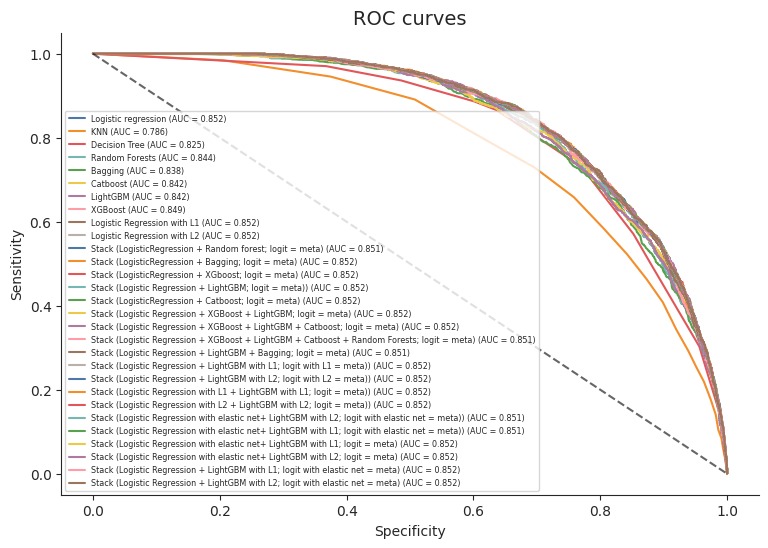

In [ ]:
# prompt: from tutorial4 import rocplot
# fig, ax = rocplot(y_valid, y_prob, labels=pd.Series(rows))
# plt.show() but legend i want itvery small

from matplotlib.pyplot import legend
from tutorial4 import rocplot

fig, ax = rocplot(y_valid, y_prob, labels=pd.Series(rows))
plt.legend(fontsize='xx-small')  # Set the fontsize of the legend to 'xx-small'
plt.show()

For final models selected in report

In [ ]:
from sklearn.metrics import confusion_matrix, roc_auc_score, precision_score, log_loss

columns2 = ['Loss', 'SE', 'Sensitivity', 'Specificity', 'Precision', 'AUC', 'Cross-entropy']
rows2 = ['Logistic regression', 'Decision Tree','Logistic Regression with L2',
         'Stack (Logistic Regression with L2 + LightGBM with L2; logit = meta))'
  ]  # Updated rows

results = pd.DataFrame(0.0, columns=columns2, index=rows2)

methods = [logit, clf, logit_l2, stack13]  # Updated methods list



y_valid = np.ravel(y_valid)
y_prob = np.zeros((len(y_valid), len(rows2)))

for i, method in enumerate(methods):
    y_prob[:, i] = method.predict_proba(X_valid)[:, 1]
    y_pred = (y_prob[:, i] > tau).astype(int)

    loss = (y_pred != y_valid).astype(int)

    tn, fp, fn, tp = confusion_matrix(y_valid, y_pred).ravel()

    results.iloc[i, 0] = np.mean(loss)
    results.iloc[i, 1] = np.std(loss) / np.sqrt(len(y_valid))
    results.iloc[i, 2] = tp / (tp + fn)
    results.iloc[i, 3] = tn / (tn + fp)
    results.iloc[i, 4] = precision_score(y_valid, y_pred)
    results.iloc[i, 5] = roc_auc_score(y_valid, y_prob[:, i])
    results.iloc[i, 6] = log_loss(y_valid, y_prob[:, i])

results.round(6)

[LightGBM] [Warning] min_data_in_leaf is set=1, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=1.0, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1.0
[LightGBM] [Warning] lambda_l2 is set=0.0, reg_lambda=1.0 will be ignored. Current value: lambda_l2=0.0
[LightGBM] [Warning] lambda_l1 is set=0.0, reg_alpha=0 will be ignored. Current value: lambda_l1=0.0
[LightGBM] [Warning] bagging_fraction is set=0.74, subsample=1.0 will be ignored. Current value: bagging_fraction=0.74


,Loss,SE,Sensitivity,Specificity,Precision,AUC,Cross-entropy
Logistic regression,0.195769,0.004913,0.655586,0.833824,0.439901,0.851808,0.325797
Decision Tree,0.194389,0.004900,0.570637,0.852390,0.434905,0.824563,0.346422
Logistic Regression with L2,0.195309,0.004909,0.654663,0.834559,0.440646,0.851741,0.325884
Stack (Logistic Regression with L2 + LightGBM with L2; logit = meta)),0.166794,0.004616,0.567867,0.886029,0.497976,0.851708,0.342739


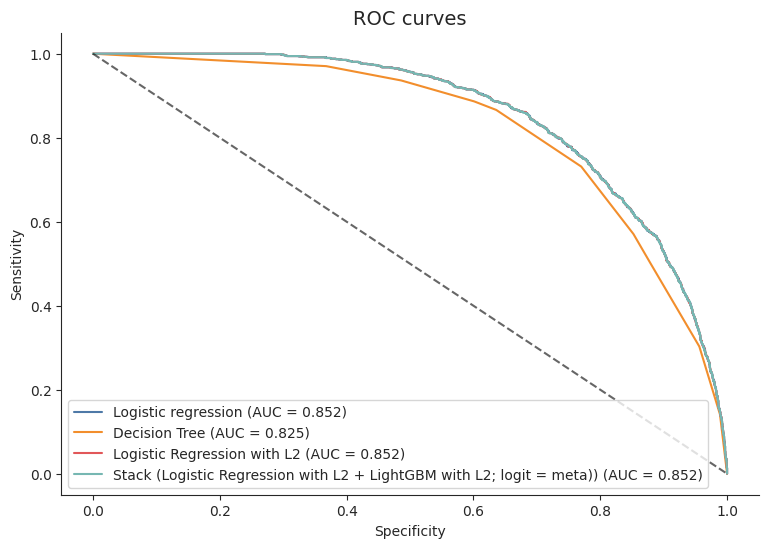

In [ ]:
from matplotlib.pyplot import legend
from tutorial4 import rocplot

fig, ax = rocplot(y_valid, y_prob, labels=pd.Series(rows2))
plt.legend()  # Set the fontsize of the legend to 'xx-small'
plt.show()